# Home Credit Default Risk (HCDR)


The course project is based on the [Home Credit Default Risk (HCDR)  Kaggle Competition](https://www.kaggle.com/c/home-credit-default-risk/). The goal of this project is to predict whether or not a client will repay a loan. In order to make sure that people who struggle to get loans due to insufficient or non-existent credit histories have a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.


## Some of the challenges

1. Dataset size 
   * (688 meg uncompressed) with millions of rows of data
   * 2.71 Gig of data uncompressed
* Dealing with missing data
* Imbalanced datasets
* Summarizing transaction data


# Kaggle API setup
Kaggle is a Data Science Competition Platform which shares a lot of datasets. In the past, it was troublesome to submit your result as your have to go through the console in your browser and drag your files there. Now you can interact with Kaggle via the command line. E.g., 

```bash
! kaggle competitions files home-credit-default-risk
```

It is quite easy to setup, it takes me less than 15 minutes to finish a submission.

1. Install library
* Create a API Token (edit your profile on [Kaggle.com](https://www.kaggle.com/)); this produces `kaggle.json` file
* Put your JSON `kaggle.json` in the right place
* Access competition files; make submissions via the command (see examples below)
* Submit result

For more detailed information on setting the Kaggle API see [here](https://medium.com/@nokkk/make-your-kaggle-submissions-with-kaggle-official-api-f49093c04f8a) and [here](https://github.com/Kaggle/kaggle-api).



In [ ]:
!pip install kaggle

In [ ]:
pwd

In [ ]:
!mkdir ~/.kaggle
!cp /root/shared/Downloads/kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
! kaggle competitions files home-credit-default-risk

<h1 style = "font-family: Times New Roman;background-color:#CbC3E3	">Notebook Index:</h1>

<a href = '#phase_1'> <h2> Phase 1</h2> </a>
<a href = '#phase_2'> <h2> Phase 2</h2> </a>
<a href = '#phase_3'> <h2> Phase 3</h2> </a>

<a href = '#kaggle_1'> <h2> Kaggle Submission Phase1</h2> </a>
<a href = '#kaggle_2'> <h2> Kaggle Submission Phase2</h2> </a>




# Dataset and how to download


## Back ground Home Credit Group

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

### Home Credit Group

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.


## Background on the dataset
Home Credit is a non-banking financial institution, founded in 1997 in the Czech Republic.

The company operates in 14 countries (including United States, Russia, Kazahstan, Belarus, China, India) and focuses on lending primarily to people with little or no credit history which will either not obtain loans or became victims of untrustworthly lenders.

Home Credit group has over 29 million customers, total assests of 21 billions Euro, over 160 millions loans, with the majority in Asia and and almost half of them in China (as of 19-05-2018).

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

## Data files overview
There are 7 different sources of data:

* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [ ]:
# ![alt](home_credit.png "Home credit")

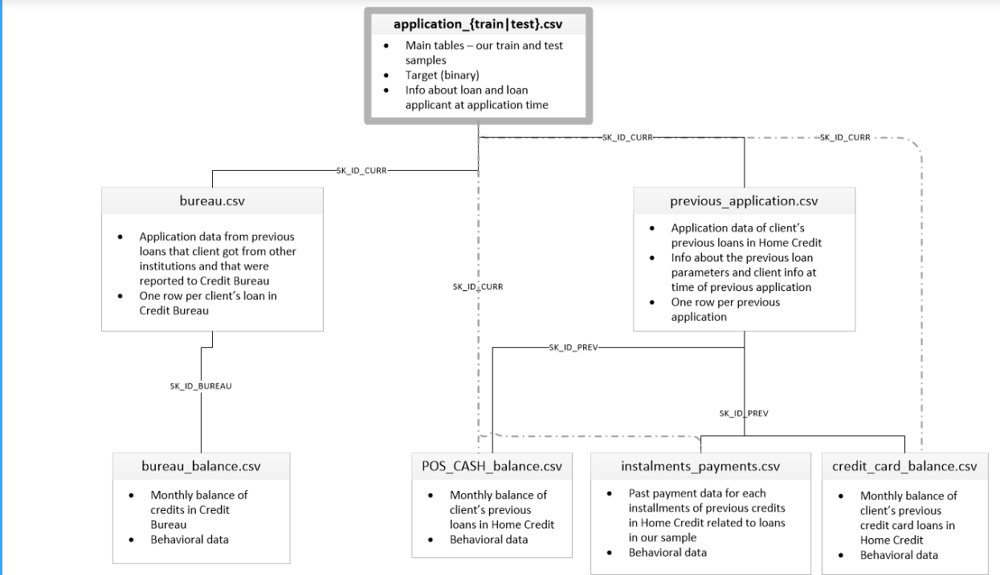

## Downloading the files via Kaggle API

Create a base directory:

```bash
DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
```

Please download the project data files and data dictionary and unzip them using either of the following approaches:

1. Click on the `Download` button on the following [Data Webpage](https://www.kaggle.com/c/home-credit-default-risk/data) and unzip the  zip file to the `BASE_DIR`
2. If you plan to use the Kaggle API, please use the following steps.


<div id='phase_1'><h1> Phase 1 </h1></div>

In [ ]:
DATA_DIR = r'C:\Users\abuba\HCDR Final\home-credit-default-risk'


In [ ]:
!ls -l $DATA_DIR

In [ ]:
! kaggle competitions download home-credit-default-risk -p $DATA_DIR

### Imports


In [1]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
unzippingReq = False
if unzippingReq: #please modify this code 
    zip_ref = zipfile.ZipFile('application_train.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('application_test.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('bureau_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('bureau.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('credit_card_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('installments_payments.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('POS_CASH_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('previous_application.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()

## Data files overview
### Data Dictionary

As part of the data download comes a  Data Dictionary. It named `HomeCredit_columns_description.csv`

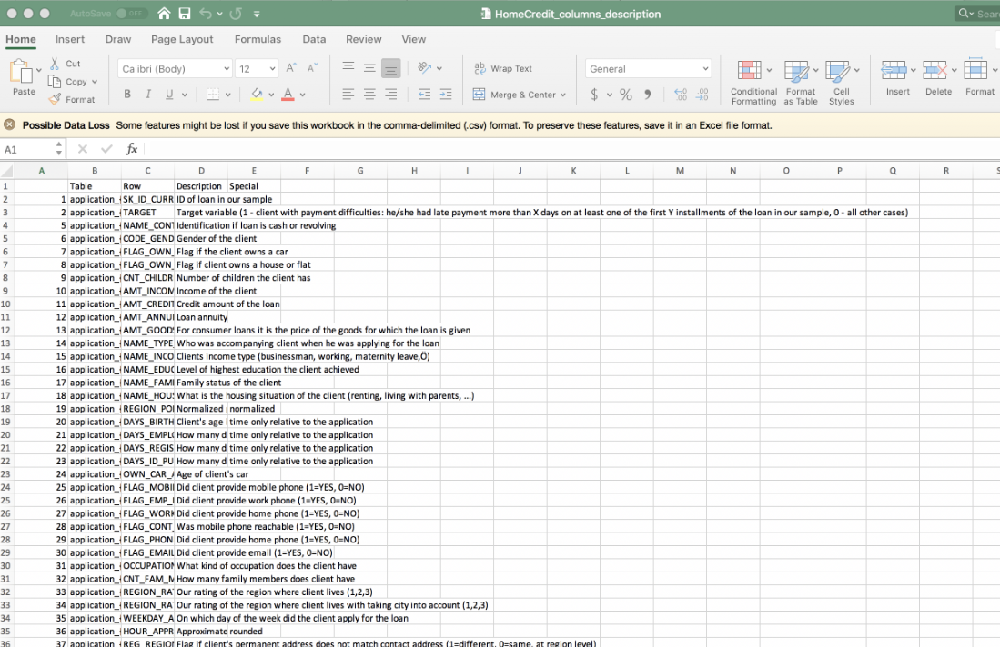

### Application train


In [3]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')

def load_data(in_path, name):
    df = pd.read_csv(in_path)
    print(f"{name}: shape is {df.shape}")
    print(df.info())
    display(df.head(5))
    return df

datasets={}  # lets store the datasets in a dictionary so we can keep track of them easily
# ds_name = 'application_train'
# path = DATA_DIR+f'\{ds_name}.csv'
# print(path)
datasets['application_train'] = pd.read_csv('application_train.csv')
# datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

datasets['application_train'].shape

(307511, 122)

### Application test


* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.


In [4]:
datasets['application_test'] = pd.read_csv('application_test.csv')

### The Other datasets

* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [5]:
%%time
ds_names = ("application_train", "application_test", "bureau","bureau_balance","credit_card_balance","installments_payments",
            "previous_application","POS_CASH_balance")

for ds_name in ds_names:
    datasets[ds_name] = pd.read_csv(f'{ds_name}.csv')


CPU times: total: 23.8 s
Wall time: 23.9 s


In [6]:
for ds_name in datasets.keys():
    print(f'dataset {ds_name:24}: [ {datasets[ds_name].shape[0]:10,}, {datasets[ds_name].shape[1]}]')


dataset application_train       : [    307,511, 122]
dataset application_test        : [     48,744, 121]
dataset bureau                  : [  1,716,428, 17]
dataset bureau_balance          : [ 27,299,925, 3]
dataset credit_card_balance     : [  3,840,312, 23]
dataset installments_payments   : [ 13,605,401, 8]
dataset previous_application    : [  1,670,214, 37]
dataset POS_CASH_balance        : [ 10,001,358, 8]


# Exploratory Data Analysis and Visual Exploratory Data Analysis

## Summary of Application train

In [7]:
datasets["application_train"].info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE            object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT                    float64
 9    AMT_ANNUITY                   float64
 10   AMT_GOODS_PRICE               float64
 11   NAME_TYPE_SUITE               object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION_TYPE           object 
 14   NAME_FAMILY_STATUS            object 
 15   NAME_HOUSING_TYPE             object 
 16   REGION_POPULATION_RELATIVE    float64
 17   DAYS_BIRTH                    int64  
 18   DA

In [8]:
datasets["application_train"].shape

(307511, 122)

In [9]:
datasets["application_train"].describe() #numerical only features

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [10]:
datasets["application_test"].describe() #numerical only features

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,0.014428,4325.900393,144348.507136,3552.612035,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,-25195.000000,-17463.000000,-23722.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,-19637.000000,-2910.000000,-7459.250000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,0.018850,-15785.000000,-1293.000000,-4490.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,-12496.000000,-296.000000,-1901.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
max,456250.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,-7338.000000,365243.000000,0.000000,...,1.000000,0.0,0.0,0.0,2.000000,2.000000,2.000000,6.000000,7.000000,17.000000


In [11]:
datasets["application_test"].shape

(48744, 121)

In [12]:
datasets["application_train"].describe(include='all') 
#look at all categorical and numerical

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511,307511,307511,307511,307511.000000,3.075110e+05,3.075110e+05,307499.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
unique,NaN,NaN,2,3,2,2,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,278232,202448,202924,213312,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,278180.518577,0.080729,NaN,NaN,NaN,NaN,0.417052,1.687979e+05,5.990260e+05,27108.573909,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,NaN,NaN,NaN,NaN,0.722121,2.371231e+05,4.024908e+05,14493.737315,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,2.565000e+04,4.500000e+04,1615.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.125000e+05,2.700000e+05,16524.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.471500e+05,5.135310e+05,24903.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,NaN,NaN,NaN,NaN,1.000000,2.025000e+05,8.086500e+05,34596.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000


<h2 style = "font-family: Times New Roman;background-color:#CbC3E3	"> Data  Description </h2>

* In this dataset we have a total of 122 columns.
* There are a lot of columns which have missing values in the dataset.
* As we can already see that there are so many missing values in the top 10 rows itself.
* We'll have to figure out a way to deal with thid!


In [13]:
datasets['application_train'].corrwith(datasets['application_train']["TARGET"]).sort_values(ascending = True)

EXT_SOURCE_3                  -0.178919
EXT_SOURCE_2                  -0.160472
EXT_SOURCE_1                  -0.155317
DAYS_EMPLOYED                 -0.044932
FLOORSMAX_AVG                 -0.044003
                                 ...   
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
TARGET                         1.000000
Length: 106, dtype: float64

As we can see above, we attempted to comprehend the feature correlation by determining the correlation of several independent characteristics in the dataset with the dependent variable or the target variable. We can see that there are just a few columns that are relevant to the target variable, therefore it is all the. It is becoming more difficult for us to make forecasts. Let's see how things go from here!

## Missing data for application train and test

In [14]:
percent = (datasets["application_train"].isnull().sum()/datasets["application_train"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_train"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Train Missing Count"])
missing_application_train_data.head(20)

,Percent,Train Missing Count
COMMONAREA_MEDI,69.87,214865
COMMONAREA_AVG,69.87,214865
COMMONAREA_MODE,69.87,214865
NONLIVINGAPARTMENTS_MODE,69.43,213514
NONLIVINGAPARTMENTS_AVG,69.43,213514
NONLIVINGAPARTMENTS_MEDI,69.43,213514
FONDKAPREMONT_MODE,68.39,210295
LIVINGAPARTMENTS_MODE,68.35,210199
LIVINGAPARTMENTS_AVG,68.35,210199
LIVINGAPARTMENTS_MEDI,68.35,210199


In [15]:
datasets['application_train'].isnull().sum()

SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
Length: 122, dtype: int64

In [16]:
datasets['application_train'].shape


(307511, 122)

In [17]:
percent = (datasets["application_test"].isnull().sum()/datasets["application_test"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_test"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_train_data.head(20)

,Percent,Test Missing Count
COMMONAREA_AVG,68.72,33495
COMMONAREA_MODE,68.72,33495
COMMONAREA_MEDI,68.72,33495
NONLIVINGAPARTMENTS_AVG,68.41,33347
NONLIVINGAPARTMENTS_MODE,68.41,33347
NONLIVINGAPARTMENTS_MEDI,68.41,33347
FONDKAPREMONT_MODE,67.28,32797
LIVINGAPARTMENTS_AVG,67.25,32780
LIVINGAPARTMENTS_MODE,67.25,32780
LIVINGAPARTMENTS_MEDI,67.25,32780


<AxesSubplot:>

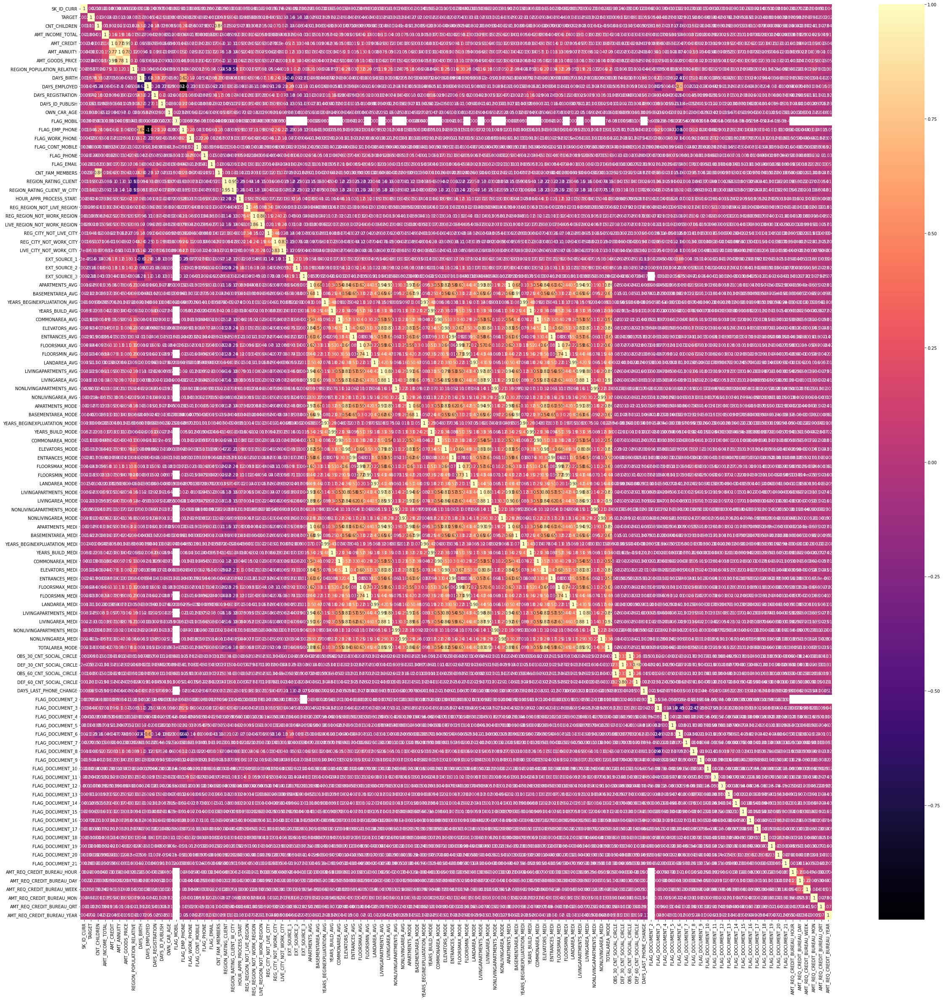

In [18]:
plt.figure(figsize=(40,40))
sns.heatmap(datasets['application_train'].corr(),annot=True, cmap='magma')


In [19]:
datasets["application_test"].columns

Index(['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=121)

## Distribution of the target column 

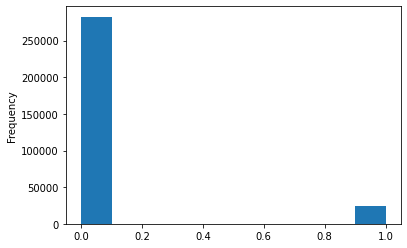

In [20]:
datasets["application_train"]['TARGET'].astype(int).plot.hist();

## Dealing with missing values

In [21]:
mis_val_percent = 100*datasets["application_train"].isnull().sum()/len(datasets["application_train"])

In [22]:
mis_val_percent

SK_ID_CURR                     0.000000
TARGET                         0.000000
NAME_CONTRACT_TYPE             0.000000
CODE_GENDER                    0.000000
FLAG_OWN_CAR                   0.000000
                                ...    
AMT_REQ_CREDIT_BUREAU_DAY     13.501631
AMT_REQ_CREDIT_BUREAU_WEEK    13.501631
AMT_REQ_CREDIT_BUREAU_MON     13.501631
AMT_REQ_CREDIT_BUREAU_QRT     13.501631
AMT_REQ_CREDIT_BUREAU_YEAR    13.501631
Length: 122, dtype: float64

In [23]:
miss_in_values = datasets['application_train'].isnull().sum()

miss_in_values_percent = 100*datasets['application_train'].isnull().sum()/len(datasets['application_train'])

miss_in_values_table = pd.concat([miss_in_values, miss_in_values_percent],axis=1)

miss_in_values_table_ren_columns = miss_in_values_table.rename(columns={0:'Missing Values',1:'Percent of Total Values'})

miss_in_values_table_ren_columns = miss_in_values_table_ren_columns[miss_in_values_table_ren_columns.iloc[:,1]!=0].sort_values('Percent of Total Values',ascending=False).round(1)

miss_in_values_table_ren_columns

,Missing Values,Percent of Total Values
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
...,...,...
EXT_SOURCE_2,660,0.2
AMT_GOODS_PRICE,278,0.1
AMT_ANNUITY,12,0.0
CNT_FAM_MEMBERS,2,0.0


In [24]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\abuba\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [25]:
df = datasets['application_train'].copy()

In [26]:
import missingno as msno


<AxesSubplot:>

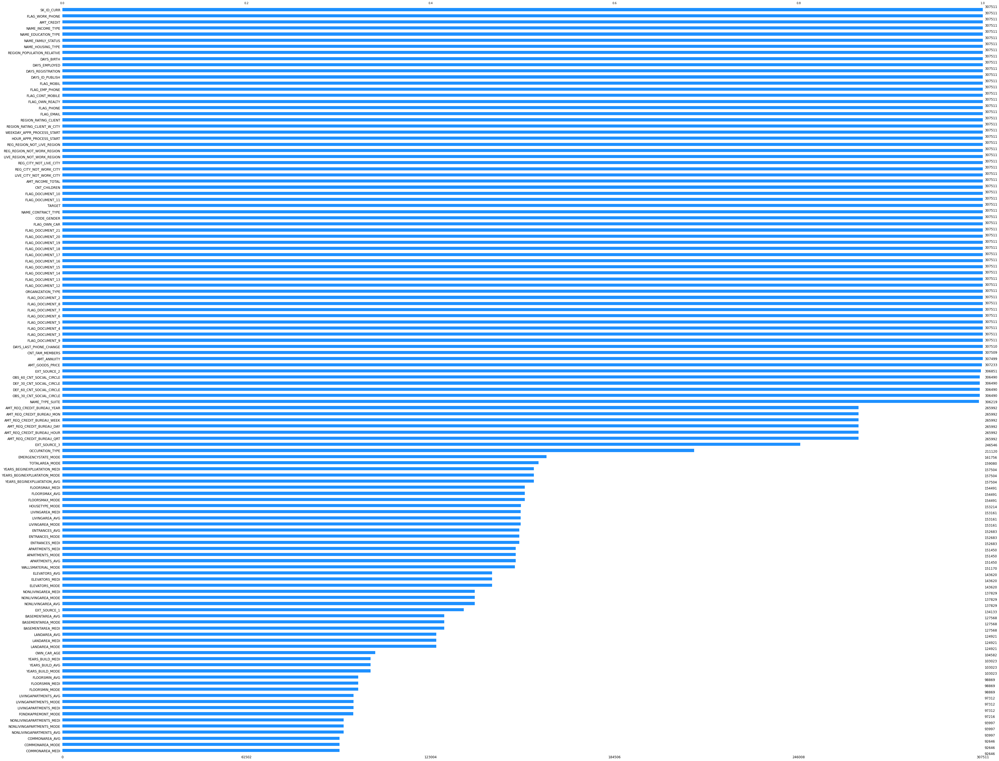

In [27]:
msno.bar(df, color="dodgerblue", sort="ascending", figsize=(60,50), fontsize=12)


## Correlation with  the target column 

In [28]:
corr_ = datasets["application_train"].corr()['TARGET'].sort_values()
print('Positive Correlations:', corr_.tail(10))
print('Most Negative Correlations:', corr_.head(10))

Positive Correlations: FLAG_DOCUMENT_3                0.044346
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
TARGET                         1.000000
Name: TARGET, dtype: float64
Most Negative Correlations: EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
DAYS_EMPLOYED                -0.044932
FLOORSMAX_AVG                -0.044003
FLOORSMAX_MEDI               -0.043768
FLOORSMAX_MODE               -0.043226
AMT_GOODS_PRICE              -0.039645
REGION_POPULATION_RELATIVE   -0.037227
ELEVATORS_AVG                -0.034199
Name: TARGET, dtype: float64


In [29]:
top_50 = datasets['application_train'][datasets['application_train'].columns[datasets['application_train'].isnull().sum()>0.5]]

<Figure size 4320x2880 with 0 Axes>

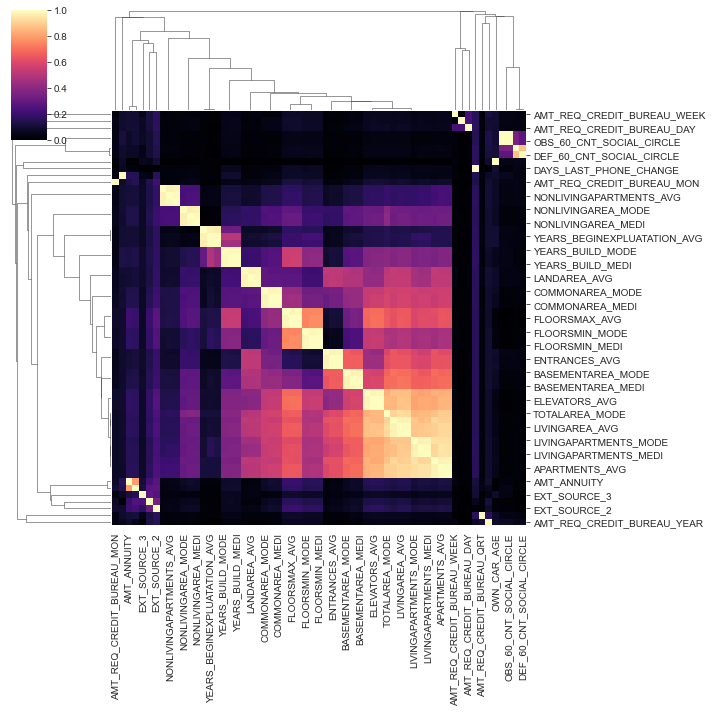

In [30]:
plt.figure(figsize=(60,40))

sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
sns.clustermap(top_50.corr(), metric="correlation", method="single", cmap="magma", standard_scale=1)
plt.show()

<AxesSubplot:>

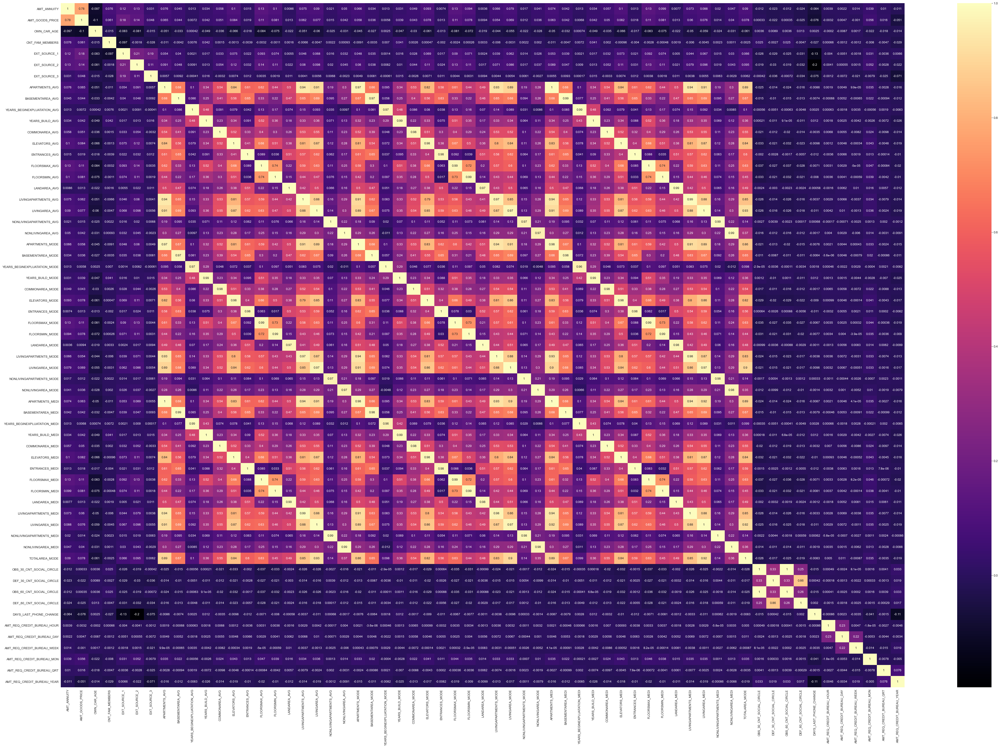

In [31]:
plt.figure(figsize=(60,40))
sns.heatmap(top_50.corr(),annot=True,cmap='magma')

In [32]:
datasets['application_train'] = datasets['application_train'].drop(['TOTALAREA_MODE','ELEVATORS_AVG','LIVINGAPARTMENTS_AVG',
                                                                    'LIVINGAREA_AVG','APARTMENTS_MODE','ELEVATORS_MODE',
                                                                    'LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE'
                                             ,'APARTMENTS_MEDI','ELEVATORS_MEDI','LIVINGAPARTMENTS_MEDI','LIVINGAREA_MEDI','NONLIVINGAREA_MEDI','NONLIVINGAPARTMENTS_MEDI','FLOORSMIN_MEDI',
                                                                    'FLOORSMAX_MEDI','ENTRANCES_MEDI','FLOORSMAX_MODE','FLOORSMIN_MODE','BASEMENTAREA_MEDI',
                                                                    'BASEMENTAREA_MODE','YEARS_BUILD_MEDI','NONLIVINGAPARTMENTS_MODE','NONLIVINGAREA_MODE','YEARS_BUILD_MEDI',
                                            'YEARS_BUILD_MODE','YEARS_BEGINEXPLUATATION_MEDI','YEARS_BEGINEXPLUATATION_MODE','COMMONAREA_MEDI','COMMONAREA_MODE',
                                                                    'ENTRANCES_MODE','LANDAREA_MODE','LANDAREA_MEDI','DEF_30_CNT_SOCIAL_CIRCLE','OBS_30_CNT_SOCIAL_CIRCLE',
                                                                    'REG_CITY_NOT_LIVE_CITY','REGION_RATING_CLIENT',
                                                                   'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'FLOORSMIN_AVG','DAYS_LAST_PHONE_CHANGE',
                                                                       'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG',
                                                                    'LIVE_CITY_NOT_WORK_CITY','LIVE_REGION_NOT_WORK_REGION','AMT_GOODS_PRICE',
                                                                   'CNT_CHILDREN'],axis=1)

We will deal with them in such a manner that we drop the repeating features, i.e. delete one of those columns that are highly correlated with each other, whenever we realize that there are numerous independent or feature variables that are related to each other. As you can see, I've deleted all of the columns that are connected to one another, leaving only one!

## Applicants Age 

Text(0, 0.5, 'Density')

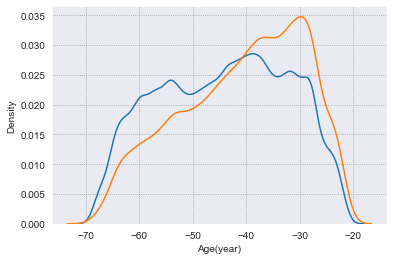

In [33]:
sns.kdeplot(datasets['application_train'].loc[datasets['application_train']['TARGET']==0,'DAYS_BIRTH']/365,label='target==0')
sns.kdeplot(datasets['application_train'].loc[datasets['application_train']['TARGET']==1,'DAYS_BIRTH']/365,label='target==1')
plt.xlabel('Age(year)')
plt.ylabel('Density')


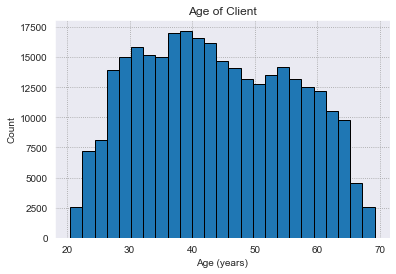

In [34]:
plt.hist(datasets["application_train"]['DAYS_BIRTH'] / -365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

## Exterior Sources

In [35]:
ex_data=datasets["application_train"][['TARGET','EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3','DAYS_BIRTH']]
ex_data_corrs=ex_data.corr()
ex_data_corrs

,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH
TARGET,1.000000,-0.155317,-0.160472,-0.178919,0.078239
EXT_SOURCE_1,-0.155317,1.000000,0.213982,0.186846,-0.600610
EXT_SOURCE_2,-0.160472,0.213982,1.000000,0.109167,-0.091996
EXT_SOURCE_3,-0.178919,0.186846,0.109167,1.000000,-0.205478
DAYS_BIRTH,0.078239,-0.600610,-0.091996,-0.205478,1.000000


<Figure size 4320x2880 with 0 Axes>

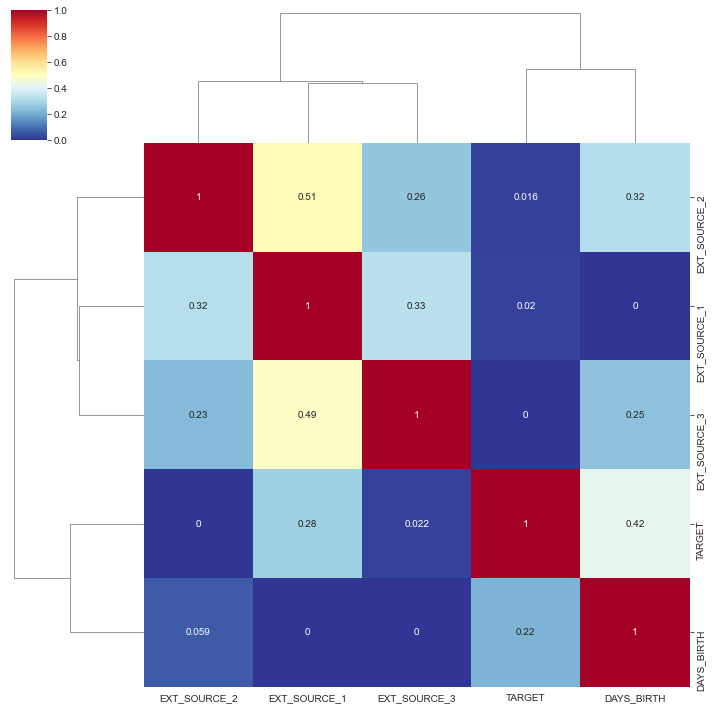

In [36]:
plt.figure(figsize=(60,40))

sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
sns.clustermap(ex_data_corrs, metric="correlation", method="single", cmap="RdYlBu_r", standard_scale=1,annot=True)
plt.show()

## Applicants occupations

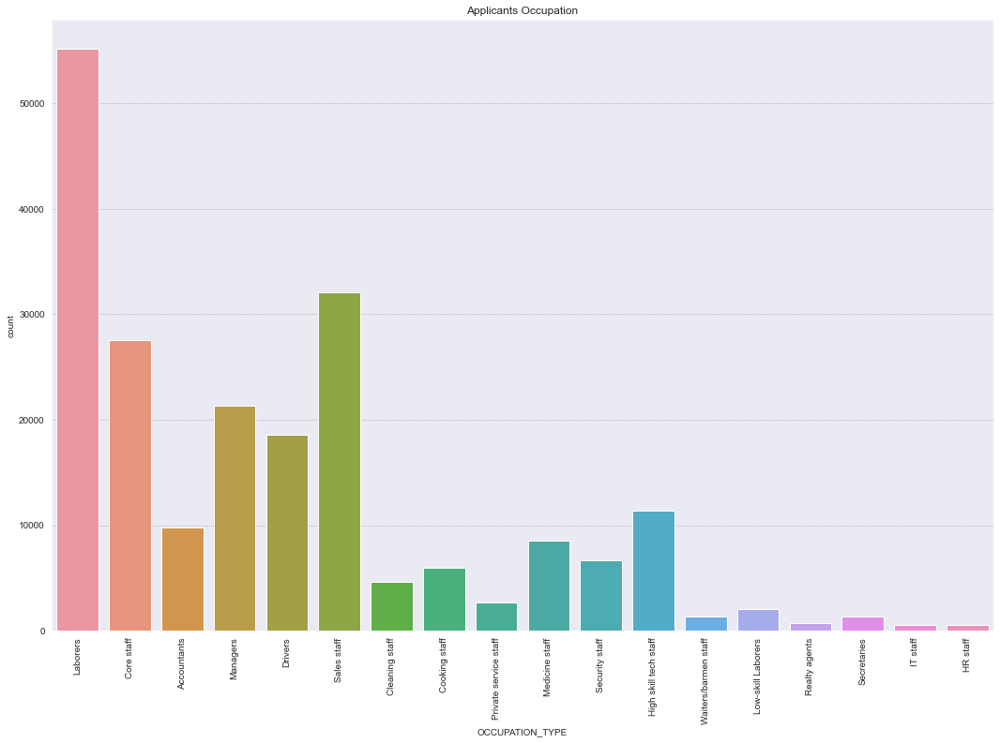

In [37]:
plt.figure(figsize=(18,12))

sns.countplot(x='OCCUPATION_TYPE', data=datasets["application_train"],);
plt.title('Applicants Occupation');
plt.xticks(rotation=90);

## Visualization Through Suite Type with respect to Target variable

<AxesSubplot:title={'center':'Type of the Suite'}, xlabel='NAME_TYPE_SUITE', ylabel='count'>

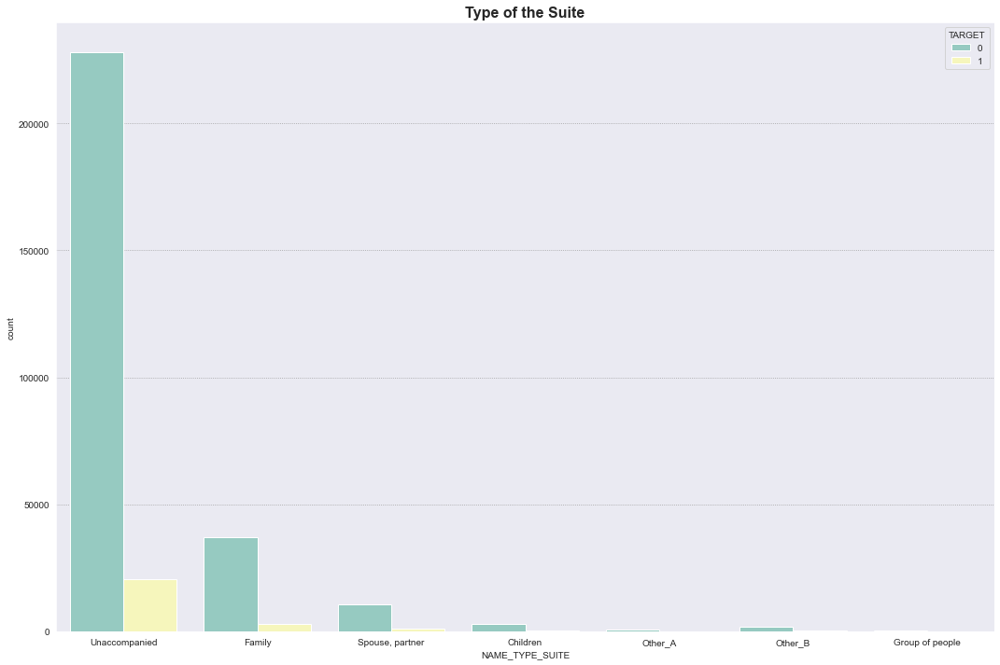

In [38]:
plt.figure(figsize=(18,12))
plt.title("Type of the Suite", fontweight = 'bold', fontsize = 16)
sns.countplot(datasets['application_train']['NAME_TYPE_SUITE'], hue=datasets['application_train']['TARGET'], palette = 'Set3')

* We've drawn a graph above that shows the family members of the loan application.
* As we can see from the chart above, there are a large number of people who are  alone, followed by their families.

## Visualization of the Applicant's Family Members Count in Relation to the Target Variable

<AxesSubplot:title={'center':"Applicant's Family Members Count Distribution"}, xlabel='CNT_FAM_MEMBERS', ylabel='count'>

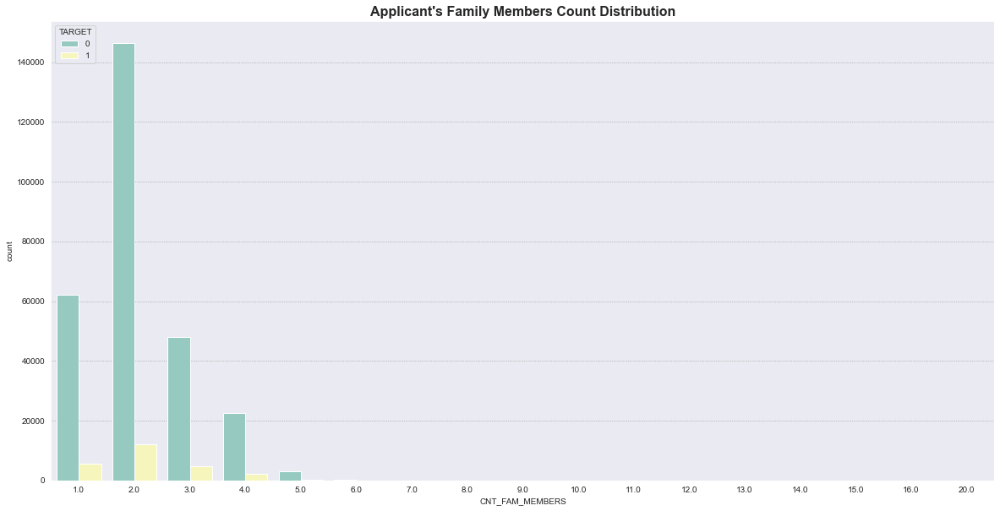

In [39]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (20,10))
plt.title("Applicant's Family Members Count Distribution", fontweight = 'bold', fontsize = 16)
sns.countplot(datasets['application_train']['CNT_FAM_MEMBERS'],hue=datasets['application_train']['TARGET'], palette = 'Set3')

## Column correlation with regard to the Target Variable

In [40]:
datasets['application_train'].corrwith(datasets['application_train']["TARGET"]).sort_values(ascending = False)

TARGET                         1.000000
DAYS_BIRTH                     0.078239
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_ID_PUBLISH                0.051457
REG_CITY_NOT_WORK_CITY         0.050994
FLAG_EMP_PHONE                 0.045982
FLAG_DOCUMENT_3                0.044346
DAYS_REGISTRATION              0.041975
OWN_CAR_AGE                    0.037612
DEF_60_CNT_SOCIAL_CIRCLE       0.031276
FLAG_WORK_PHONE                0.028524
AMT_REQ_CREDIT_BUREAU_YEAR     0.019930
CNT_FAM_MEMBERS                0.009308
OBS_60_CNT_SOCIAL_CIRCLE       0.009022
REG_REGION_NOT_WORK_REGION     0.006942
REG_REGION_NOT_LIVE_REGION     0.005576
FLAG_DOCUMENT_2                0.005417
FLAG_DOCUMENT_21               0.003709
AMT_REQ_CREDIT_BUREAU_DAY      0.002704
AMT_REQ_CREDIT_BUREAU_HOUR     0.000930
AMT_REQ_CREDIT_BUREAU_WEEK     0.000788
FLAG_MOBIL                     0.000534
FLAG_CONT_MOBILE               0.000370
FLAG_DOCUMENT_20               0.000215
FLAG_DOCUMENT_5               -0.000316


In [41]:
corr_with_target = pd.DataFrame(datasets['application_train'].corrwith(datasets['application_train']["TARGET"]).sort_values(ascending = False)).reset_index()
corr_with_target = corr_with_target.rename(columns={'index':'Column_name',0:'corr_with_target'})

In [42]:
corr_with_target.head()

,Column_name,corr_with_target
0,TARGET,1.000000
1,DAYS_BIRTH,0.078239
2,REGION_RATING_CLIENT_W_CITY,0.060893
3,DAYS_ID_PUBLISH,0.051457
4,REG_CITY_NOT_WORK_CITY,0.050994


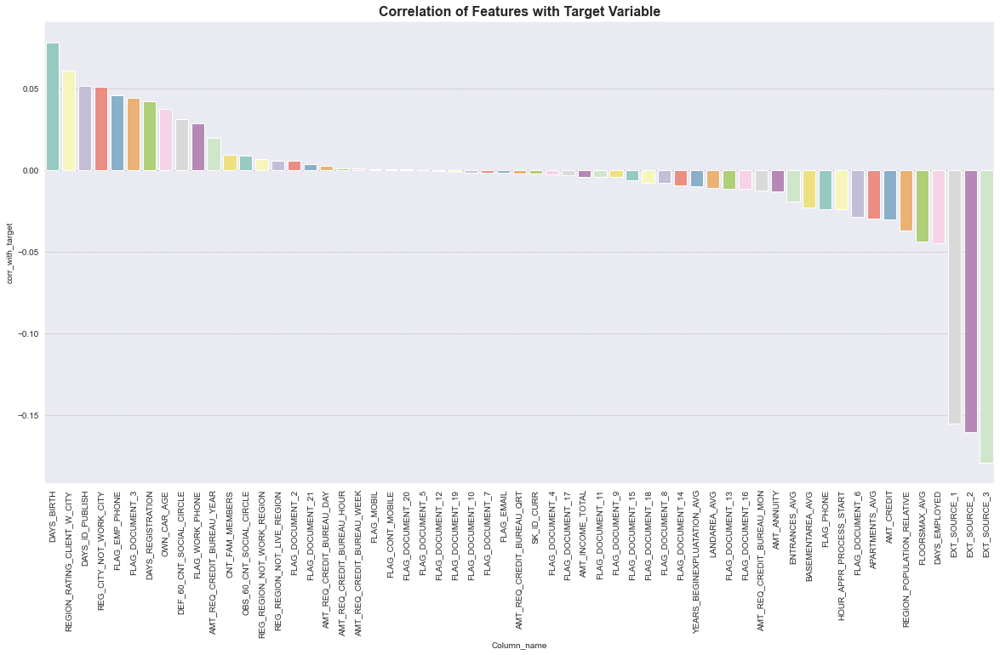

In [43]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (20,10))
sns.barplot(data=corr_with_target,x=corr_with_target['Column_name'][1:], y= corr_with_target['corr_with_target'][1:], palette = 'Set3')
plt.xticks(rotation=90)
plt.title('Correlation of Features with Target Variable', fontweight = 'bold', fontsize = 16)
plt.show()

We've drawn a graph showing all the characteristics' association with the target variable above. As can be seen above, around 30% of the traits are not at all associated with the target variable. We may disregard these since I do not believe they will have any effect on our projections of the target variable!

In [44]:
datasets['application_train'] = datasets['application_train'].drop(['AMT_REQ_CREDIT_BUREAU_HOUR',
'AMT_REQ_CREDIT_BUREAU_WEEK', 
'FLAG_MOBIL',                    
'FLAG_CONT_MOBILE',              
'FLAG_DOCUMENT_20',              
'FLAG_DOCUMENT_5',               
'FLAG_DOCUMENT_12',              
'FLAG_DOCUMENT_19',
'FLAG_DOCUMENT_10',
'FLAG_DOCUMENT_7','REG_REGION_NOT_WORK_REGION',    
'REG_REGION_NOT_LIVE_REGION',    
'FLAG_DOCUMENT_2',               
'FLAG_DOCUMENT_21',               
'AMT_REQ_CREDIT_BUREAU_DAY',      
'FLAG_EMAIL',                    
'AMT_REQ_CREDIT_BUREAU_QRT',                    
'FLAG_DOCUMENT_4',              
'FLAG_DOCUMENT_17',             
'FLAG_DOCUMENT_11',              
'FLAG_DOCUMENT_9',              
'FLAG_DOCUMENT_15',            
'FLAG_DOCUMENT_18',             
'FLAG_DOCUMENT_8'],axis=1)

## Top 5 Negatively Correlated features with Target Variable 

In [45]:
df = pd.DataFrame(datasets['application_train'].corrwith(datasets['application_train']["TARGET"]).sort_values(ascending = False))

df.tail(5)

,0
FLOORSMAX_AVG,-0.044003
DAYS_EMPLOYED,-0.044932
EXT_SOURCE_1,-0.155317
EXT_SOURCE_2,-0.160472
EXT_SOURCE_3,-0.178919


In [46]:
corr_neg_5 = datasets['application_train'][['FLOORSMAX_AVG','DAYS_EMPLOYED','EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3','TARGET']]


In [47]:
corr_neg_5.dropna(inplace=True)
corr_neg_5.head()

,FLOORSMAX_AVG,DAYS_EMPLOYED,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,TARGET
0,0.0833,-637,0.083037,0.262949,0.139376,1
12,0.1667,-2717,0.464831,0.715042,0.176653,0
25,0.1667,-3494,0.561948,0.651406,0.461482,0
50,0.4083,-1176,0.656225,0.450850,0.479449,0
51,0.4583,-6977,0.311510,0.713355,0.309275,0


<Figure size 1440x720 with 0 Axes>

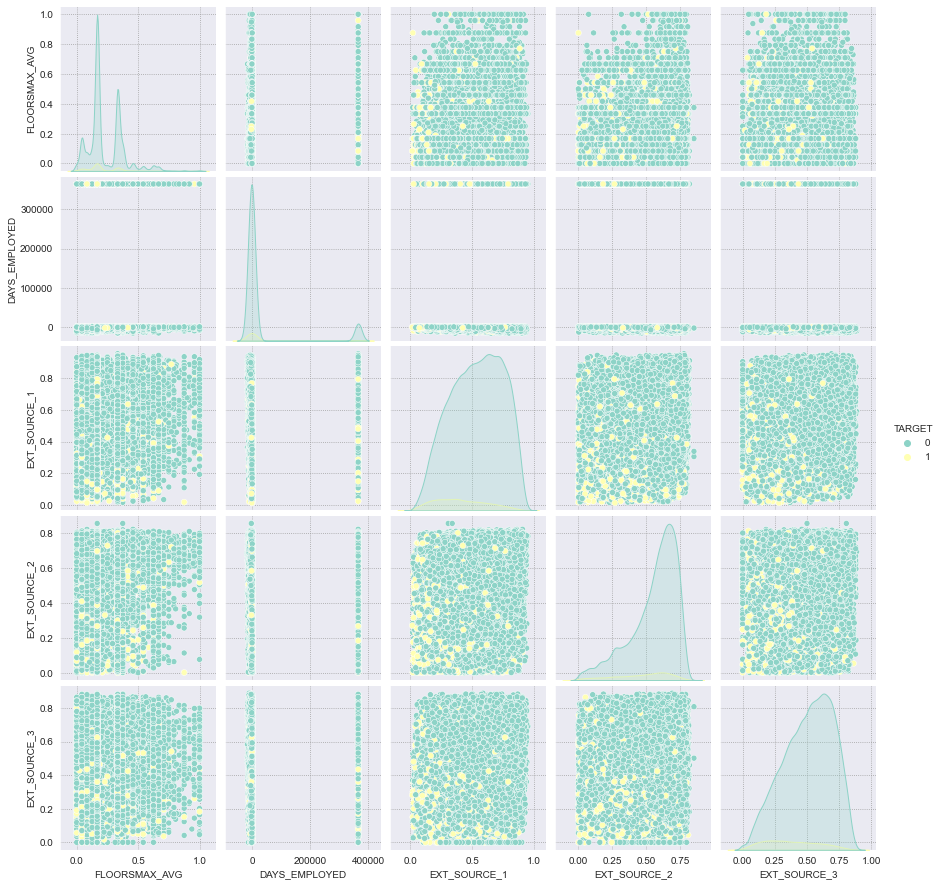

In [48]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (20,10))
sns.pairplot(corr_neg_5,palette='Set3',hue='TARGET')
plt.show()

In [49]:
tar_coorl_2 = pd.DataFrame(datasets['application_train'].corrwith(datasets['application_train']["TARGET"]).sort_values(ascending = False)).reset_index()

In [50]:
tar_coorl_2 = tar_coorl_2.rename(columns={'index':'Column_name',0:'corr_with_target'})

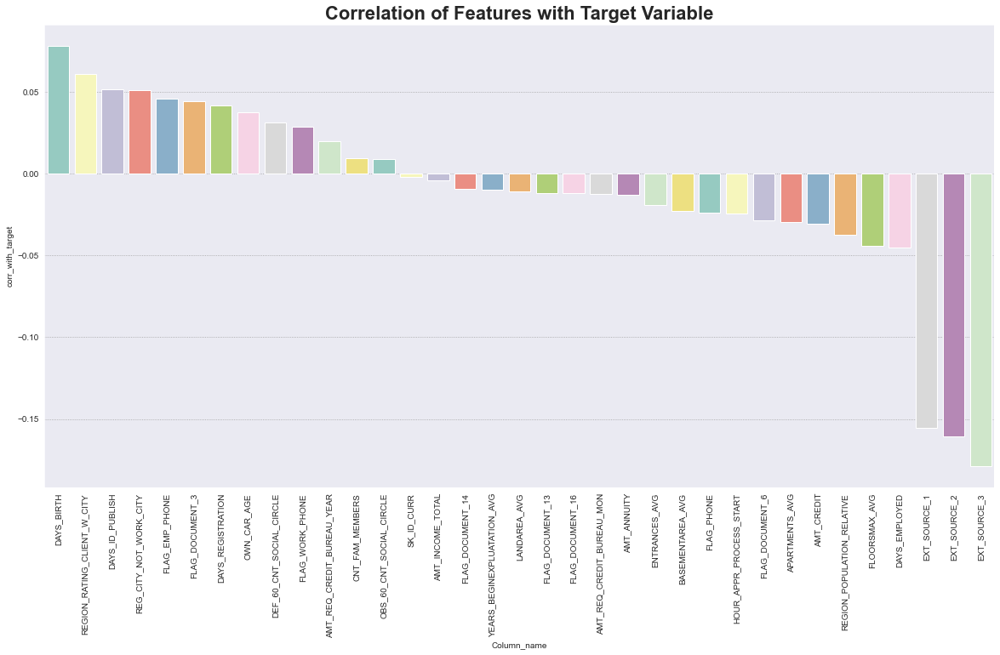

In [51]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (20,10))
sns.barplot(data=tar_coorl_2,x=tar_coorl_2['Column_name'][1:], y= tar_coorl_2['corr_with_target'][1:], palette = 'Set3')
plt.xticks(rotation=90)
plt.title('Correlation of Features with Target Variable', fontweight = 'bold', fontsize = 22)
plt.show()

After we have dropped the unimportant or unrelated columns, we have plotted the correlation with the TARGET variable! This looks so much better than before. We can see that the remaning variables are quite correlated with the TARGET Variable!

Text(0, 0.5, 'Annual Income')

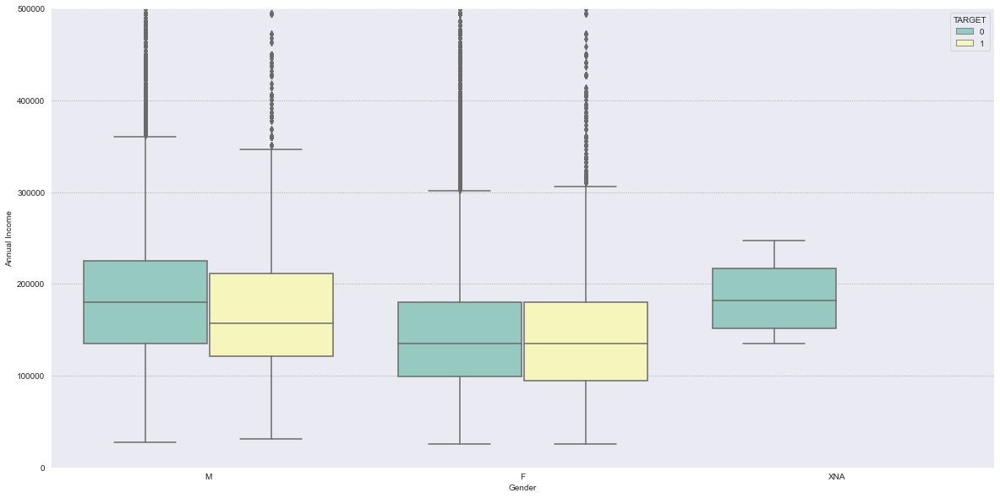

In [52]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (20,10))
sns.boxplot(x='CODE_GENDER',hue = 'TARGET',y='AMT_INCOME_TOTAL', data=datasets['application_train'],palette='Set3')
plt.ylim(0, 500000)
plt.xlabel("Gender")
plt.ylabel('Annual Income')

## Borrowers Vs Target variable
### Intutions From data

In [53]:
male_data = datasets['application_train'][datasets['application_train']['CODE_GENDER']=='M']['TARGET'].value_counts().reset_index().rename(columns={'TARGET':'user_count','index':'TARGET'})
male_data['count_percent'] = male_data['user_count']/male_data['user_count'].sum()*100
male_data['CODE_GENDER'] = 'M'
female_data = datasets['application_train'][datasets['application_train']['CODE_GENDER']=='F']['TARGET'].value_counts().reset_index().rename(columns={'TARGET':'user_count','index':'TARGET'})
female_data['count_percent'] = female_data['user_count']/female_data['user_count'].sum()*100
female_data['CODE_GENDER'] = 'F'
gender_data = male_data.append(female_data, ignore_index=True,sort=False)
gender_data

,TARGET,user_count,count_percent,CODE_GENDER
0,0,94404,89.858080,M
1,1,10655,10.141920,M
2,0,188278,93.000672,F
3,1,14170,6.999328,F


Text(0, 0.5, 'User count in Percentage')

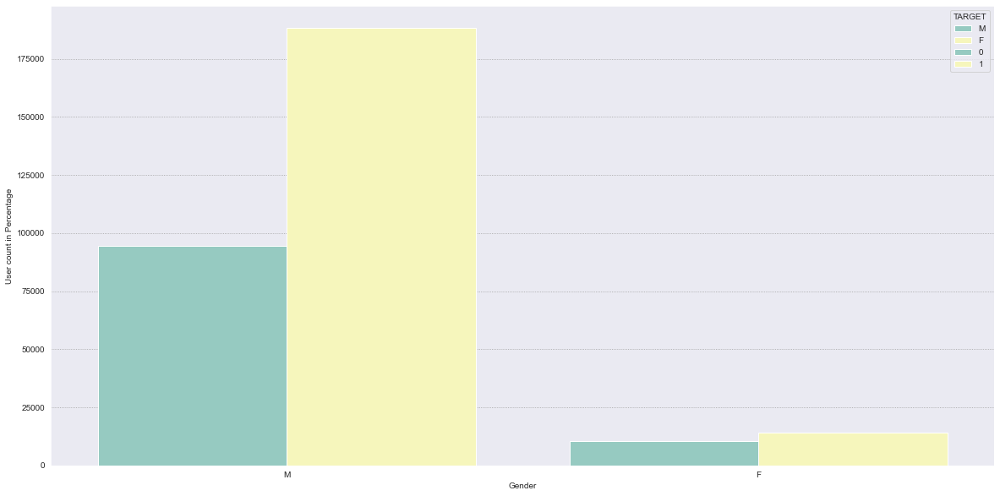

In [54]:
plt.figure(figsize=(20,10))

sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
sns.barplot(data=gender_data, x="TARGET", y="user_count", hue="CODE_GENDER",palette='Set3')
sns.barplot(data=gender_data,x="CODE_GENDER", y="count_percent", hue="TARGET",palette='Set3')

plt.xlabel("Gender")
plt.ylabel('User count in Percentage')

<AxesSubplot:title={'center':'highest borrower Male Vs Female'}, xlabel='CODE_GENDER', ylabel='count'>

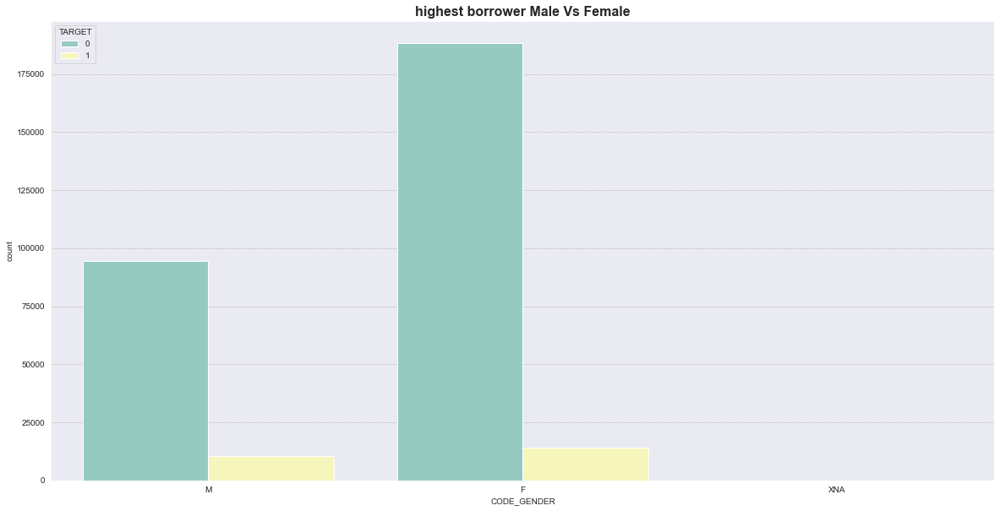

In [55]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (20,10))
plt.title("highest borrower Male Vs Female", fontweight = 'bold', fontsize = 16)
sns.countplot(x='CODE_GENDER',data=datasets['application_train'],hue='TARGET', palette = 'Set3')

In other words, there are more ladies than males in the dataset! As a result, it is reasonable to assume that FEMALES take out more loans than MALES! However, such assumption may be erroneous!

<AxesSubplot:title={'center':'Male Vs Female ,who have most number of the automobile?'}, xlabel='CODE_GENDER', ylabel='count'>

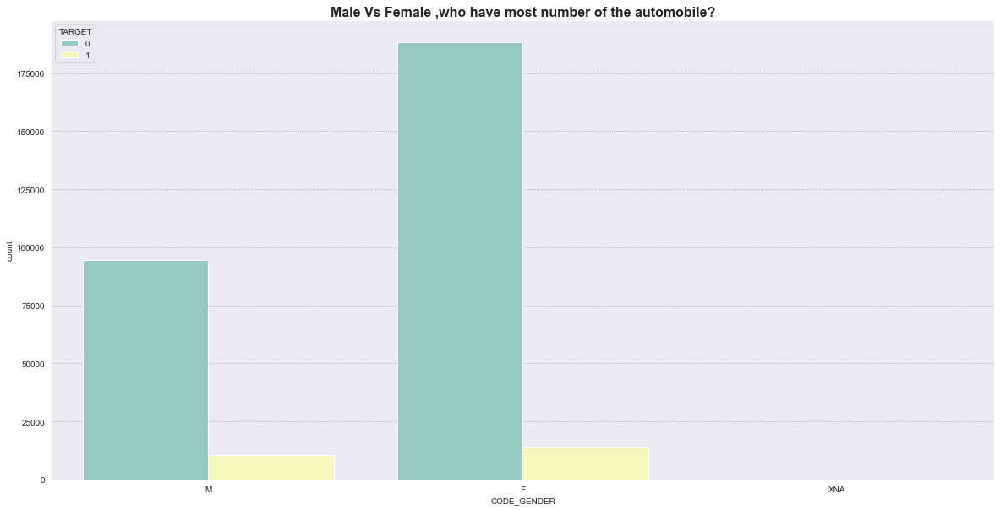

In [56]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (20,10))
plt.title("Male Vs Female ,who have most number of the automobile?", fontweight = 'bold', fontsize = 16) 
sns.countplot(x='CODE_GENDER',data= datasets['application_train'], hue='TARGET', palette="Set3")

In this plot, we have produced a graph indicating whether or not a person, i.e. a man or woman, defaults on a loan. The graph, however, indicates that the number of females is greater than the number of men. Females outnumber males in terms of automobile ownership, while males outnumber females in terms of percentage ownership.

<AxesSubplot:title={'center':'Male Vs Female , Difficult time getting Loan'}, xlabel='TARGET', ylabel='count'>

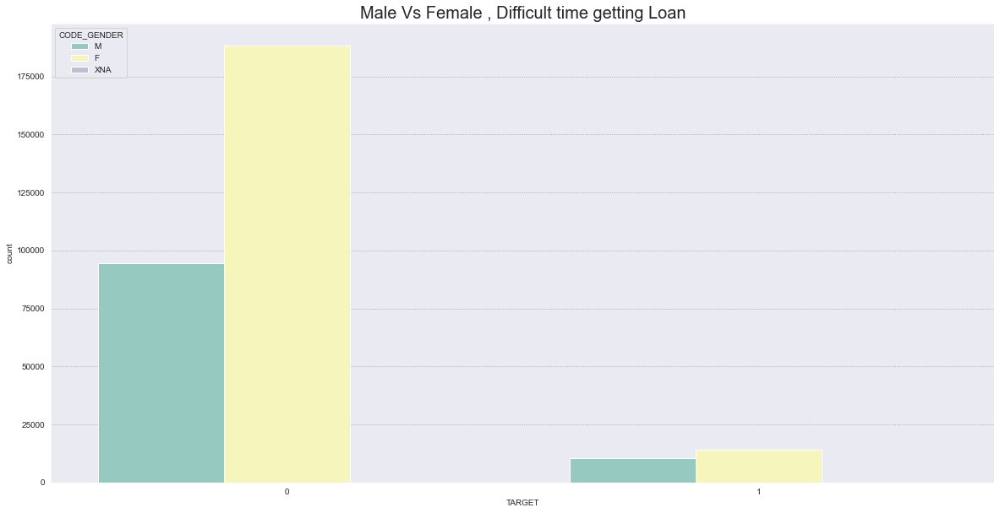

In [57]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (20,10))
plt.title("Male Vs Female , Difficult time getting Loan",fontsize= 20)
sns.countplot(x='TARGET',hue='CODE_GENDER',data=datasets['application_train'], palette = 'Set3')

It appears that Females have much more of difficulty in gettng the loans as compared to the males.


<AxesSubplot:title={'center':'Loan Default Vs Loans Type'}, xlabel='TARGET', ylabel='count'>

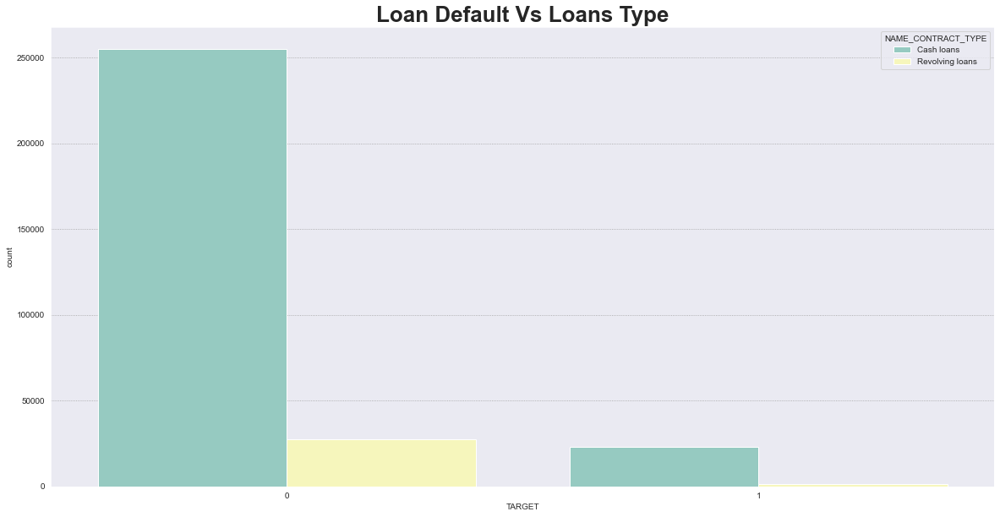

In [58]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (20,10))
plt.title("Loan Default Vs Loans Type",fontweight='bold' , fontsize =26)
sns.countplot(x='TARGET',hue='NAME_CONTRACT_TYPE',data=datasets['application_train'], palette = 'Set3')

Cash loans tend to be the most common cause of laon default.

Text(0.5, 1.0, 'Economically stablility of clients')

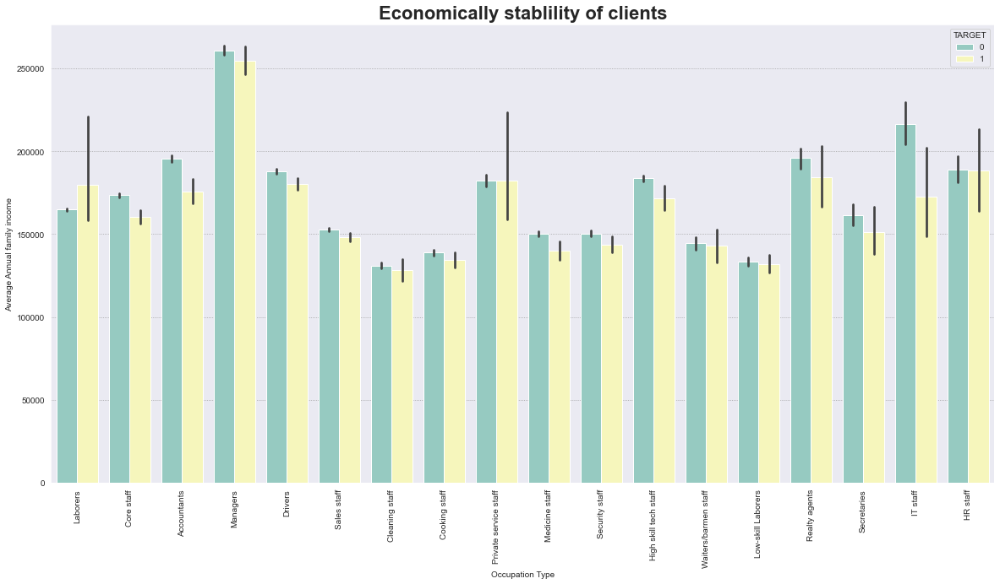

In [59]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (20,10))
sns.barplot(x='OCCUPATION_TYPE',y='AMT_INCOME_TOTAL',hue='TARGET',data=datasets['application_train'],palette='Set3')
plt.xticks(rotation=90)
plt.xlabel("Occupation Type")
plt.ylabel("Average Annual family income")
plt.title("Economically stablility of clients",fontweight='bold',fontsize=22)

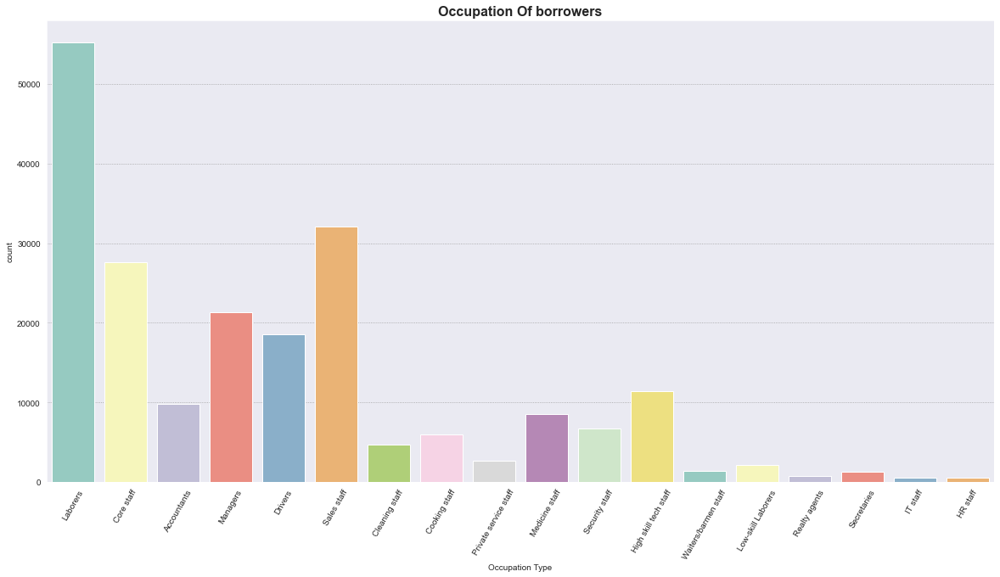

In [60]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (20,10))
sns.countplot(x='OCCUPATION_TYPE',data=datasets['application_train'], palette = 'Set3')
plt.xlabel("Occupation Type")
plt.title("Occupation Of borrowers", fontweight='bold',fontsize=16)
plt.xticks(rotation=60)
plt.show()

Text(0.5, 1.0, 'better clients who repay wrt OCCUPATION_TYPE')

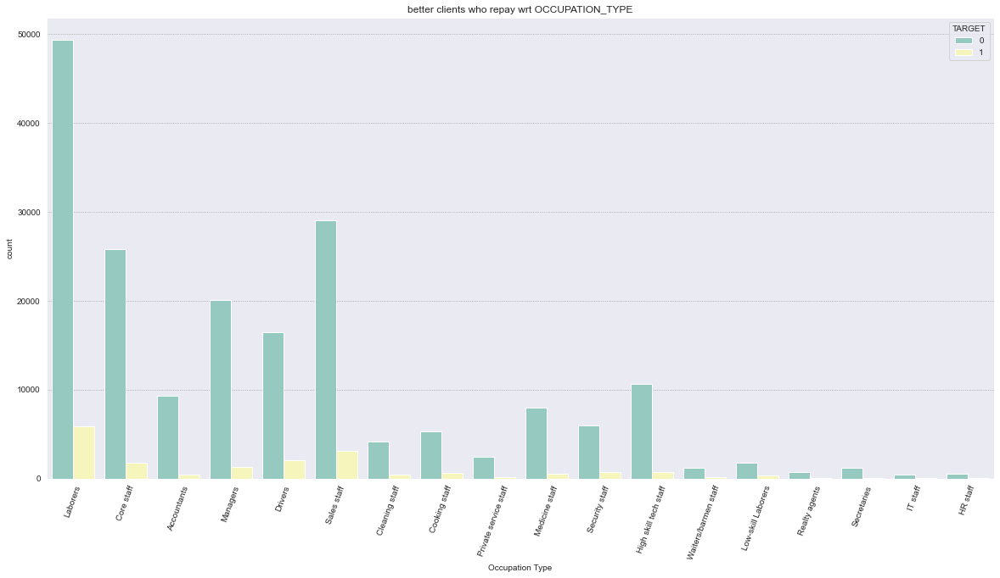

In [61]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (20,10))
sns.countplot(x='OCCUPATION_TYPE',hue='TARGET',data=datasets['application_train'],palette="Set3")
plt.xticks(rotation=70)
plt.xlabel("Occupation Type")
plt.title('better clients who repay wrt OCCUPATION_TYPE')


## Visualization of categorical and numerical data 

In [62]:
cat_data= datasets['application_train'].select_dtypes(include='object')
cat_data

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,NaN,NaN,NaN,NaN
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,Cash loans,M,N,N,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,Sales staff,THURSDAY,Services,reg oper account,block of flats,"Stone, brick",No
307507,Cash loans,F,N,Y,Unaccompanied,Pensioner,Secondary / secondary special,Widow,House / apartment,NaN,MONDAY,XNA,reg oper account,block of flats,"Stone, brick",No
307508,Cash loans,F,N,Y,Unaccompanied,Working,Higher education,Separated,House / apartment,Managers,THURSDAY,School,reg oper account,block of flats,Panel,No
307509,Cash loans,F,N,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 1,NaN,block of flats,"Stone, brick",No


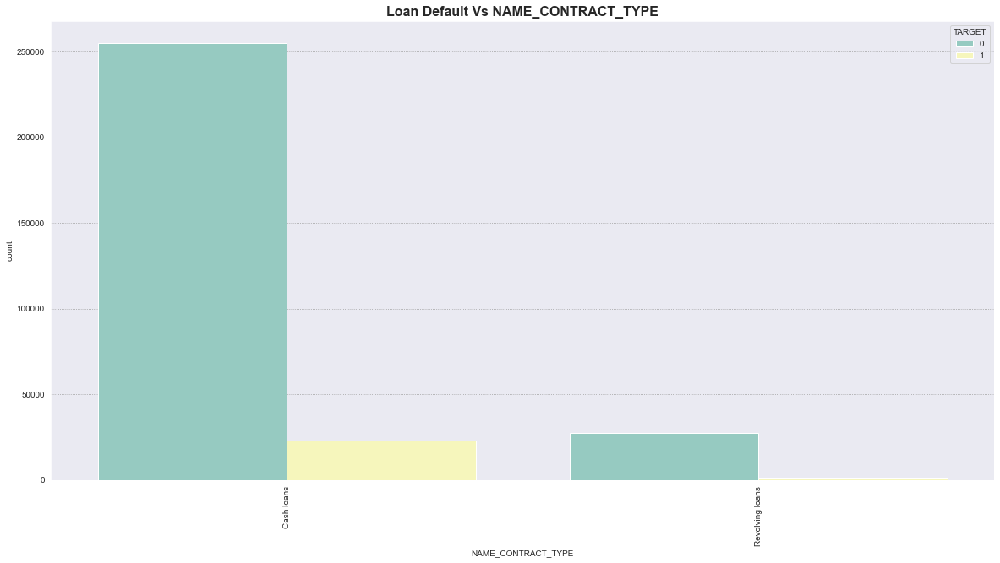

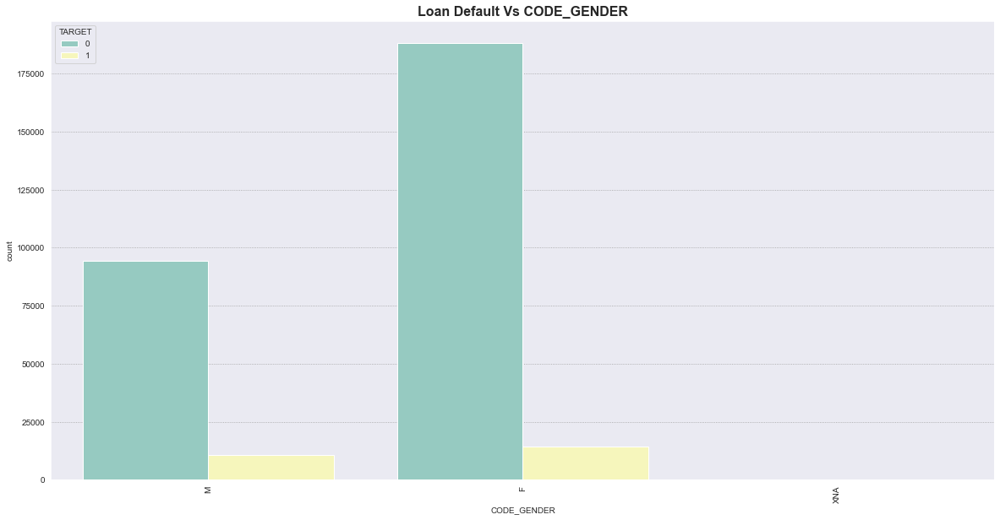

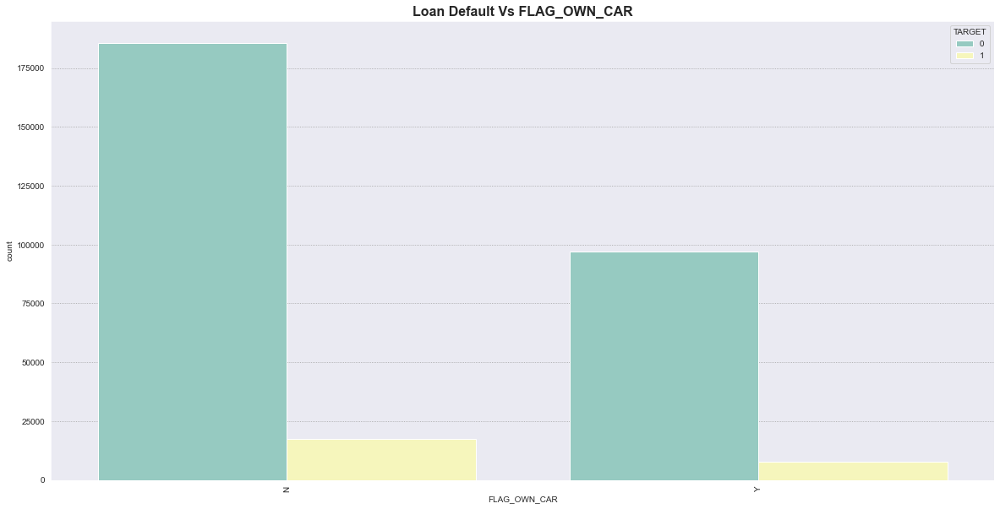

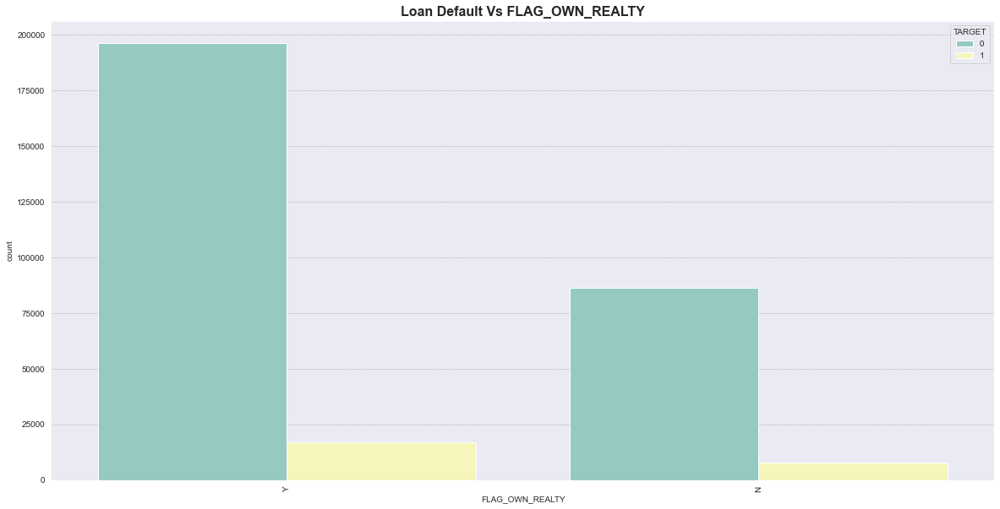

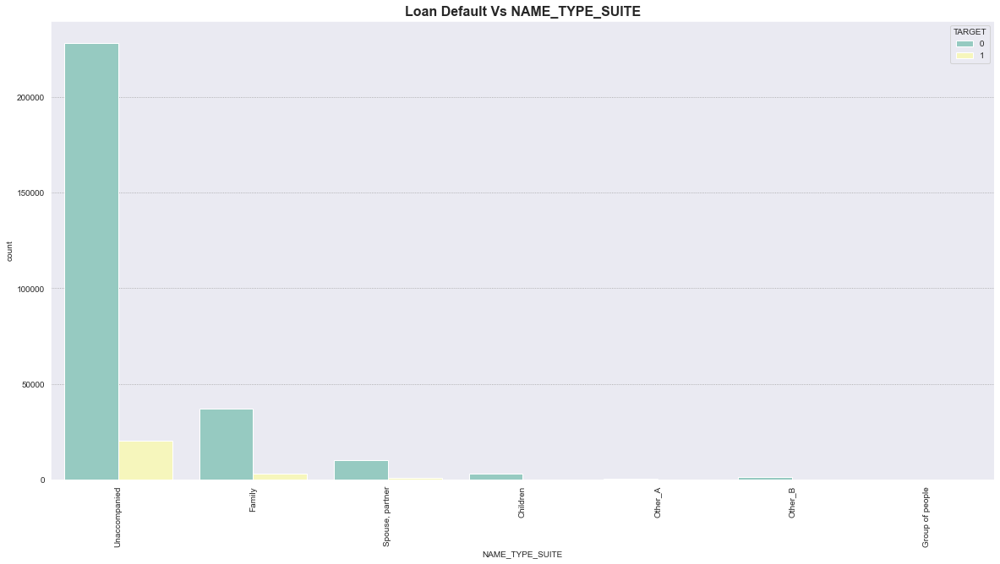

...

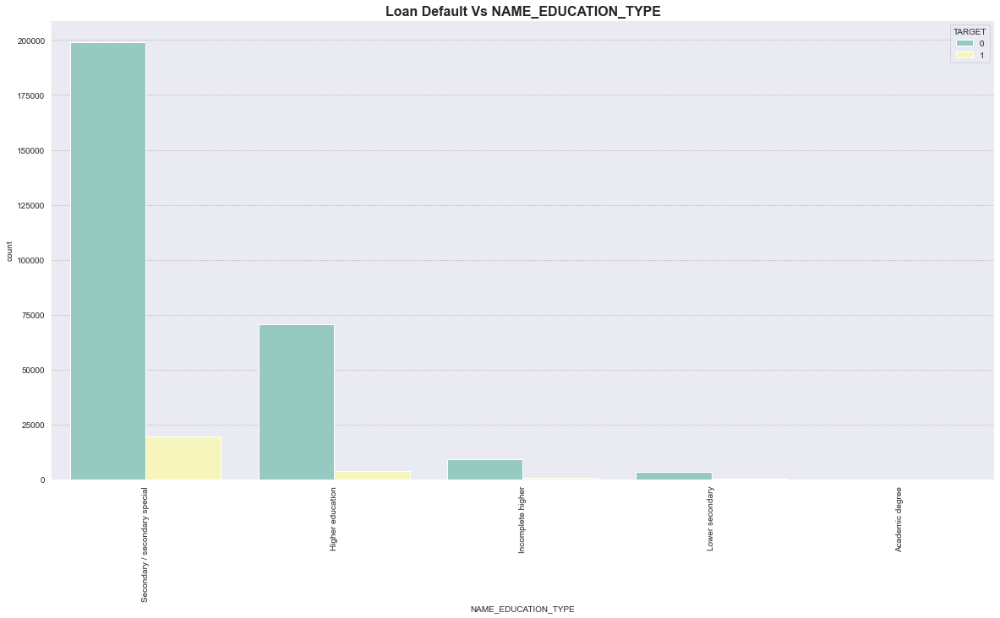

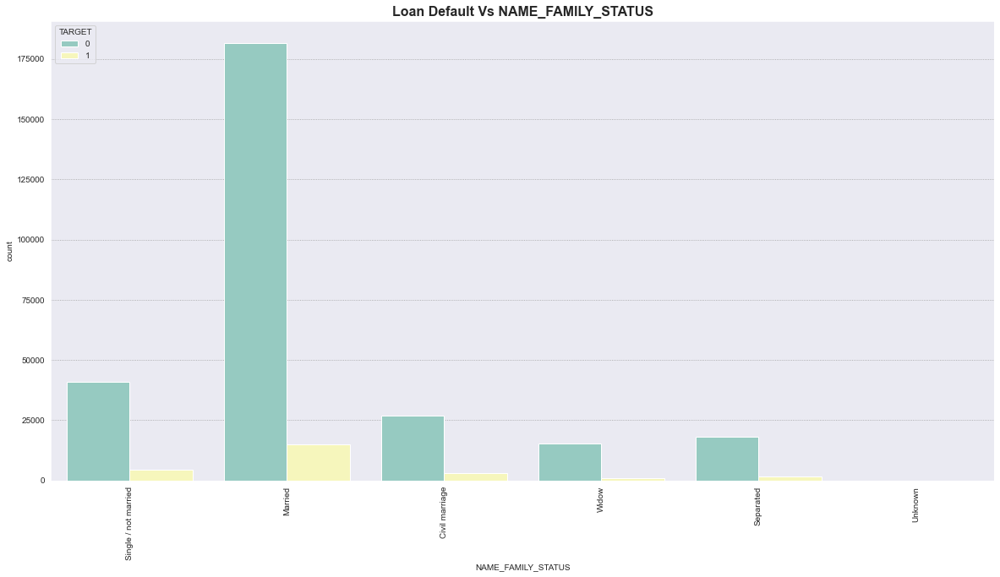

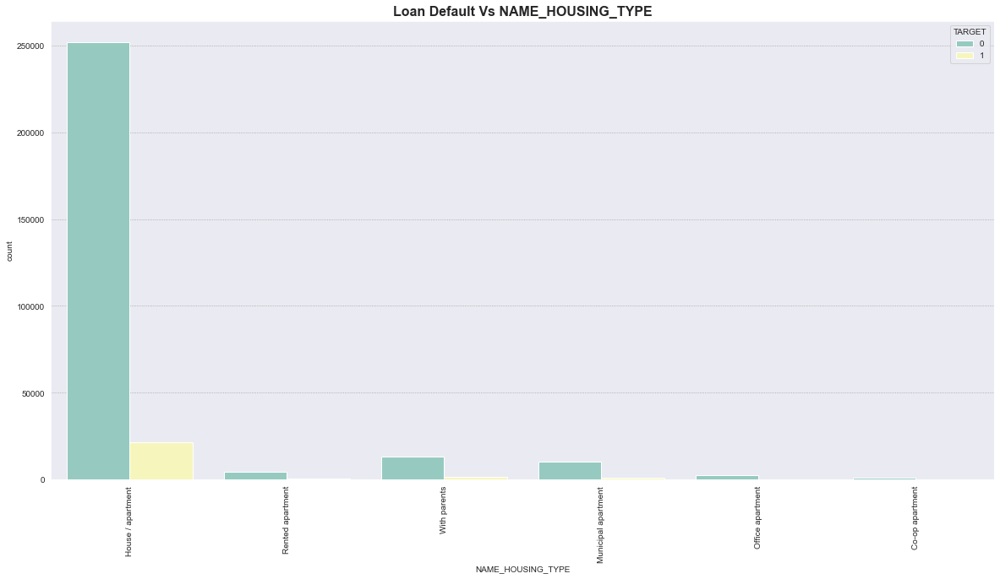

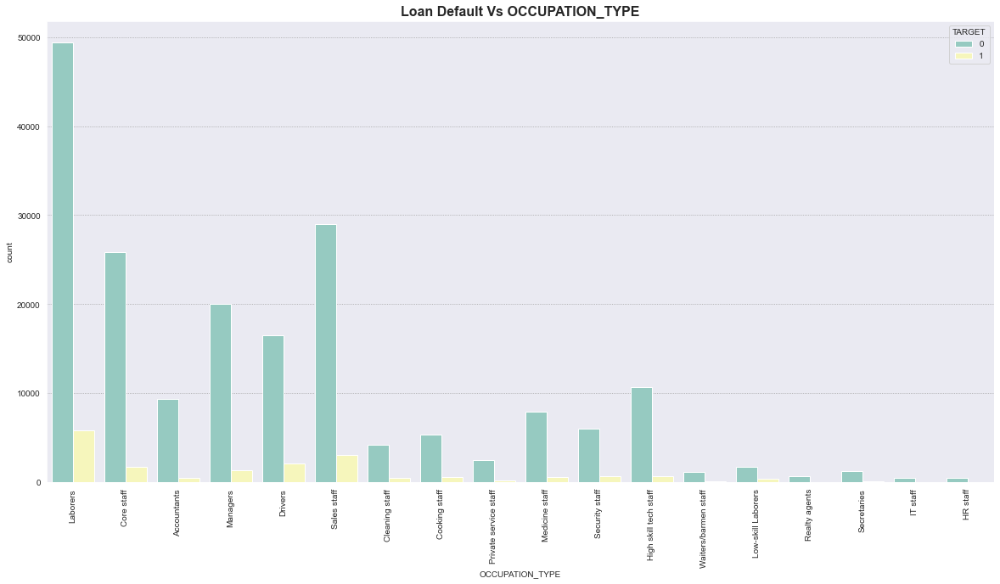

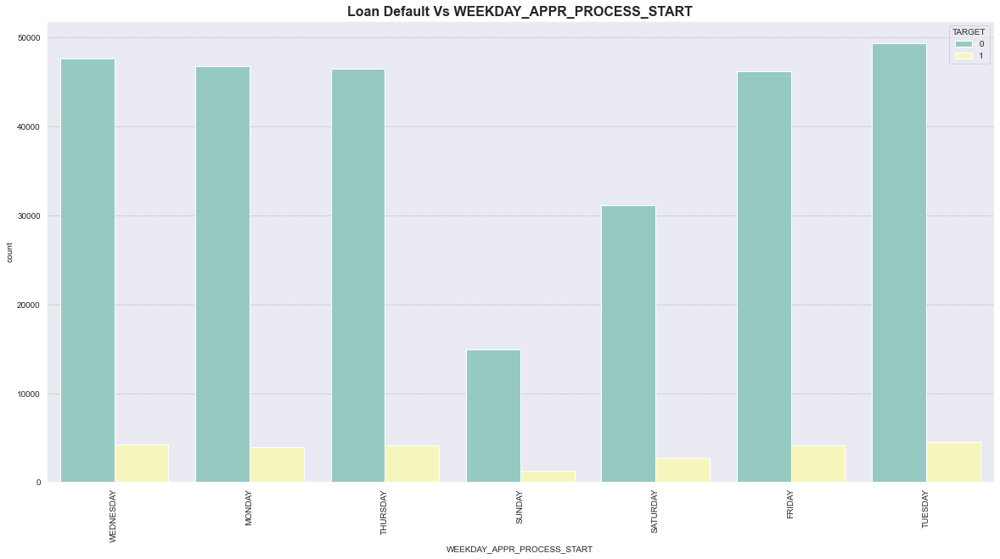

In [63]:
for cat in cat_data.columns.values[:11]:
    sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
    plt.figure(figsize = (20,10))
    title= "Loan Default Vs "+ str(cat)
    plt.title(title,fontweight='bold' , fontsize =16)
    sns.countplot(x=cat_data[cat],hue='TARGET',data=datasets['application_train'], palette = 'Set3')
    plt.xticks(rotation=90)

In [64]:
int_data= datasets['application_train'].select_dtypes(include='int64')

float_data = datasets['application_train'].select_dtypes(include='float64')

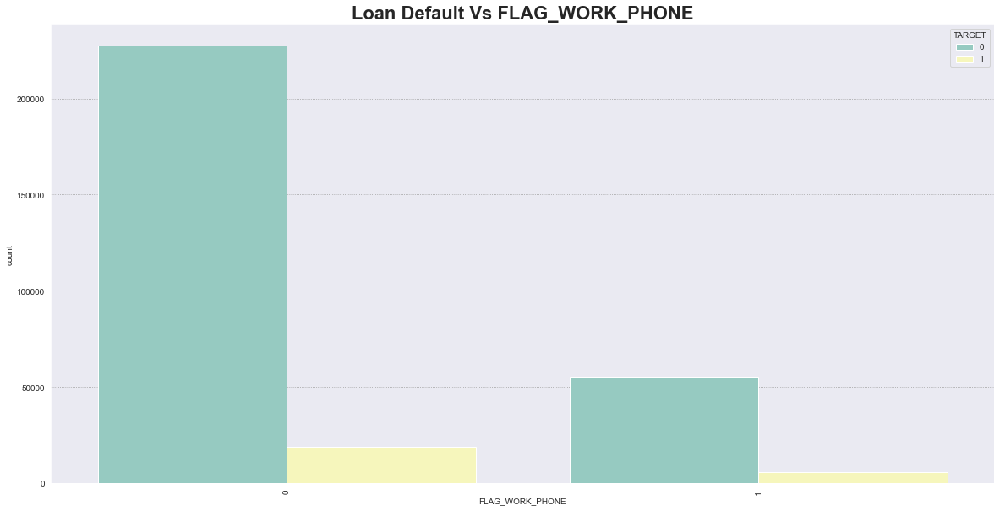

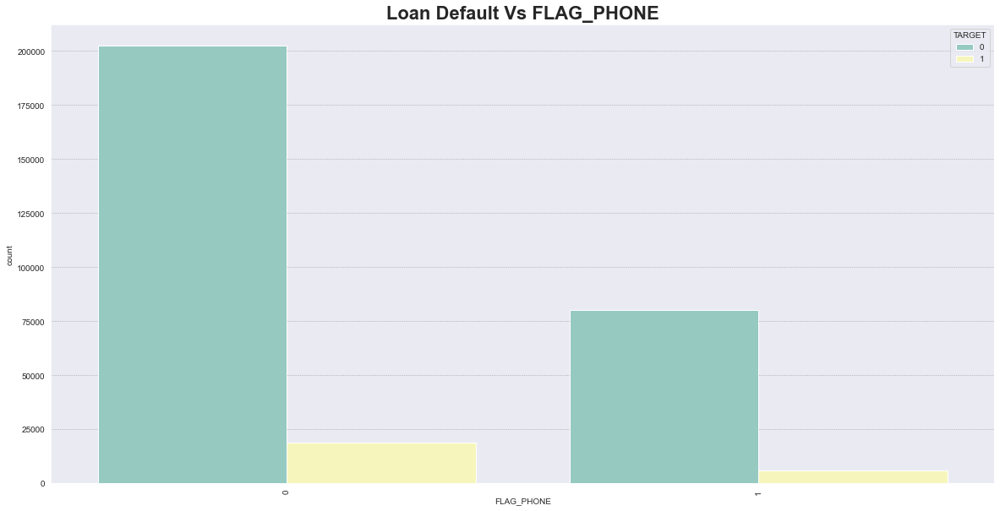

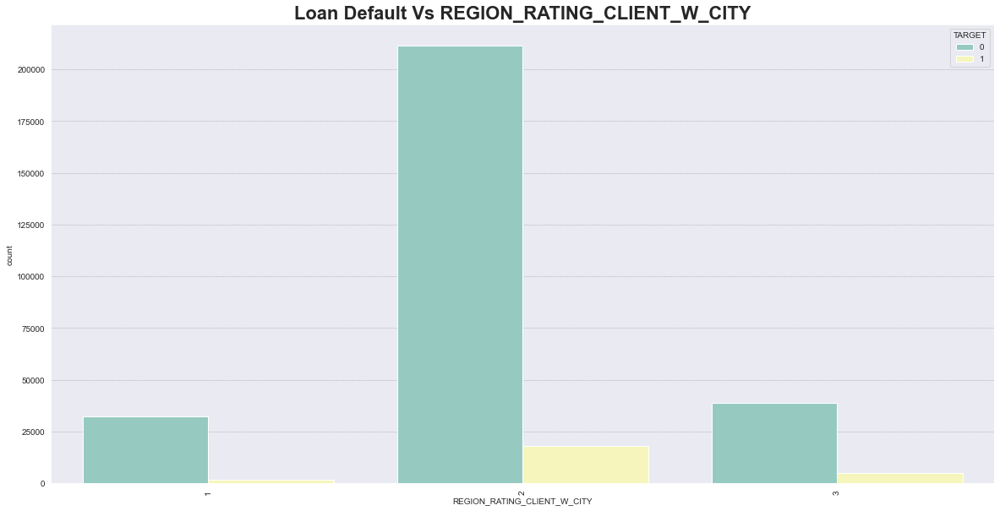

In [65]:
for integer in int_data.columns.values[6:9]:
    sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
    plt.figure(figsize = (20,10))
    title= "Loan Default Vs "+ str(integer)
    plt.title(title,fontweight='bold' , fontsize =22)
    sns.countplot(x=int_data[integer],hue='TARGET',data=datasets['application_train'], palette = 'Set3')
    plt.xticks(rotation=90)

# Dataset questions
## Unique record for each SK_ID_CURR

In [66]:
datasets.keys()

dict_keys(['application_train', 'application_test', 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 'previous_application', 'POS_CASH_balance'])

In [67]:
len(datasets["application_train"]["SK_ID_CURR"].unique()) == datasets["application_train"].shape[0]

True

In [68]:
np.intersect1d(datasets["application_train"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"])

array([], dtype=int64)

In [69]:
datasets["application_test"].shape

(48744, 121)

In [70]:
datasets["application_train"].shape

(307511, 52)

## previous applications for the submission file
The persons in the kaggle submission file have had previous applications in the `previous_application.csv`. 47,800 out 48,744 people have had previous appications.

In [71]:
appsDF = datasets["previous_application"] 

In [72]:
len(np.intersect1d(datasets["previous_application"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"]))

47800

In [73]:
print(f"There are  {appsDF.shape[0]:,} previous applications")

There are  1,670,214 previous applications


In [74]:
# How many entries are there for each month?
prevAppCounts = appsDF['SK_ID_CURR'].value_counts(dropna=False)


In [75]:
len(prevAppCounts[prevAppCounts >40])  #more that 40 previous applications

101

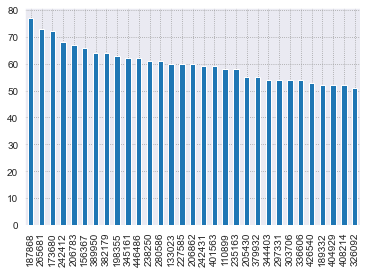

In [76]:
prevAppCounts[prevAppCounts >50].plot(kind='bar')
plt.xticks(rotation=90)
plt.show()

### Histogram of Number of previous applications for an ID


In [77]:
sum(appsDF['SK_ID_CURR'].value_counts()==1)

60458

Text(0.5, 1.0, 'Histogram of Number of previous applications for an ID')

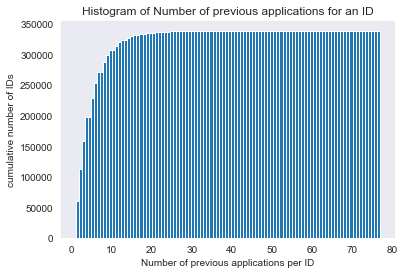

In [78]:
plt.hist(appsDF['SK_ID_CURR'].value_counts(), cumulative =True, bins = 100);
plt.grid()
plt.ylabel('cumulative number of IDs')
plt.xlabel('Number of previous applications per ID')
plt.title('Histogram of Number of previous applications for an ID')


##### **Can we differentiate applications by low, medium and high previous apps?**
    * Low = <5 claims (22%)
    * Medium = 10 to 39 claims (58%)
    * High = 40 or more claims (20%)

In [79]:
apps_all = appsDF['SK_ID_CURR'].nunique()
apps_5plus = appsDF['SK_ID_CURR'].value_counts()>=5
apps_40plus = appsDF['SK_ID_CURR'].value_counts()>=40
print('Percentage with 10 or more previous apps:', np.round(100.*(sum(apps_5plus)/apps_all),5))
print('Percentage with 40 or more previous apps:', np.round(100.*(sum(apps_40plus)/apps_all),5))

Percentage with 10 or more previous apps: 41.76895
Percentage with 40 or more previous apps: 0.03453


# Joining secondary tables with the primary table

In the case of the HCDR competition (and many other machine learning problems that involve multiple tables in 3NF or not)  we need to join these datasets (denormalize) when using a machine learning pipeline. Joining the secondary tables with the primary table will lead to lots of new features about each loan application; these features will tend to be aggregate type features or meta data about the loan or its application. How can we do this when using Machine Learning Pipelines?

## Joining `previous_application` with `application_x`
We refer to the `application_train` data (and also `application_test` data also) as the **primary table** and the other files as the **secondary tables** (e.g., `previous_application` dataset). All tables can be joined using the primary key `SK_ID_PREV`.

Let's assume we wish to generate a feature based on previous application attempts. In this case, possible features here could be:

* A simple feature could be the number of previous applications.
* Other summary features of original features such as `AMT_APPLICATION`, `AMT_CREDIT` could be based on average, min, max, median, etc.
 
To build such features, we need to join the `application_train` data (and also `application_test` data also) with the 'previous_application' dataset (and the other available datasets).

When joining this data in the context of pipelines, different strategies come to mind with various tradeoffs:

1. Preprocess each of the non-application data sets, thereby generating many new (derived) features, and then joining (aka merge) the results with the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset) prior to processing the data (in a train, valid, test partition) via your machine learning pipeline. [This approach is recommended for this HCDR competition. WHY?]

* Do the joins as part of the transformation steps. [Not recommended here. WHY?]. How can this be done? Will it work?
  * This would be necessary if we had dataset wide features such as IDF (inverse document frequency) which depend on the entire subset of data as opposed to a single loan application (e.g., a feature about the relative amount applied for such as the percentile of the loan amount being applied for).
 
I want you to think about this section and build on this.

## Roadmap for secondary table processing

1. Transform all the secondary tables to features that can be joined into the main table the application table (labeled and unlabeled)
   * 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 
   * 'previous_application', 'POS_CASH_balance'
* Merge the transformed secondary tables with the primary tables (i.e., the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset)), thereby leading to X_train, y_train, X_valid, etc.
* Proceed with the learning pipeline using X_train, y_train, X_valid, etc.
* Generate a submission file using the learnt model


## agg detour

Aggregate using one or more operations over the specified axis.

For more details see [agg](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.agg.html)
```python
DataFrame.agg(func, axis=0, *args, **kwargs**)
```
Aggregate using one or more operations over the specified axis.


In [80]:
df = pd.DataFrame([[1, 2, 3],
                    [4, 5, 6],
                   [7, 8, 9],
                   [np.nan, np.nan, np.nan]],
                   columns=['A', 'B', 'C'])

In [81]:
df

,A,B,C
0,1.0,2.0,3.0
1,4.0,5.0,6.0
2,7.0,8.0,9.0
3,NaN,NaN,NaN


In [82]:
df.agg({'A' : ['sum', 'min'], 'B' : ['min', 'max']})
#        A    B
#max   NaN  8.0
#min   1.0  2.0
#sum  12.0  NaN

,A,B
sum,12.0,NaN
min,1.0,2.0
max,NaN,8.0


In [83]:
df = pd.DataFrame({'A': [1, 1, 2, 2],
                    'B': [1, 2, 3, 4],
                    'C': np.random.randn(4)})
df

,A,B,C
0,1,1,0.260073
1,1,2,-0.162291
2,2,3,-0.518639
3,2,4,0.453159


In [84]:
df.groupby('A').agg({'B': ['min', 'max'], 'C': 'sum'})
#    B             C
#  min max       sum
#A
#1   1   2  0.590716
#2   3   4  0.704907

B             C
  min max       sum
A                  
1   1   2  0.097782
2   3   4 -0.065480

In [85]:
appsDF.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [86]:
funcs = ["a","b","c"]
{f:f"{f}_max" for f in funcs}

{'a': 'a_max', 'b': 'b_max', 'c': 'c_max'}

### Multiple condition expressions in Pandas
So far, both our boolean selections have involved a single condition. You can, of course, have as many conditions as you would like. To do so, you will need to combine your boolean expressions using the three logical operators and, or and not.

Use &, | , ~
Although Python uses the syntax and, or, and not, these will not work when testing multiple conditions with pandas. The details of why are explained [here](https://medium.com/dunder-data/selecting-subsets-of-data-in-pandas-39e811c81a0c).

You must use the following operators with pandas:

* & for and
* | for or
* ~ for not

In [87]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704)]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


In [88]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704) & ~(appsDF["AMT_CREDIT"]==1.0)]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


## Missing values in prevApps

In [89]:
appsDF.isna().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [90]:
appsDF.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

## feature engineering for prevApp table

In [91]:
features = ['AMT_ANNUITY', 'AMT_APPLICATION']
agg_op_features = {}
for f in features: #build agg dictionary
    agg_op_features[f] = {f"{f}_{func}":func for func in ["min", "max", "mean"]}
print(f"{appsDF[features].describe()}")
result = appsDF.groupby(["SK_ID_CURR"]).agg(agg_op_features)
result.columns = result.columns.droplevel() #drop 1 of the header row but keep the feature name header row
result = result.reset_index(level=["SK_ID_CURR"])
result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
print(f"result.shape: {result.shape}")
result[0:10]

        AMT_ANNUITY  AMT_APPLICATION
count  1.297979e+06     1.670214e+06
mean   1.595512e+04     1.752339e+05
std    1.478214e+04     2.927798e+05
min    0.000000e+00     0.000000e+00
25%    6.321780e+03     1.872000e+04
50%    1.125000e+04     7.104600e+04
75%    2.065842e+04     1.803600e+05
max    4.180581e+05     6.905160e+06


SpecificationError: nested renamer is not supported

In [ ]:
agg_op_features

In [ ]:
result.isna().sum()

## feature transformer for prevApp table


In [ ]:
# Create aggregate features (via pipeline)
class prevAppsFeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, features=None): # no *args or **kargs
        self.features = features
        self.agg_op_features = {}
        for f in features:
            self.agg_op_features[f] = {f"{f}_{func}":func for func in ["min", "max", "mean"]}

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit         
        result = X.groupby(["SK_ID_CURR"]).agg(self.agg_op_features)
        result.columns = result.columns.droplevel()
        result = result.reset_index(level=["SK_ID_CURR"])
        result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
        return result # return dataframe with the join key "SK_ID_CURR"
    

from sklearn.pipeline import make_pipeline 
def test_driver_prevAppsFeaturesAggregater(df, features):
    print(f"df.shape: {df.shape}\n")
    print(f"df[{features}][0:5]: \n{df[features][0:5]}")
    test_pipeline = make_pipeline(prevAppsFeaturesAggregater(features))
    return(test_pipeline.fit_transform(df))
         
features = ['AMT_ANNUITY', 'AMT_APPLICATION']
features = ['AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CNT_PAYMENT', 
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION']
features = ['AMT_ANNUITY', 'AMT_APPLICATION']
res = test_driver_prevAppsFeaturesAggregater(appsDF, features)
print(f"HELLO")
print(f"Test driver: \n{res[0:10]}")
print(f"input[features][0:10]: \n{appsDF[0:10]}")


# QUESTION, should we lower case df['OCCUPATION_TYPE'] as Sales staff != 'Sales Staff'? (hint: YES)


## Join the labeled dataset


In [ ]:
~3==3

In [ ]:
datasets.keys()

In [ ]:

features = ['AMT_ANNUITY', 'AMT_APPLICATION']
prevApps_feature_pipeline = Pipeline([
        ('prevApps_add_features1', prevApps_add_features1()),  # add some new features 
        ('prevApps_add_features2', prevApps_add_features2()),  # add some new features
        ('prevApps_aggregater', prevAppsFeaturesAggregater()), # Aggregate across old and new features
    ])


X_train= datasets["application_train"] #primary dataset
appsDF = datasets["previous_application"] #prev app


merge_all_data = False

# transform all the secondary tables
# 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 
# 'previous_application', 'POS_CASH_balance'

if merge_all_data:
    prevApps_aggregated = prevApps_feature_pipeline.transform(appsDF)
    
    #'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 
    # 'previous_application', 'POS_CASH_balance'

# merge primary table and secondary tables using features based on meta data and  aggregage stats 
if merge_all_data:
    # 1. Join/Merge in prevApps Data
    X_train = X_train.merge(prevApps_aggregated, how='left', on='SK_ID_CURR')

    # 2. Join/Merge in ...... Data
    #X_train = X_train.merge(...._aggregated, how='left', on="SK_ID_CURR")

    # 3. Join/Merge in .....Data
    #dX_train = X_train.merge(...._aggregated, how='left', on="SK_ID_CURR")

    # 4. Join/Merge in Aggregated ...... Data
    #X_train = X_train.merge(...._aggregated, how='left', on="SK_ID_CURR")

    # ......

## Join the unlabeled dataset (i.e., the submission file)

In [ ]:

X_kaggle_test= datasets["application_test"]
if merge_all_data:
    # 1. Join/Merge in prevApps Data
    X_kaggle_test = X_kaggle_test.merge(prevApps_aggregated, how='left', on='SK_ID_CURR')

    # 2. Join/Merge in ...... Data
    #X_train = X_train.merge(...._aggregated, how='left', on="SK_ID_CURR")

    # 3. Join/Merge in .....Data
    #df_labeled = df_labeled.merge(...._aggregated, how='left', on="SK_ID_CURR")

    # 4. Join/Merge in Aggregated ...... Data
    #df_labeled = df_labeled.merge(...._aggregated, how='left', on="SK_ID_CURR")

    # ......

In [ ]:
# approval rate 'NFLAG_INSURED_ON_APPROVAL'

In [ ]:
# Convert categorical features to numerical approximations (via pipeline)
class ClaimAttributesAdder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None): 
        charlson_idx_dt = {'0': 0, '1-2': 2, '3-4': 4, '5+': 6}
        los_dt = {'1 day': 1, '2 days': 2, '3 days': 3, '4 days': 4, '5 days': 5, '6 days': 6,
          '1- 2 weeks': 11, '2- 4 weeks': 21, '4- 8 weeks': 42, '26+ weeks': 180}
        X['PayDelay'] = X['PayDelay'].apply(lambda x: int(x) if x != '162+' else int(162))
        X['DSFS'] = X['DSFS'].apply(lambda x: None if pd.isnull(x) else int(x[0]) + 1)
        X['CharlsonIndex'] = X['CharlsonIndex'].apply(lambda x: charlson_idx_dt[x])
        X['LengthOfStay'] = X['LengthOfStay'].apply(lambda x: None if pd.isnull(x) else los_dt[x])
        return X
    
    


# Preprocessing

In [92]:
from sklearn.pipeline import Pipeline, FeatureUnion, make_pipeline
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

In [93]:
datasets['application_train'].head(10)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,...,EMERGENCYSTATE_MODE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,202500.0,406597.5,24700.5,Unaccompanied,...,No,2.0,2.0,1,0,0,0,0,0.0,1.0
1,100003,0,Cash loans,F,N,N,270000.0,1293502.5,35698.5,Family,...,No,1.0,0.0,1,0,0,0,0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,67500.0,135000.0,6750.0,Unaccompanied,...,NaN,0.0,0.0,0,0,0,0,0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,135000.0,312682.5,29686.5,Unaccompanied,...,NaN,2.0,0.0,1,0,0,0,0,NaN,NaN
4,100007,0,Cash loans,M,N,Y,121500.0,513000.0,21865.5,Unaccompanied,...,NaN,0.0,0.0,0,0,0,0,0,0.0,0.0
5,100008,0,Cash loans,M,N,Y,99000.0,490495.5,27517.5,"Spouse, partner",...,NaN,0.0,0.0,1,0,0,0,0,0.0,1.0
6,100009,0,Cash loans,F,Y,Y,171000.0,1560726.0,41301.0,Unaccompanied,...,NaN,1.0,0.0,0,0,0,1,0,1.0,2.0
7,100010,0,Cash loans,M,Y,Y,360000.0,1530000.0,42075.0,Unaccompanied,...,NaN,2.0,0.0,1,0,0,0,0,0.0,0.0
8,100011,0,Cash loans,F,N,Y,112500.0,1019610.0,33826.5,Children,...,NaN,1.0,0.0,1,0,0,0,0,0.0,1.0
9,100012,0,Revolving loans,M,N,Y,135000.0,405000.0,20250.0,Unaccompanied,...,NaN,2.0,0.0,0,0,0,0,0,NaN,NaN


In [94]:
in_features = datasets['application_train'].drop(['TARGET'],axis=1)
op_features= datasets['application_train']['TARGET']
op_features = pd.DataFrame(op_features, columns = ["TARGET"])
op_features

,TARGET
0,1
1,0
2,0
3,0
4,0
...,...
307506,0
307507,0
307508,0
307509,1


In [95]:
X_train,X_test,y_train,y_test = train_test_split(in_features,op_features, test_size=0.2,random_state=69)
X_train,X_valid,y_train,y_valid = train_test_split(X_train,y_train, test_size=0.2,random_state=69)

In [96]:
int_x= in_features.select_dtypes(include='int64')
float_x = in_features.select_dtypes(include='float64')
num_x = list(pd.concat([int_x,float_x], axis=1))
cat_x = list(in_features.select_dtypes(include='object'))


In [97]:
print(cat_x)


['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE']


In [98]:
print(num_x)

['SK_ID_CURR', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_CITY_NOT_WORK_CITY', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_16', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'OWN_CAR_AGE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'LANDAREA_AVG', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_YEAR']


<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Build processing pipelines </h2>
The pipeline is being built at this stage of the project. Because the data contains both numerical and categorical characteristics, two pipelines (one for each type of data) are necessary because the transformations are different. After that, the two pipelines should be merged to create a single complete pipeline that transforms the whole dataset.

In [99]:
numrical_pipeline = Pipeline([
    ('scaler', StandardScaler()), 
    ('imputer', SimpleImputer(strategy = 'median')) 
])
categorical_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

In [100]:
final_pipeline = ColumnTransformer([
    ("num_pipeline", numrical_pipeline, num_x),
    ("cat_pipeline", categorical_pipeline, cat_x)], remainder = 'drop')

X_trn_coverted = final_pipeline.fit_transform(X_train)


In [101]:
col_names = num_x  + \
               list(final_pipeline.transformers_[1][1].named_steps["ohe"].get_feature_names(cat_x)) 

pd.DataFrame(X_trn_coverted, columns=col_names).head()

,SK_ID_CURR,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_PHONE,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_CITY_NOT_WORK_CITY,...,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
0,0.949735,-1.615504,2.131423,-1.201681,-2.131370,-0.501022,-0.626977,-0.066065,-0.322326,-0.546274,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1,-0.998333,-0.973675,-0.460882,-0.038892,0.469182,-0.501022,-0.626977,-0.066065,0.596708,-0.546274,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,-0.745311,0.934641,-0.455209,0.244020,0.469182,-0.501022,-0.626977,1.921689,0.290363,1.830583,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,-0.108077,-1.283713,2.131423,-1.177829,-2.131370,-0.501022,1.594955,-0.066065,-0.628671,-0.546274,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.837110,0.369062,-0.466987,0.944344,0.469182,1.995919,1.594955,-0.066065,-1.241360,-0.546274,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


<h1 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Modeling and Feature Engineering</h1>


We can begin modeling the project by using Machine Learning algorithms now that we've studied the data, cleaned it, preprocessed it, and added a new feature to it. This section contains a baseline logistic regression model as well as grid searches on several models. Finally, you'll know which parameters are ideal for each method and be able to compare the models' performance to that of the baseline model.

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Baseline LR( Logistic Regression)</h2>


In [102]:
from IPython.display import Image
Image(url= "https://miro.medium.com/max/1400/1*UgYbimgPXf6XXxMy2yqRLw.png", width=900, height=900)

In the same way that linear regression finds an equation that predicts an outcome for a binary variable, Y, from one or more response variables, X, logistic regression (LR) finds an equation that predicts an outcome for a binary variable, Y, from one or more response variables, X. The response variables, unlike linear regression, can be categorical or continuous, as the model does not need continuous data. LR employs the log odds ratio rather than probabilities to predict the classification, and an iterative maximum likelihood technique rather than least squares to build the final model. This means that while employing LR, the researcher has greater flexibility, and the approach may be better suited to nonnormally distributed data or samples with mismatched covariance matrices. The assumption of independence among variables in logistic regression is not always satisfied in morphotropic datasets.

In [103]:
from IPython.display import Image

Image(url= "https://cdn-images-1.medium.com/max/1024/1*NE3IIbNeK9XOirWiQ9fPqw.png", width=900, height=900)

In [104]:
def pct(x):
    return round(100*x,3)

In [105]:
clf_pipe = make_pipeline(final_pipeline, LogisticRegression())
from time import time

In [106]:
start = time()
clf_pipe.fit(X_train, y_train)
train_time = np.round(time() - start, 4)

trainAcc  = clf_pipe.score(X_train, y_train)
validAcc  = clf_pipe.score(X_valid, y_valid)
start = time()
testAcc  = clf_pipe.score(X_test, y_test)
test_time = np.round(time() - start, 4)

In [107]:




try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["Pipeline", "Dataset", "TrainAcc", "ValidAcc", "TestAcc",
                                               "Train Time(s)",  "Test Time(s)", "Description",])
experimentLog.loc[len(experimentLog)] =[f"Baseline 1 LogReg", "HCDR", 
                                        f"{pct(trainAcc)}%", f"{pct(validAcc)}%", f"{pct(testAcc)}%",
                                        train_time, test_time,
                                        "Baseline 1 LogReg pipeline with Cat+Num features"]

experimentLog

,Pipeline,Dataset,TrainAcc,ValidAcc,TestAcc,Train Time(s),Test Time(s),Description
0,Baseline 1 LogReg,HCDR,91.964%,91.791%,91.851%,6.3786,0.2196,Baseline 1 LogReg pipeline with Cat+Num features


In [108]:
y_pred = clf_pipe.predict(X_test)

In [109]:
res = clf_pipe.predict_proba(X_train)
res

array([[0.96549119, 0.03450881],
       [0.92874006, 0.07125994],
       [0.92079449, 0.07920551],
       ...,
       [0.75474731, 0.24525269],
       [0.96996576, 0.03003424],
       [0.32856854, 0.67143146]])

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Validation Accuracy</h3>


In [110]:
from sklearn.metrics import accuracy_score

print('Validation set accuracy score: ' + str(accuracy_score(y_test,y_pred)))

Validation set accuracy score: 0.9185080402581988


<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Log Loss</h3>


In [111]:
Image(url= "https://miro.medium.com/max/1400/1*dEZxrHeNGlhfNt-JyRLpig.png", width=900, height=900)

In [112]:
from sklearn.metrics import log_loss

log_loss(y_test,y_pred)

2.8146334465687883

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> ROC-AUC Score</h3>


In [113]:
from sklearn.metrics import roc_auc_score

roc_auc_score(y_test, clf_pipe.predict_proba(X_test)[:, 1])

0.7367453297932746

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> ROC Curve</h3>


In [114]:
import matplotlib.pyplot as plt
from sklearn import metrics

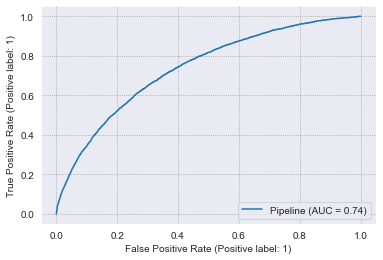

In [115]:
metrics.plot_roc_curve(clf_pipe, X_test, y_test)

Text(88.0, 0.5, 'Actual')

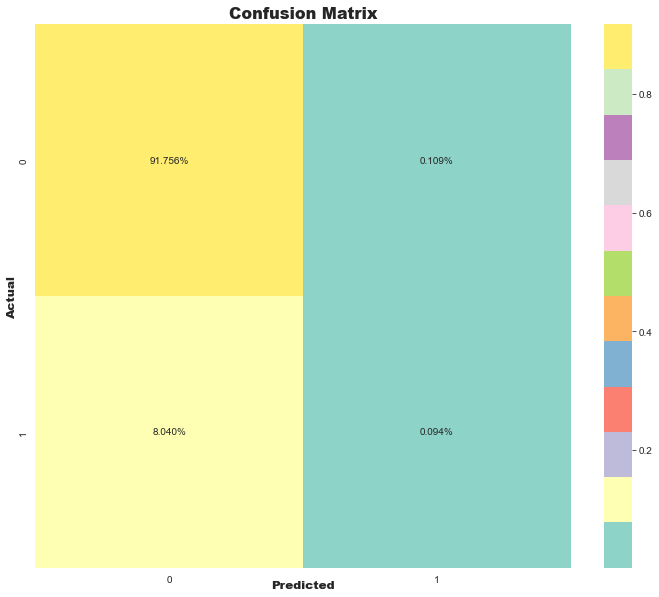

In [116]:
from sklearn.metrics import accuracy_score, recall_score, plot_roc_curve, confusion_matrix, classification_report, precision_recall_curve, auc
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
cf_mat_logreg = confusion_matrix(y_test, y_pred)
sns.heatmap(cf_mat_logreg/np.sum(cf_mat_logreg), annot=True, 
            fmt='.3%', cmap='Set3')
plt.title('Confusion Matrix', fontweight='heavy', fontsize=16,va='baseline')
plt.xlabel('Predicted', fontweight='heavy', fontsize=12,va='baseline')
plt.ylabel('Actual', fontweight='heavy', fontsize=12,va='baseline')

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Baseline Random Forest</h2>


The random forest is formed in two phases: the first is to combine the N decision trees to build the random forest, and the second is to make predictions for each tree created in the first phase.
The following stages can be used to demonstrate the working process:
    
Step 1: Pick K data points at random from the training set.
    
Step 2: Create decision trees for the data points you've chosen (Subsets).
    
Step 3: Pick a N for the number of decision trees you seek to build.
    
Step 4: Repetition of Steps 1 and 2.

In [117]:

Image(url="https://cdn.analyticsvidhya.com/wp-content/uploads/2020/02/rfc_vs_dt1.png", width=900, height=900)


In [118]:
Image(url= "https://miro.medium.com/max/1400/1*cBaV_bLVW-gT6PkG5ve26A.png", width=900, height=900)

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Fitting and Storing Results</h3>


In [119]:
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import roc_curve


In [120]:
RF = RandomForestClassifier(random_state = 42,n_estimators=40, criterion='gini', max_depth=7)

pipeline_rf = make_pipeline(final_pipeline, RF)
start = time()
pipeline_rf.fit(X_train, y_train)
train_time = np.round(time() - start, 4)
train_acc = pipeline_rf.score(X_train, y_train)
validAcc  = pipeline_rf.score(X_test, y_test)
start = time()
testAcc  = pipeline_rf.score(X_test, y_test)
test_time = np.round(time() - start, 4)

predictions = pipeline_rf.predict_proba(X_test)

try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["Pipeline", "Dataset", "TrainAcc", "ValidAcc", "TestAcc",
                                               "Train Time(s)",  "Test Time(s)", "Description",])
experimentLog.loc[len(experimentLog)] =[f"Baseline 1 LogReg", "HCDR", 
                                        f"{pct(trainAcc)}%", f"{pct(validAcc)}%", f"{pct(testAcc)}%",
                                        train_time, test_time,
                                        "Baseline 1 LogReg pipeline with Cat+Num features"]

experimentLog

,Pipeline,Dataset,TrainAcc,ValidAcc,TestAcc,Train Time(s),Test Time(s),Description
0,Baseline 1 LogReg,HCDR,91.964%,91.791%,91.851%,6.3786,0.2196,Baseline 1 LogReg pipeline with Cat+Num features
1,Baseline 1 LogReg,HCDR,91.964%,91.865%,91.865%,9.8333,0.3966,Baseline 1 LogReg pipeline with Cat+Num features


ROC_AUC_Score 0.7215282724170808


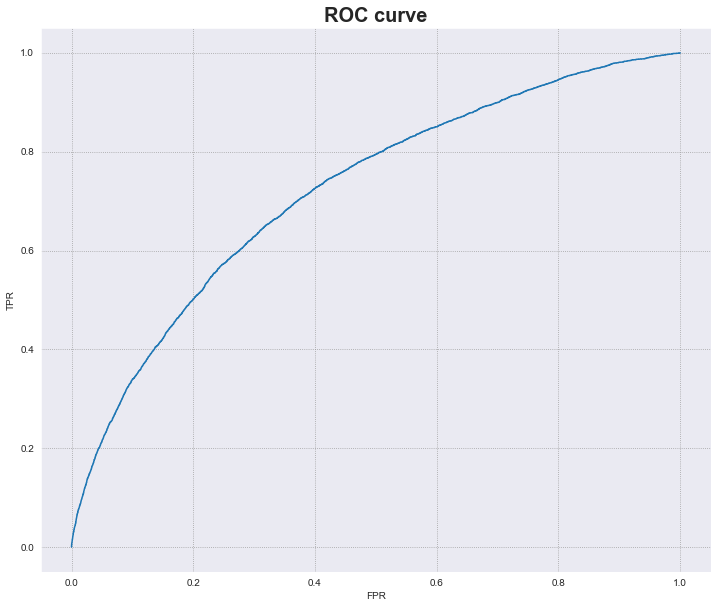

In [121]:
print ("ROC_AUC_Score",roc_auc_score(y_test, predictions[:,1]))
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
fpr, tpr, _ = roc_curve(y_test, predictions[:,1])

plt.clf()
plt.plot(fpr, tpr)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve',fontweight='bold',fontsize=20)
plt.show()

In [122]:
pred_rf_y = pipeline_rf.predict(X_test)

In [123]:
res = pipeline_rf.predict_proba(X_train)
res

array([[0.93362913, 0.06637087],
       [0.90600898, 0.09399102],
       [0.88417665, 0.11582335],
       ...,
       [0.8583721 , 0.1416279 ],
       [0.94419767, 0.05580233],
       [0.78322061, 0.21677939]])

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Validation Accuracy</h3>


In [124]:
print('Validation set accuracy score: ' + str(accuracy_score(y_test,pred_rf_y)))

Validation set accuracy score: 0.9186543745833536


<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Log Loss</h3>

In [125]:
log_loss(y_test,pred_rf_y)

2.809578366969711

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> ROC-AUC Score</h3>

In [126]:
roc_auc_score(y_test, clf_pipe.predict_proba(X_test)[:, 1])

0.7367453297932746

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> ROC Curve</h3>


In [127]:
import matplotlib.pyplot as plt
from sklearn import metrics

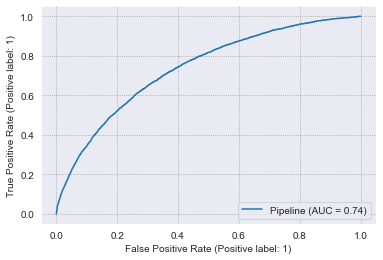

In [128]:
metrics.plot_roc_curve(clf_pipe, X_test, y_test)

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Confusion Matrix</h3>

Text(88.0, 0.5, 'Actual')

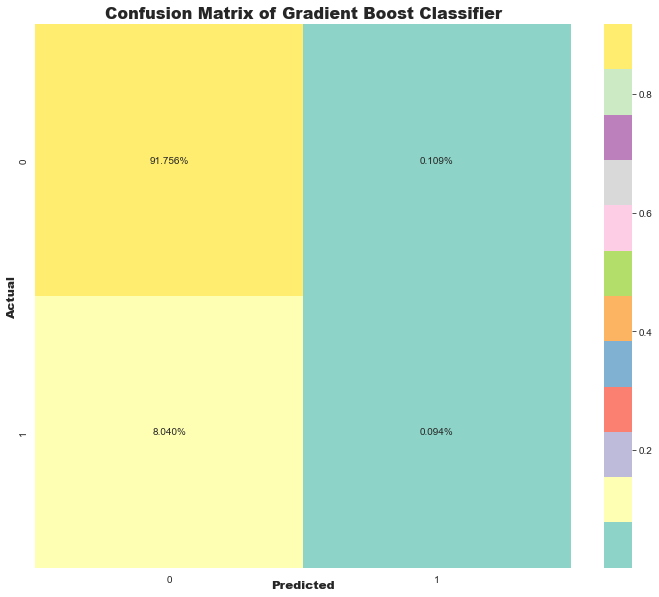

In [129]:
from sklearn.metrics import accuracy_score, recall_score, plot_roc_curve, confusion_matrix, classification_report, precision_recall_curve, auc
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
cf_mat_rf = confusion_matrix(y_test, y_pred)
sns.heatmap(cf_mat_rf/np.sum(cf_mat_rf), annot=True, 
            fmt='.3%', cmap='Set3')
plt.title('Confusion Matrix of Gradient Boost Classifier', fontweight='heavy', fontsize=16,va='baseline')
plt.xlabel('Predicted', fontweight='heavy', fontsize=12,va='baseline')
plt.ylabel('Actual', fontweight='heavy', fontsize=12,va='baseline')

<div id='phase_2'><h1 style = "font-family: Times New Roman;background-color:#CbC7A3"> Phase 2 </h1></div>


<h2 style = "font-family: Times New Roman;background-color:#CbC3E3"> EDA and Preprocessing on bureau and POS_CASH_BALANCE Data</h2>

In [130]:
datasets['bureau'].head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [131]:
datasets['bureau']['CREDIT_ACTIVE'].value_counts()

Closed      1079273
Active       630607
Sold           6527
Bad debt         21
Name: CREDIT_ACTIVE, dtype: int64

In [132]:
datasets['bureau_balance']

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
...,...,...,...
27299920,5041336,-47,X
27299921,5041336,-48,X
27299922,5041336,-49,X
27299923,5041336,-50,X


In [133]:
datasets['bureau_balance']['STATUS'].value_counts()

C    13646993
0     7499507
X     5810482
1      242347
5       62406
2       23419
3        8924
4        5847
Name: STATUS, dtype: int64

(array([0.00227886, 0.00383747, 0.00446256, 0.00602394, 0.00707296,
        0.01025293, 0.0132272 , 0.01458981, 0.01954568, 0.02287526]),
 array([-96. , -86.4, -76.8, -67.2, -57.6, -48. , -38.4, -28.8, -19.2,
         -9.6,   0. ]),
 <BarContainer object of 10 artists>)

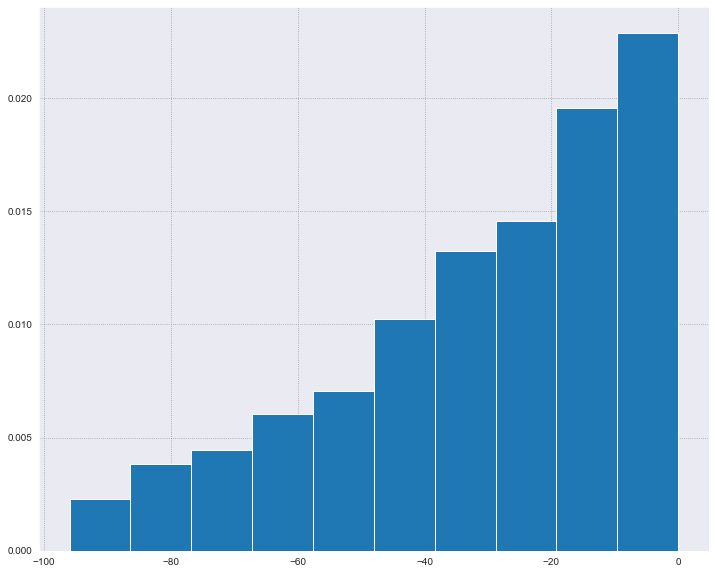

In [134]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
plt.hist(datasets['bureau_balance']['MONTHS_BALANCE'],density=True)

In [135]:
bureau_frame = pd.merge(left = datasets['bureau'], right = datasets['bureau_balance'], how='inner', left_on='SK_ID_BUREAU', right_on='SK_ID_BUREAU') 
bureau_frame.shape

(24179741, 19)

In [136]:
datasets['application_train'].head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,...,EMERGENCYSTATE_MODE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,202500.0,406597.5,24700.5,Unaccompanied,...,No,2.0,2.0,1,0,0,0,0,0.0,1.0
1,100003,0,Cash loans,F,N,N,270000.0,1293502.5,35698.5,Family,...,No,1.0,0.0,1,0,0,0,0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,67500.0,135000.0,6750.0,Unaccompanied,...,NaN,0.0,0.0,0,0,0,0,0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,135000.0,312682.5,29686.5,Unaccompanied,...,NaN,2.0,0.0,1,0,0,0,0,NaN,NaN
4,100007,0,Cash loans,M,N,Y,121500.0,513000.0,21865.5,Unaccompanied,...,NaN,0.0,0.0,0,0,0,0,0,0.0,0.0


In [137]:
tar = datasets['application_train'][['SK_ID_CURR','TARGET']]
tar

,SK_ID_CURR,TARGET
0,100002,1
1,100003,0
2,100004,0
3,100006,0
4,100007,0
...,...,...
307506,456251,0
307507,456252,0
307508,456253,0
307509,456254,1


In [138]:
df_bureau_with_target  = pd.merge(left = bureau_frame, right = tar,
                                 how='left', on='SK_ID_CURR')


In [139]:
df_bureau_with_target

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,MONTHS_BALANCE,STATUS,TARGET
0,380361,5715448,Active,currency 1,-820,0,31069.0,NaN,NaN,0,67500.0,0.0,67500.0,0.0,Credit card,-183,0.0,0,C,0.0
1,380361,5715448,Active,currency 1,-820,0,31069.0,NaN,NaN,0,67500.0,0.0,67500.0,0.0,Credit card,-183,0.0,-1,C,0.0
2,380361,5715448,Active,currency 1,-820,0,31069.0,NaN,NaN,0,67500.0,0.0,67500.0,0.0,Credit card,-183,0.0,-2,C,0.0
3,380361,5715448,Active,currency 1,-820,0,31069.0,NaN,NaN,0,67500.0,0.0,67500.0,0.0,Credit card,-183,0.0,-3,C,0.0
4,380361,5715448,Active,currency 1,-820,0,31069.0,NaN,NaN,0,67500.0,0.0,67500.0,0.0,Credit card,-183,0.0,-4,C,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24179736,407724,5053758,Closed,currency 1,-2423,0,-2150.0,-2175.0,NaN,0,21883.5,0.0,NaN,0.0,Consumer credit,-787,NaN,-75,X,0.0
24179737,407724,5053758,Closed,currency 1,-2423,0,-2150.0,-2175.0,NaN,0,21883.5,0.0,NaN,0.0,Consumer credit,-787,NaN,-76,X,0.0
24179738,407724,5053758,Closed,currency 1,-2423,0,-2150.0,-2175.0,NaN,0,21883.5,0.0,NaN,0.0,Consumer credit,-787,NaN,-77,X,0.0
24179739,407724,5053758,Closed,currency 1,-2423,0,-2150.0,-2175.0,NaN,0,21883.5,0.0,NaN,0.0,Consumer credit,-787,NaN,-78,X,0.0


In [140]:
df_bureau_with_target.shape

(24179741, 20)

In [141]:
df_bureau_with_target1 = df_bureau_with_target.dropna(subset=['TARGET'])

<AxesSubplot:>

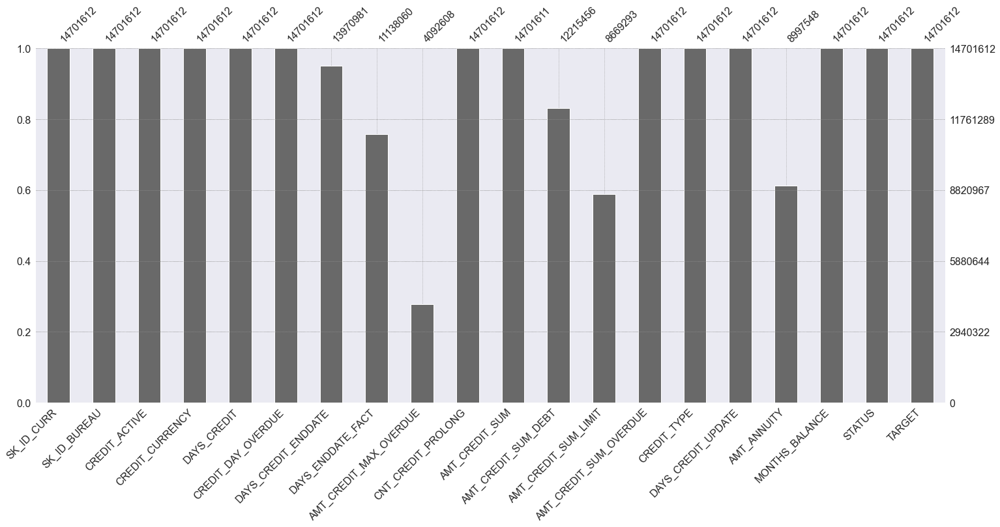

In [142]:
msno.bar(df_bureau_with_target1)

<AxesSubplot:>

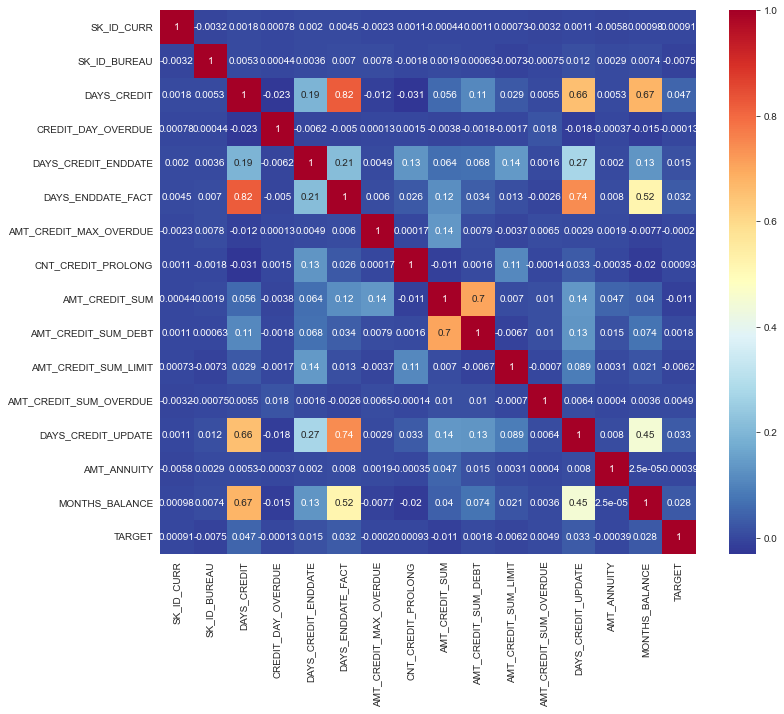

In [143]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
sns.heatmap(df_bureau_with_target1.corr(),annot=True, cmap='RdYlBu_r')

In [144]:
df_bureau_with_target1.corrwith(df_bureau_with_target1["TARGET"]).sort_values(ascending = False)

TARGET                    1.000000
DAYS_CREDIT               0.047350
DAYS_CREDIT_UPDATE        0.033169
DAYS_ENDDATE_FACT         0.031562
MONTHS_BALANCE            0.027773
DAYS_CREDIT_ENDDATE       0.014881
AMT_CREDIT_SUM_OVERDUE    0.004875
AMT_CREDIT_SUM_DEBT       0.001840
CNT_CREDIT_PROLONG        0.000929
SK_ID_CURR                0.000909
CREDIT_DAY_OVERDUE       -0.000128
AMT_CREDIT_MAX_OVERDUE   -0.000204
AMT_ANNUITY              -0.000389
AMT_CREDIT_SUM_LIMIT     -0.006195
SK_ID_BUREAU             -0.007517
AMT_CREDIT_SUM           -0.010691
dtype: float64

In [145]:
bureau_frame.isna().sum()

SK_ID_CURR                       0
SK_ID_BUREAU                     0
CREDIT_ACTIVE                    0
CREDIT_CURRENCY                  0
DAYS_CREDIT                      0
CREDIT_DAY_OVERDUE               0
DAYS_CREDIT_ENDDATE        1177501
DAYS_ENDDATE_FACT          5628643
AMT_CREDIT_MAX_OVERDUE    17545903
CNT_CREDIT_PROLONG               0
AMT_CREDIT_SUM                   5
AMT_CREDIT_SUM_DEBT        4089077
AMT_CREDIT_SUM_LIMIT      10376144
AMT_CREDIT_SUM_OVERDUE           0
CREDIT_TYPE                      0
DAYS_CREDIT_UPDATE               0
AMT_ANNUITY                9553957
MONTHS_BALANCE                   0
STATUS                           0
dtype: int64

In [146]:
bureau_frame = bureau_frame.drop_duplicates()

In [147]:
bureau_frame['CREDIT_ACTIVE'].value_counts()

Closed      18511853
Active       5545692
Sold          122096
Bad debt         100
Name: CREDIT_ACTIVE, dtype: int64

In [148]:
bureau_frame.isna().sum()

SK_ID_CURR                       0
SK_ID_BUREAU                     0
CREDIT_ACTIVE                    0
CREDIT_CURRENCY                  0
DAYS_CREDIT                      0
CREDIT_DAY_OVERDUE               0
DAYS_CREDIT_ENDDATE        1177501
DAYS_ENDDATE_FACT          5628643
AMT_CREDIT_MAX_OVERDUE    17545903
CNT_CREDIT_PROLONG               0
AMT_CREDIT_SUM                   5
AMT_CREDIT_SUM_DEBT        4089077
AMT_CREDIT_SUM_LIMIT      10376144
AMT_CREDIT_SUM_OVERDUE           0
CREDIT_TYPE                      0
DAYS_CREDIT_UPDATE               0
AMT_ANNUITY                9553957
MONTHS_BALANCE                   0
STATUS                           0
dtype: int64

In [149]:
bureau_frame['AMT_CREDIT_SUM_LIMIT'] = bureau_frame['AMT_CREDIT_SUM_LIMIT'].replace(np.nan,0)

In [150]:
bureau_frame

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,MONTHS_BALANCE,STATUS
0,380361,5715448,Active,currency 1,-820,0,31069.0,NaN,NaN,0,67500.0,0.0,67500.0,0.0,Credit card,-183,0.0,0,C
1,380361,5715448,Active,currency 1,-820,0,31069.0,NaN,NaN,0,67500.0,0.0,67500.0,0.0,Credit card,-183,0.0,-1,C
2,380361,5715448,Active,currency 1,-820,0,31069.0,NaN,NaN,0,67500.0,0.0,67500.0,0.0,Credit card,-183,0.0,-2,C
3,380361,5715448,Active,currency 1,-820,0,31069.0,NaN,NaN,0,67500.0,0.0,67500.0,0.0,Credit card,-183,0.0,-3,C
4,380361,5715448,Active,currency 1,-820,0,31069.0,NaN,NaN,0,67500.0,0.0,67500.0,0.0,Credit card,-183,0.0,-4,C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24179736,407724,5053758,Closed,currency 1,-2423,0,-2150.0,-2175.0,NaN,0,21883.5,0.0,0.0,0.0,Consumer credit,-787,NaN,-75,X
24179737,407724,5053758,Closed,currency 1,-2423,0,-2150.0,-2175.0,NaN,0,21883.5,0.0,0.0,0.0,Consumer credit,-787,NaN,-76,X
24179738,407724,5053758,Closed,currency 1,-2423,0,-2150.0,-2175.0,NaN,0,21883.5,0.0,0.0,0.0,Consumer credit,-787,NaN,-77,X
24179739,407724,5053758,Closed,currency 1,-2423,0,-2150.0,-2175.0,NaN,0,21883.5,0.0,0.0,0.0,Consumer credit,-787,NaN,-78,X


In [151]:
bureau_frame['AMT_CREDIT_SUM_LIMIT'].value_counts()

0.000         23537973
135000.000       14315
13500.000        12765
45000.000        11447
90000.000         8734
                ...   
62694.360            1
8651.295             1
21375.000            1
14805.000            1
2220.030             1
Name: AMT_CREDIT_SUM_LIMIT, Length: 22040, dtype: int64

<AxesSubplot:>

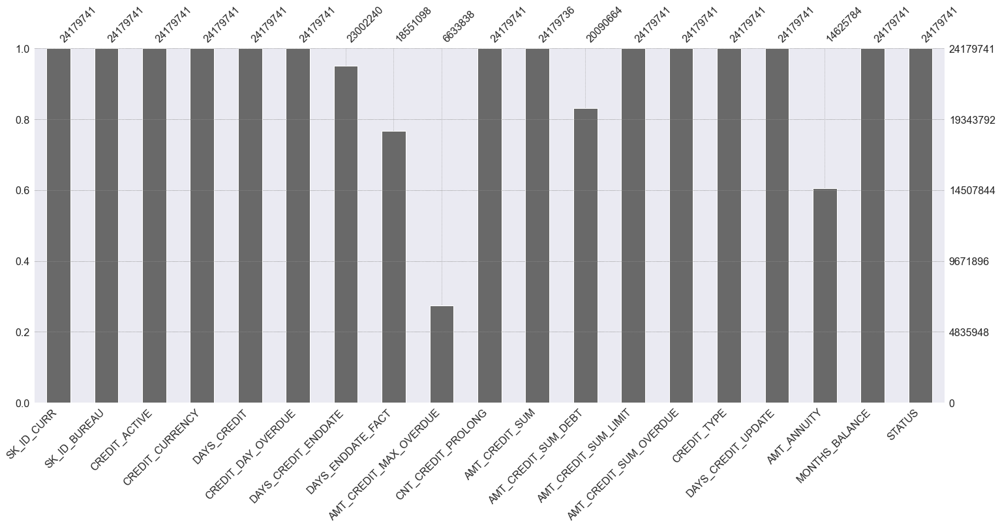

In [152]:
msno.bar(bureau_frame)

In [153]:
bureau_frame = bureau_frame.groupby('SK_ID_CURR').median()
bureau_frame

,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,MONTHS_BALANCE
SK_ID_CURR,,,,,,,,,,,,,,
100001,5896632.0,-879.0,0.0,-492.0,-877.0,NaN,0.0,112500.0,0.000,0.0,0.0,-155.0,0.0,-14.0
100002,6158905.0,-1043.0,0.0,-911.0,-967.0,0.0,0.0,40761.0,0.000,0.0,0.0,-758.0,0.0,-26.0
100005,6735200.0,-373.0,0.0,-128.0,-123.0,0.0,0.0,58500.0,0.000,0.0,0.0,-121.0,0.0,-3.0
100010,5576631.0,-1939.5,0.0,-119.5,-1138.0,NaN,0.0,495000.0,174003.750,0.0,0.0,-578.0,NaN,-46.0
100013,5922082.0,-2005.0,0.0,-909.0,-1218.0,19305.0,0.0,688500.0,0.000,0.0,0.0,-1215.0,0.0,-28.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456247,6618241.0,-1757.0,0.0,-1402.0,-1402.0,2898.0,0.0,143667.0,0.000,0.0,0.0,-1402.0,4329.0,-22.0
456250,6817237.0,-824.0,0.0,1797.0,-760.0,0.0,0.0,483349.5,391731.615,0.0,0.0,-31.0,51799.5,-14.0
456253,6098498.0,-919.0,0.0,-189.0,-794.0,NaN,0.0,675000.0,0.000,0.0,0.0,-179.0,58369.5,-14.0


In [154]:
bureau_frame.reset_index(inplace=True)

In [155]:
bureau_frame = bureau_frame[['SK_ID_CURR','DAYS_CREDIT','DAYS_ENDDATE_FACT','AMT_CREDIT_SUM','DAYS_CREDIT_UPDATE','MONTHS_BALANCE','AMT_CREDIT_SUM_LIMIT']]

In [156]:
bureau_frame

,SK_ID_CURR,DAYS_CREDIT,DAYS_ENDDATE_FACT,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,MONTHS_BALANCE,AMT_CREDIT_SUM_LIMIT
0,100001,-879.0,-877.0,112500.0,-155.0,-14.0,0.0
1,100002,-1043.0,-967.0,40761.0,-758.0,-26.0,0.0
2,100005,-373.0,-123.0,58500.0,-121.0,-3.0,0.0
3,100010,-1939.5,-1138.0,495000.0,-578.0,-46.0,0.0
4,100013,-2005.0,-1218.0,688500.0,-1215.0,-28.0,0.0
...,...,...,...,...,...,...,...
134537,456247,-1757.0,-1402.0,143667.0,-1402.0,-22.0,0.0
134538,456250,-824.0,-760.0,483349.5,-31.0,-14.0,0.0
134539,456253,-919.0,-794.0,675000.0,-179.0,-14.0,0.0
134540,456254,-1104.0,-859.0,45000.0,-401.0,-18.0,0.0


Making a test data frame with simply SK ID CURR as a goal so that we can examine the connection with the merged bureau field and delete unnecessary columns.

Merging of processed Bureau Data with Application Train Data 

In [157]:
final_bureau_train =  pd.merge(left = bureau_frame, right = datasets['application_train'],
                                 how='inner', left_on='SK_ID_CURR', right_on='SK_ID_CURR')

In [158]:
final_bureau_train

,SK_ID_CURR,DAYS_CREDIT,DAYS_ENDDATE_FACT,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,MONTHS_BALANCE,AMT_CREDIT_SUM_LIMIT,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,...,EMERGENCYSTATE_MODE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,-1043.0,-967.0,40761.0,-758.0,-26.0,0.0,1,Cash loans,M,...,No,2.0,2.0,1,0,0,0,0,0.0,1.0
1,100010,-1939.5,-1138.0,495000.0,-578.0,-46.0,0.0,0,Cash loans,M,...,NaN,2.0,0.0,1,0,0,0,0,0.0,0.0
2,100019,-495.0,NaN,360000.0,-26.5,-8.0,135000.0,0,Cash loans,M,...,NaN,0.0,0.0,0,0,0,0,0,0.0,1.0
3,100032,-1169.5,-662.0,331875.0,-520.5,-28.0,0.0,0,Cash loans,M,...,NaN,2.0,0.0,1,0,0,0,0,0.0,0.0
4,100033,-195.0,NaN,675000.0,-169.0,-3.0,0.0,0,Cash loans,M,...,NaN,0.0,0.0,0,0,0,0,0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92226,456244,-2138.0,-1438.0,315000.0,-1381.0,-33.5,0.0,0,Cash loans,F,...,No,0.0,0.0,1,0,0,0,0,1.0,5.0
92227,456247,-1757.0,-1402.0,143667.0,-1402.0,-22.0,0.0,0,Cash loans,F,...,NaN,9.0,2.0,1,0,0,0,0,1.0,2.0
92228,456253,-919.0,-794.0,675000.0,-179.0,-14.0,0.0,0,Cash loans,F,...,No,6.0,0.0,1,0,0,0,0,1.0,1.0
92229,456254,-1104.0,-859.0,45000.0,-401.0,-18.0,0.0,1,Cash loans,F,...,No,0.0,0.0,1,0,0,0,0,0.0,0.0


<AxesSubplot:>

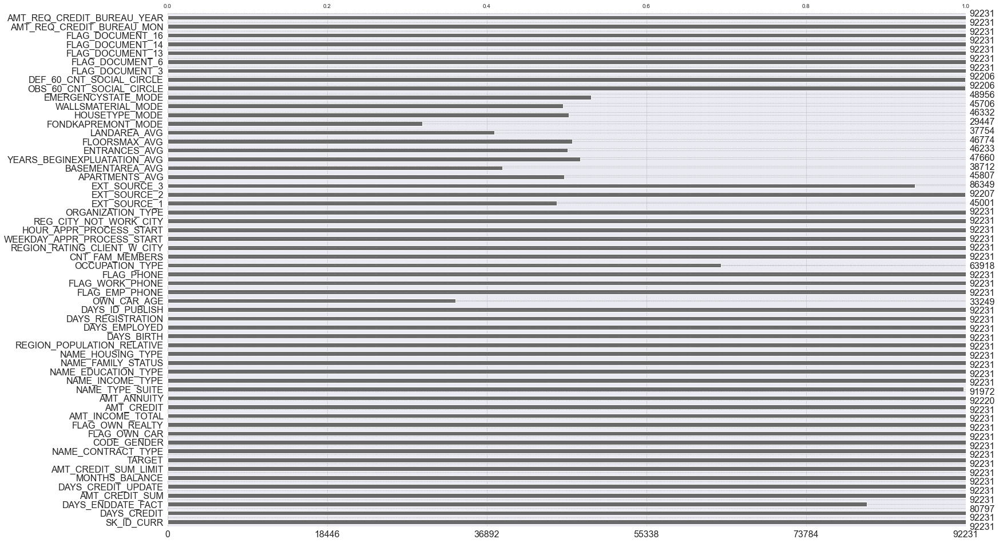

In [159]:
msno.bar(final_bureau_train)

In [160]:
#Storing the data to csv file so that if kernel crashes we can continue the work with this data and save time

In [161]:
final_bureau_train.to_csv('bureau_files_merged_with_app_train.csv',index=False)

# Working with POS_CASH_balance

In [162]:
datasets['POS_CASH_balance'].head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [163]:
datasets['POS_CASH_balance'].shape

(10001358, 8)

In [164]:
datasets['POS_CASH_balance']['SK_DPD_DEF'].value_counts()

0       9887389
1         22134
2         14690
3         11652
4          9528
         ...   
1656          1
1291          1
1411          1
2448          1
2495          1
Name: SK_DPD_DEF, Length: 2307, dtype: int64

In [165]:
df_pos = datasets['POS_CASH_balance'][['SK_ID_PREV','SK_ID_CURR','CNT_INSTALMENT','CNT_INSTALMENT_FUTURE','NAME_CONTRACT_STATUS']]

<AxesSubplot:>

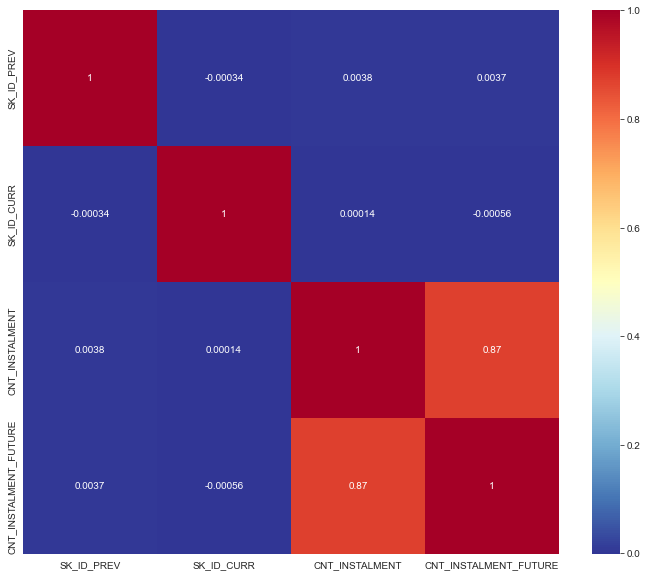

In [166]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
sns.heatmap(df_pos.corr(),annot=True, cmap='RdYlBu_r')

In [167]:
df_POS = df_pos.drop(['CNT_INSTALMENT'],axis=1)

In [168]:
df_pos['SK_ID_CURR'].value_counts()

265042    295
172612    247
309133    246
127659    245
185185    245
         ... 
406557      1
240277      1
177557      1
251697      1
144536      1
Name: SK_ID_CURR, Length: 337252, dtype: int64

In [169]:
Pos_with_app_atrain = pd.merge(left=datasets['application_train'], right=df_pos, how='inner', left_on=['SK_ID_CURR'], 
                                right_on=['SK_ID_CURR'])
#Combining POS CASH with Application Train on SK_ID_CURR

In [170]:
Pos_with_app_atrain

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,...,FLAG_DOCUMENT_6,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_PREV,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS
0,100002,1,Cash loans,M,N,Y,202500.0,406597.5,24700.5,Unaccompanied,...,0,0,0,0,0.0,1.0,1038818,24.0,18.0,Active
1,100002,1,Cash loans,M,N,Y,202500.0,406597.5,24700.5,Unaccompanied,...,0,0,0,0,0.0,1.0,1038818,24.0,21.0,Active
2,100002,1,Cash loans,M,N,Y,202500.0,406597.5,24700.5,Unaccompanied,...,0,0,0,0,0.0,1.0,1038818,24.0,23.0,Active
3,100002,1,Cash loans,M,N,Y,202500.0,406597.5,24700.5,Unaccompanied,...,0,0,0,0,0.0,1.0,1038818,24.0,22.0,Active
4,100002,1,Cash loans,M,N,Y,202500.0,406597.5,24700.5,Unaccompanied,...,0,0,0,0,0.0,1.0,1038818,24.0,10.0,Active
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8543370,456255,0,Cash loans,F,N,N,157500.0,675000.0,49117.5,Unaccompanied,...,0,0,0,0,2.0,1.0,1743609,12.0,7.0,Active
8543371,456255,0,Cash loans,F,N,N,157500.0,675000.0,49117.5,Unaccompanied,...,0,0,0,0,2.0,1.0,1743609,12.0,11.0,Active
8543372,456255,0,Cash loans,F,N,N,157500.0,675000.0,49117.5,Unaccompanied,...,0,0,0,0,2.0,1.0,1359084,12.0,7.0,Active
8543373,456255,0,Cash loans,F,N,N,157500.0,675000.0,49117.5,Unaccompanied,...,0,0,0,0,2.0,1.0,1743609,12.0,4.0,Active


<AxesSubplot:>

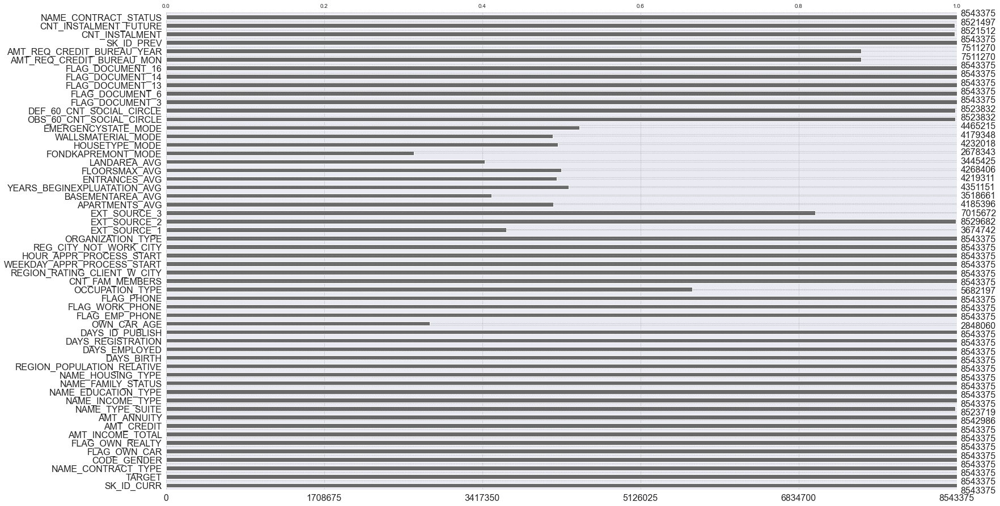

In [171]:
msno.bar(Pos_with_app_atrain)

# Working on Credit Card Balance Data

In [172]:
datasets['credit_card_balance'].head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [173]:
ccbal = datasets['credit_card_balance'].drop(['SK_DPD','SK_DPD_DEF','MONTHS_BALANCE','NAME_CONTRACT_STATUS'],axis=1)

In [174]:
ccbal.head()

,SK_ID_PREV,SK_ID_CURR,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM
0,2562384,378907,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0
1,2582071,363914,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0
2,1740877,371185,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.0,2250.0,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0
3,1389973,337855,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.0,11925.0,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0
4,1891521,126868,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.0,27000.0,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0


<AxesSubplot:>

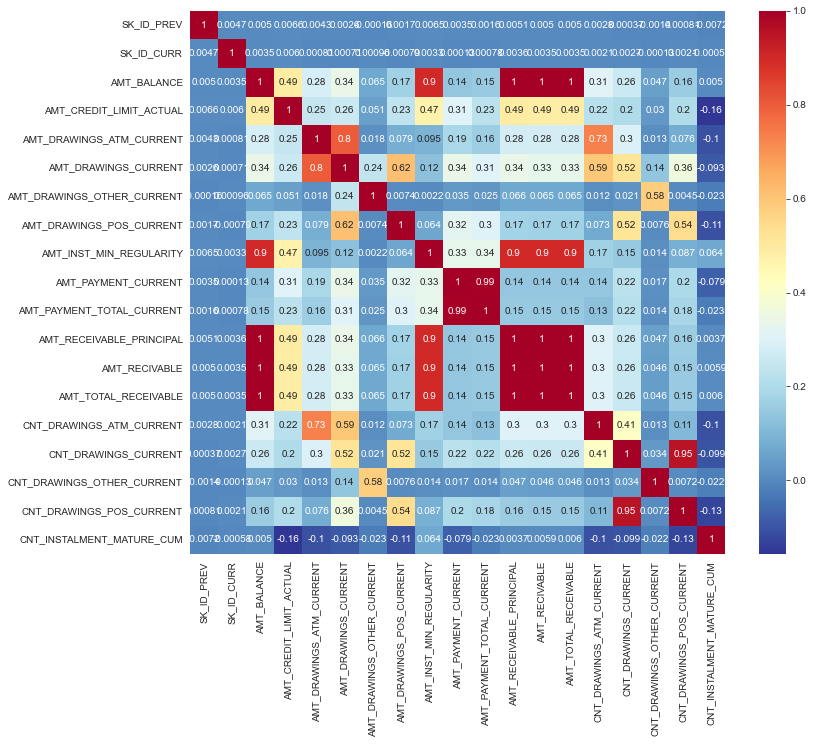

In [175]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
sns.heatmap(ccbal.corr(),annot=True, cmap='RdYlBu_r')

In [176]:
ccbal = ccbal.drop(['AMT_INST_MIN_REGULARITY','AMT_RECEIVABLE_PRINCIPAL','AMT_RECIVABLE','AMT_TOTAL_RECEIVABLE',
                         'AMT_PAYMENT_TOTAL_CURRENT','AMT_DRAWINGS_ATM_CURRENT','CNT_DRAWINGS_CURRENT'],axis=1)
#Dropping of columns with no or close to none significance with Target.

In [177]:
ccbal.head()

,SK_ID_PREV,SK_ID_CURR,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_PAYMENT_CURRENT,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM
0,2562384,378907,56.970,135000,877.5,0.0,877.5,1800.0,0.0,0.0,1.0,35.0
1,2582071,363914,63975.555,45000,2250.0,0.0,0.0,2250.0,1.0,0.0,0.0,69.0
2,1740877,371185,31815.225,450000,0.0,0.0,0.0,2250.0,0.0,0.0,0.0,30.0
3,1389973,337855,236572.110,225000,2250.0,0.0,0.0,11925.0,1.0,0.0,0.0,10.0
4,1891521,126868,453919.455,450000,11547.0,0.0,11547.0,27000.0,0.0,0.0,1.0,101.0


<h2 style = "font-family: Times New Roman;background-color:#CbC3E3"> EDA and Preprocessing of Credit Card Balance </h2>

In [178]:
ccbal1=ccbal.groupby(['SK_ID_CURR','SK_ID_PREV']).mean()
ccbal1

,,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_PAYMENT_CURRENT,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM
SK_ID_CURR,SK_ID_PREV,,,,,,,,,,
100006,1489396,0.000000,270000.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
100011,1843384,54482.111149,164189.189189,2432.432432,0.0,0.000000,4843.064189,0.054054,0.0,0.000000,25.767123
100013,2038692,18159.919219,131718.750000,5953.125000,0.0,0.000000,7168.346250,0.255556,0.0,0.000000,18.719101
100021,2594025,0.000000,675000.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
100023,1499902,0.000000,135000.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
456244,2181926,131834.730732,296341.463415,26842.388049,0.0,2363.015854,32720.544878,1.048780,0.0,0.317073,13.600000
456246,1079732,13136.731875,135000.000000,15199.256250,0.0,15199.256250,18778.275000,0.000000,0.0,2.500000,3.500000
456247,1595171,23216.396211,144000.000000,2149.506474,0.0,13.190684,4883.755263,0.115789,0.0,0.031579,26.494737


We're grouping by SK ID CURR and SK ID PREV by mean to preserve as much data as possible during merging or joining.

In [179]:
ccbal_new =  ccbal1.reset_index()

<AxesSubplot:>

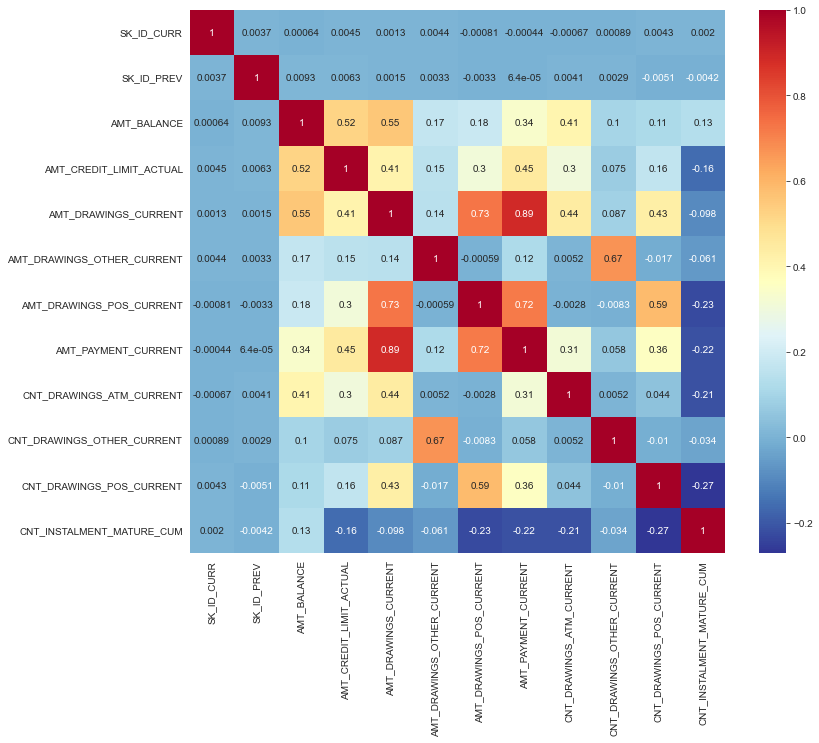

In [180]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
sns.heatmap(ccbal_new.corr(),annot=True, cmap='RdYlBu_r')

<AxesSubplot:>

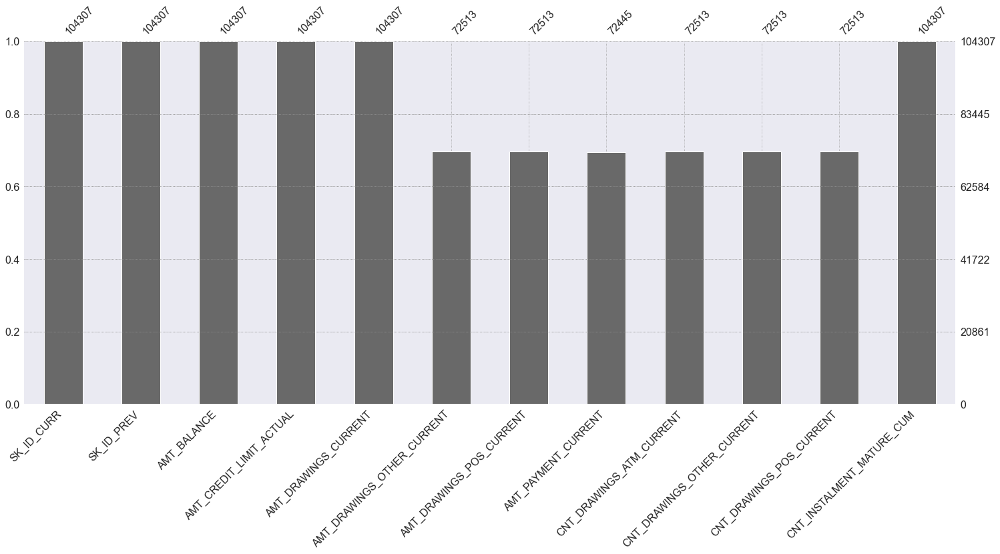

In [181]:
msno.bar(ccbal_new)

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3">Working on Installments data </h2>

In [182]:
datasets['installments_payments'].head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


<h2 style = "font-family: Times New Roman;background-color:#CbC3E3"> EDA and Preprocessing on Installments Payments</h2>


In [183]:
installment = datasets['installments_payments'].drop(['NUM_INSTALMENT_VERSION','NUM_INSTALMENT_NUMBER'],axis=1)

<AxesSubplot:>

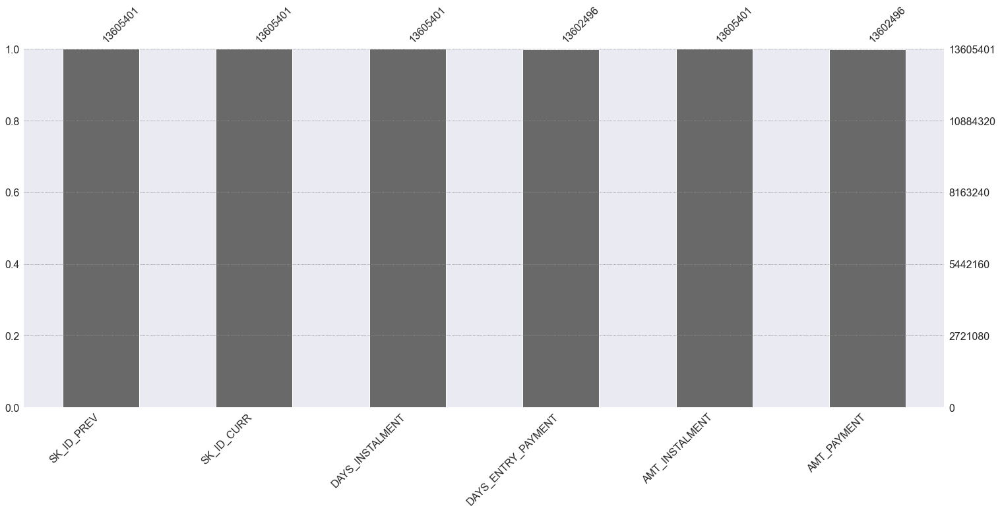

In [184]:
msno.bar(installment)

In [185]:
installment.head()

,SK_ID_PREV,SK_ID_CURR,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,-1383.0,-1366.0,2165.040,2160.585


In [186]:
installment_final=installment.groupby(['SK_ID_CURR','SK_ID_PREV']).mean()

In [187]:
installment_final = installment_final.reset_index()

In [188]:
installment_final.head()

,SK_ID_CURR,SK_ID_PREV,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,100001,1369693,-1664.0,-1679.500000,7312.725000,7312.725000
1,100001,1851984,-2886.0,-2882.333333,3981.675000,3981.675000
2,100002,1038818,-295.0,-315.421053,11559.247105,11559.247105
3,100003,1810518,-626.0,-630.428571,164425.332857,164425.332857
4,100003,2396755,-2145.0,-2151.750000,6731.115000,6731.115000


In [189]:
cbal1 =  ccbal1.reset_index()

In [190]:
cbal1['SK_ID_PREV'].value_counts()

1489396    1
1645533    1
2835518    1
2116495    1
2487050    1
          ..
2088402    1
2663364    1
2002588    1
1642103    1
1794451    1
Name: SK_ID_PREV, Length: 104307, dtype: int64

# Bringing Credit Card Balances and Payments Together Payments on SK ID PREV and SK ID CURR, grouping by both tables by these two ids by mean, and then SK ID PREV only inner join

In [191]:
cbal_with_installment = pd.merge(left=installment_final, right=cbal1, how='inner', left_on=['SK_ID_PREV'], 
                                right_on=['SK_ID_PREV'])

In [192]:
cbal_with_installment

,SK_ID_CURR_x,SK_ID_PREV,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT,SK_ID_CURR_y,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_PAYMENT_CURRENT,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM
0,100011,1843384,-1139.157895,-1142.434211,4723.027697,4723.027697,100011,54482.111149,164189.189189,2432.432432,0.000,0.000000,4843.064189,0.054054,0.000000,0.000000,25.767123
1,100013,2038692,-1562.657895,-1565.903509,6107.987368,6038.908421,100013,18159.919219,131718.750000,5953.125000,0.000,0.000000,7168.346250,0.255556,0.000000,0.000000,18.719101
2,100028,1914954,-700.892857,-702.559524,4215.151071,3377.672143,100028,8085.058163,225000.000000,6156.400408,0.000,6242.355000,6598.243256,0.045455,0.000000,2.613636,19.547619
3,100042,2137382,-1474.926230,-1479.500000,5205.409672,5131.639180,100042,33356.183036,78750.000000,5923.886786,2475.375,287.797500,7452.703929,0.226190,0.059524,0.095238,30.072289
4,100043,1557583,-663.547619,-666.785714,17736.775714,16476.312857,100043,208572.600000,287045.454545,14904.972273,0.000,12859.517727,21625.160625,0.060606,0.000000,0.303030,13.870968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72461,456242,2640681,-109.500000,-111.590909,7120.057500,7120.057500,456242,148232.328750,202500.000000,39849.783750,0.000,16787.283750,22377.323571,1.000000,0.000000,2.875000,3.500000
72462,456244,2181926,-810.363636,-812.200000,24391.678909,24391.678909,456244,131834.730732,296341.463415,26842.388049,0.000,2363.015854,32720.544878,1.048780,0.000000,0.317073,13.600000
72463,456246,1079732,-137.629630,-140.555556,4877.861667,4877.861667,456246,13136.731875,135000.000000,15199.256250,0.000,15199.256250,18778.275000,0.000000,0.000000,2.500000,3.500000
72464,456247,1595171,-1555.684685,-1559.099099,4184.480676,4184.480676,456247,23216.396211,144000.000000,2149.506474,0.000,13.190684,4883.755263,0.115789,0.000000,0.031579,26.494737


<h2 style = "font-family: Times New Roman;background-color:#CbC3E3"> EDA and Preprocessing on credit card balance and installment payments</h2>

<AxesSubplot:>

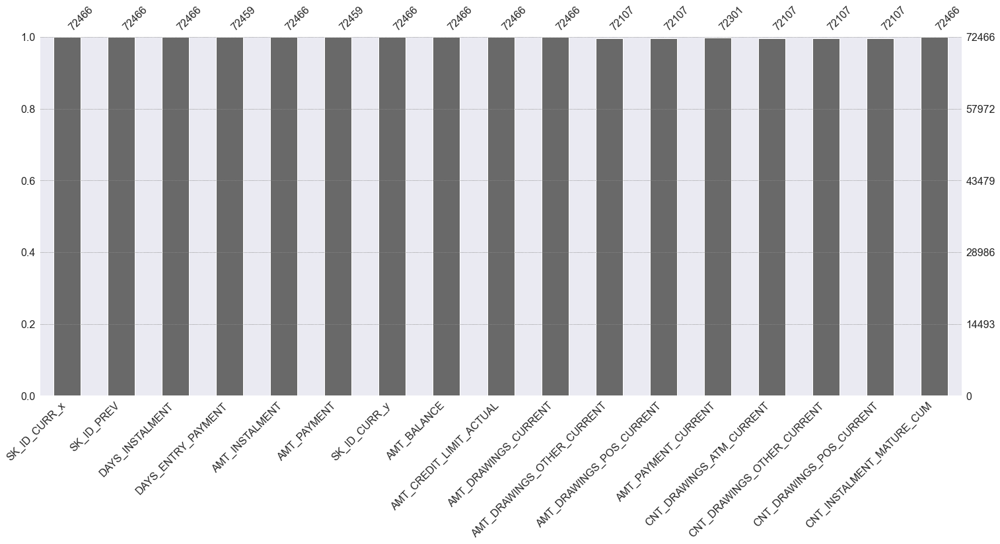

In [193]:
msno.bar(cbal_with_installment)

In [194]:
cbal_with_installment.to_csv('df_ccbal_installment.csv',index=False)

<AxesSubplot:>

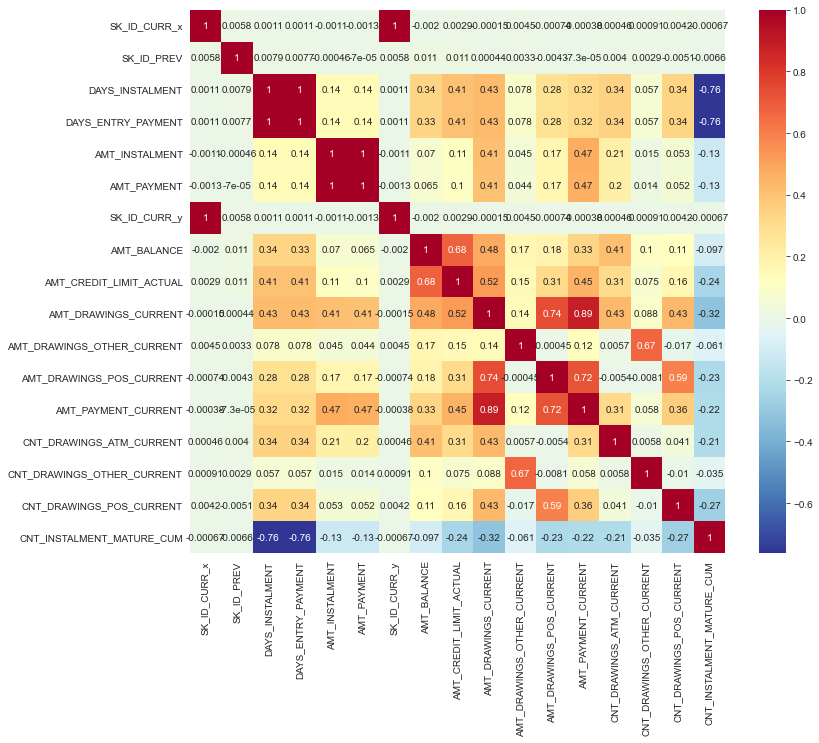

In [195]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
sns.heatmap(cbal_with_installment.corr(),annot=True, cmap='RdYlBu_r')


In [196]:
ccbal_installment1 = cbal_with_installment.drop(['SK_ID_CURR_y','AMT_DRAWINGS_POS_CURRENT','AMT_DRAWINGS_CURRENT',
                                                   'AMT_PAYMENT','DAYS_ENTRY_PAYMENT'],axis=1)

In [197]:
ccbal_installment1.rename(columns={'SK_ID_CURR_x':'SK_ID_CURR'},inplace=True)

In [198]:
ccbal_installment1.head()

,SK_ID_CURR,SK_ID_PREV,DAYS_INSTALMENT,AMT_INSTALMENT,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_OTHER_CURRENT,AMT_PAYMENT_CURRENT,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM
0,100011,1843384,-1139.157895,4723.027697,54482.111149,164189.189189,0.000,4843.064189,0.054054,0.000000,0.000000,25.767123
1,100013,2038692,-1562.657895,6107.987368,18159.919219,131718.750000,0.000,7168.346250,0.255556,0.000000,0.000000,18.719101
2,100028,1914954,-700.892857,4215.151071,8085.058163,225000.000000,0.000,6598.243256,0.045455,0.000000,2.613636,19.547619
3,100042,2137382,-1474.926230,5205.409672,33356.183036,78750.000000,2475.375,7452.703929,0.226190,0.059524,0.095238,30.072289
4,100043,1557583,-663.547619,17736.775714,208572.600000,287045.454545,0.000,21625.160625,0.060606,0.000000,0.303030,13.870968


<h2 style = "font-family: Times New Roman;background-color:#CbC3E3"> Working on Previous Application Data</h2>


In [199]:
prev_app =  datasets['previous_application']

In [200]:

prev_app.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


# EDA and Pre - Proscessing of prev app data
removing columns with high correlation and containing large percentage of NULL values

<AxesSubplot:>

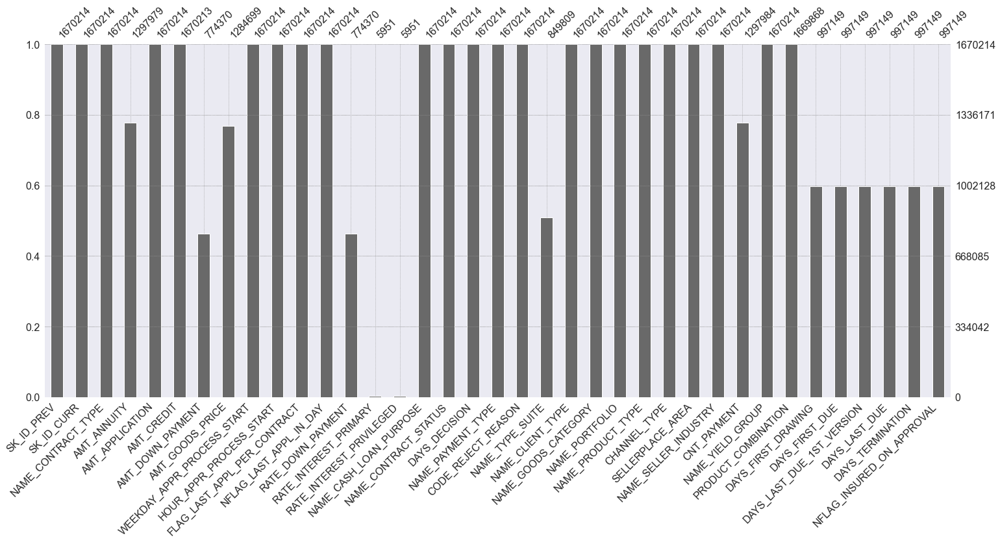

In [201]:
msno.bar(prev_app)

In [202]:
prev_app = prev_app.drop(['RATE_INTEREST_PRIVILEGED','RATE_INTEREST_PRIMARY'],axis=1)

<AxesSubplot:>

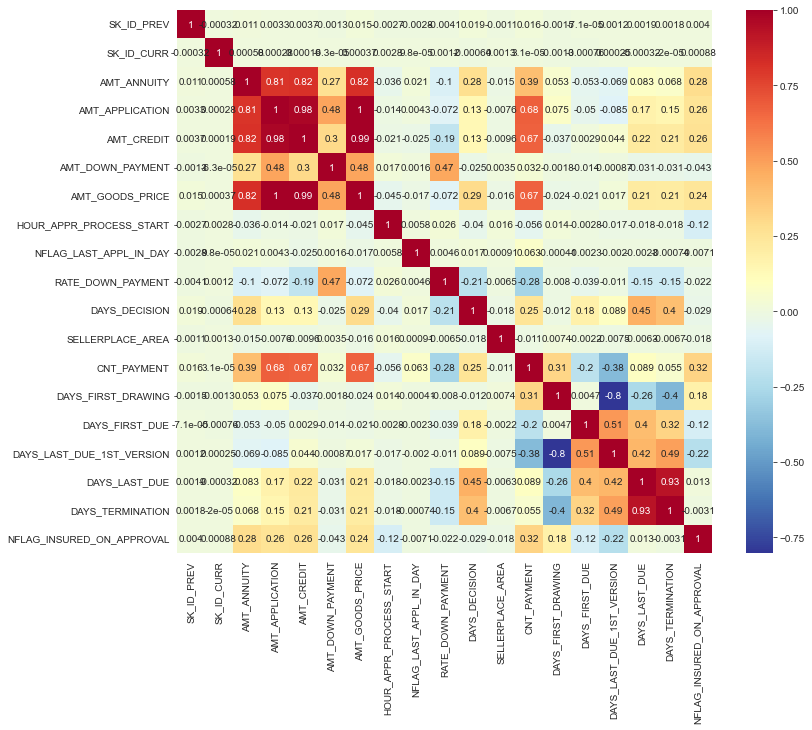

In [203]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
sns.heatmap(prev_app.corr(),annot=True, cmap='RdYlBu_r')

In [204]:
prev_app = prev_app.drop(['AMT_APPLICATION','AMT_CREDIT','AMT_GOODS_PRICE','DAYS_LAST_DUE'],axis=1)

<AxesSubplot:>

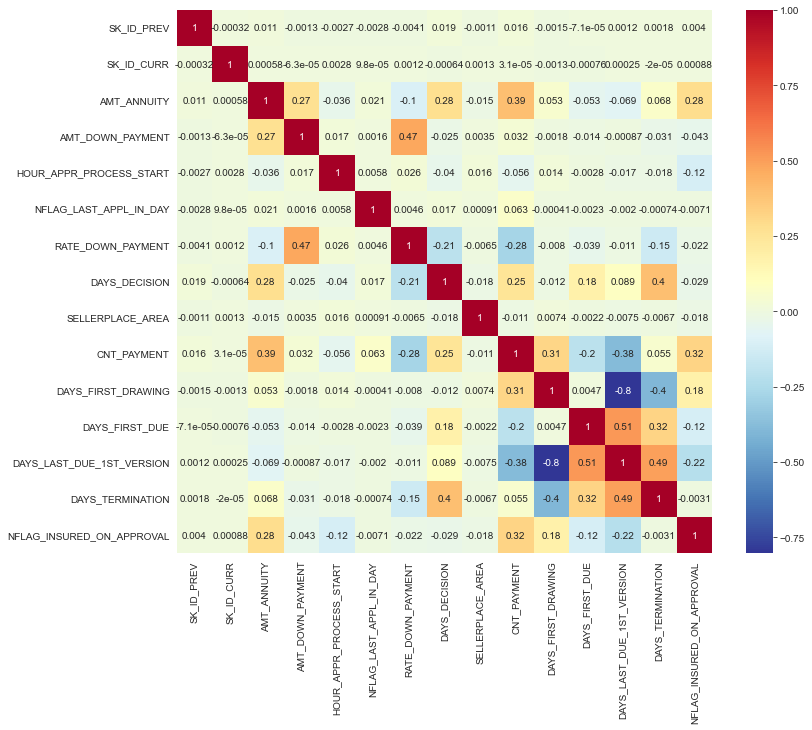

In [205]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
sns.heatmap(prev_app.corr(),annot=True, cmap='RdYlBu_r')

In [206]:
prev_app = prev_app.drop(['WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START',
                                'NAME_SELLER_INDUSTRY','NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION','DAYS_LAST_DUE_1ST_VERSION',
       'FLAG_LAST_APPL_PER_CONTRACT','NFLAG_INSURED_ON_APPROVAL',
    'NFLAG_LAST_APPL_IN_DAY','NAME_CONTRACT_TYPE','DAYS_FIRST_DRAWING','AMT_DOWN_PAYMENT','RATE_DOWN_PAYMENT'],axis=1)

In [207]:
prev_app.head()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,DAYS_FIRST_DUE,DAYS_TERMINATION
0,2030495,271877,1730.430,-42.0,-37.0
1,2802425,108129,25188.615,-134.0,365243.0
2,2523466,122040,15060.735,-271.0,365243.0
3,2819243,176158,47041.335,-482.0,-177.0
4,1784265,202054,31924.395,NaN,NaN


Grouping by SK_ID_CURR and SK_ID_PREV by mean so that we can restore as much information as we can while merging or joining

In [208]:
prev_app = prev_app.groupby(['SK_ID_PREV','SK_ID_CURR']).mean()

In [209]:
prev_app = prev_app.reset_index()

In [210]:
prev_app.head()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,DAYS_FIRST_DUE,DAYS_TERMINATION
0,1000001,158271,6404.310,-268.0,-233.0
1,1000002,101962,6264.000,-1600.0,-1501.0
2,1000003,252457,4951.350,-94.0,365243.0
3,1000004,260094,3391.110,-862.0,-672.0
4,1000005,176456,14713.605,-1688.0,-1415.0


In [211]:
prev_app.shape

(1670214, 5)

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3"> Merge Previous Application and previously merged  Credit card balance + Installments Payments data </h2>
Even after each individual table has been processed, we do this since there may be certain columns that are now inconsequential or highly connected with one another.

In [212]:
prev_cc_inst = pd.merge(left=prev_app, right=ccbal_installment1, how='inner', left_on=['SK_ID_PREV','SK_ID_CURR'], 
                                right_on=['SK_ID_PREV','SK_ID_CURR'])
prev_cc_inst.head()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,DAYS_FIRST_DUE,DAYS_TERMINATION,DAYS_INSTALMENT,AMT_INSTALMENT,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_OTHER_CURRENT,AMT_PAYMENT_CURRENT,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM
0,1000018,394447,2250.0,-130.0,365243.0,-78.352941,2073.994412,74946.285000,81000.000000,0.0,5541.750000,1.200000,0.0,7.600000,2.000000
1,1000030,361282,2250.0,-178.0,365243.0,-115.842105,2284.131316,55991.064375,81562.500000,0.0,6188.631429,0.142857,0.0,5.714286,1.875000
2,1000031,131335,2250.0,-362.0,365243.0,-200.593750,11078.721562,52394.439375,149625.000000,0.0,29543.257500,0.307692,0.0,1.307692,3.687500
3,1000087,399664,6750.0,-913.0,365243.0,-554.046512,4718.621512,39078.104063,71718.750000,0.0,6364.110484,0.225806,0.0,0.193548,9.166667
4,1000094,359175,3375.0,-2597.0,-196.0,-1601.760000,2690.752050,29363.103920,51392.045455,0.0,2955.400057,0.093023,0.0,0.000000,33.670588


<AxesSubplot:>

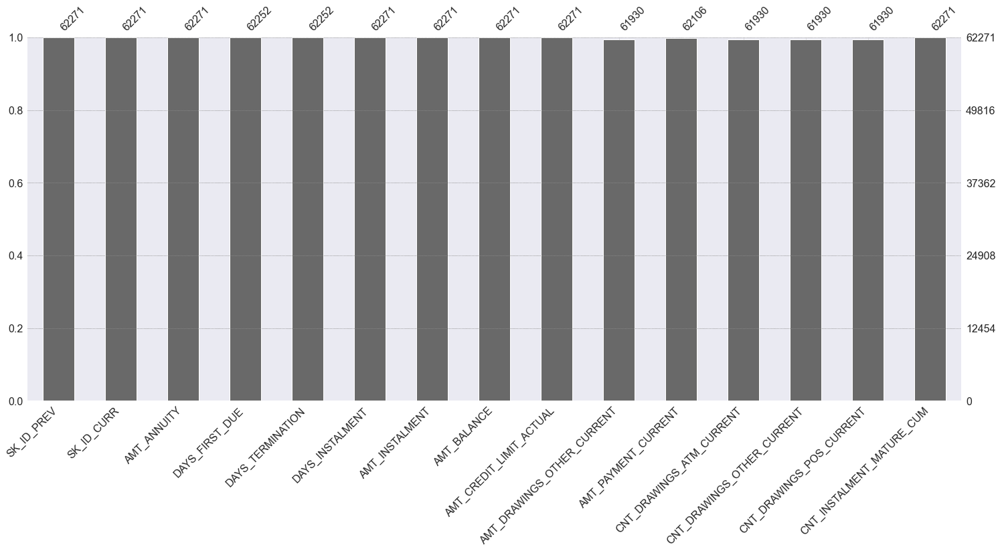

In [213]:
msno.bar(prev_cc_inst)

<AxesSubplot:>

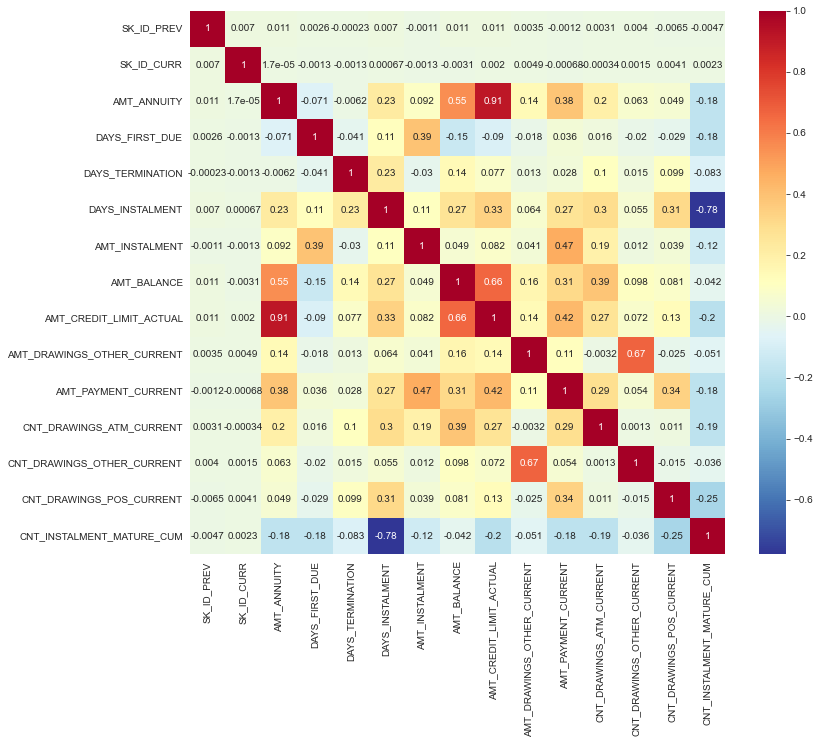

In [214]:

sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
sns.heatmap(prev_cc_inst.corr(),annot=True, cmap='RdYlBu_r')

In [215]:
prev_cc_inst = prev_cc_inst.drop(['AMT_CREDIT_LIMIT_ACTUAL'],axis=1)

<AxesSubplot:>

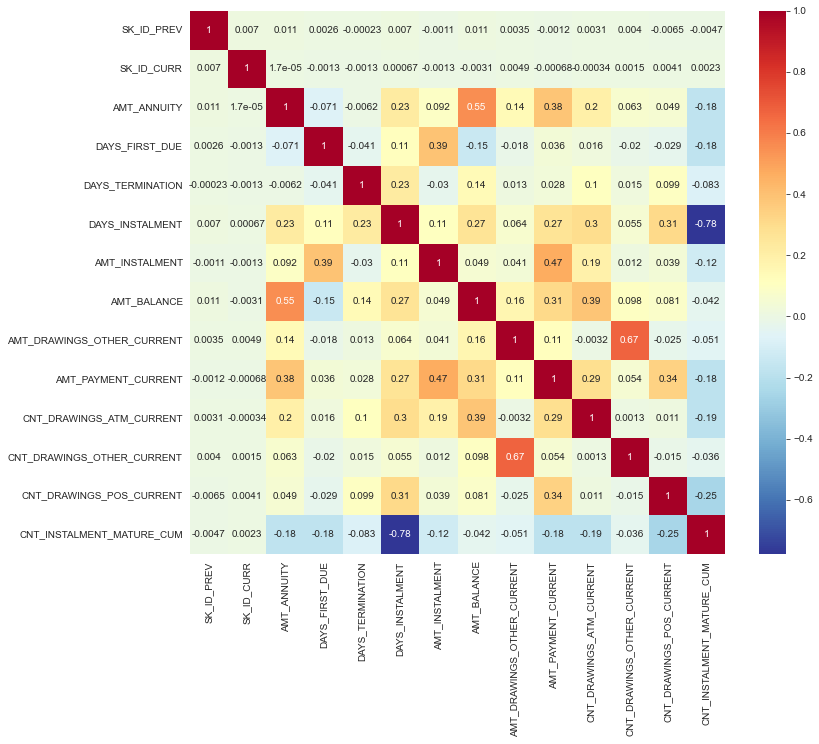

In [216]:

sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
sns.heatmap(prev_cc_inst.corr(),annot=True, cmap='RdYlBu_r')


# prev_cc_inst  is a  Merged DataFrame(Previous Application + Credit card balance + Installments Payments)

In [217]:
train_prev_ccbalinstal = pd.merge(left=final_bureau_train, right=prev_cc_inst, how='left', 
                                     left_on=['SK_ID_CURR'], 
                                right_on=['SK_ID_CURR'])

In [218]:
train_prev_ccbalinstal.shape

(92288, 71)

We are doing this even after merging each individual table is already processed because there might be some columns that are now insignificant or higly correlated with each other.

<AxesSubplot:>

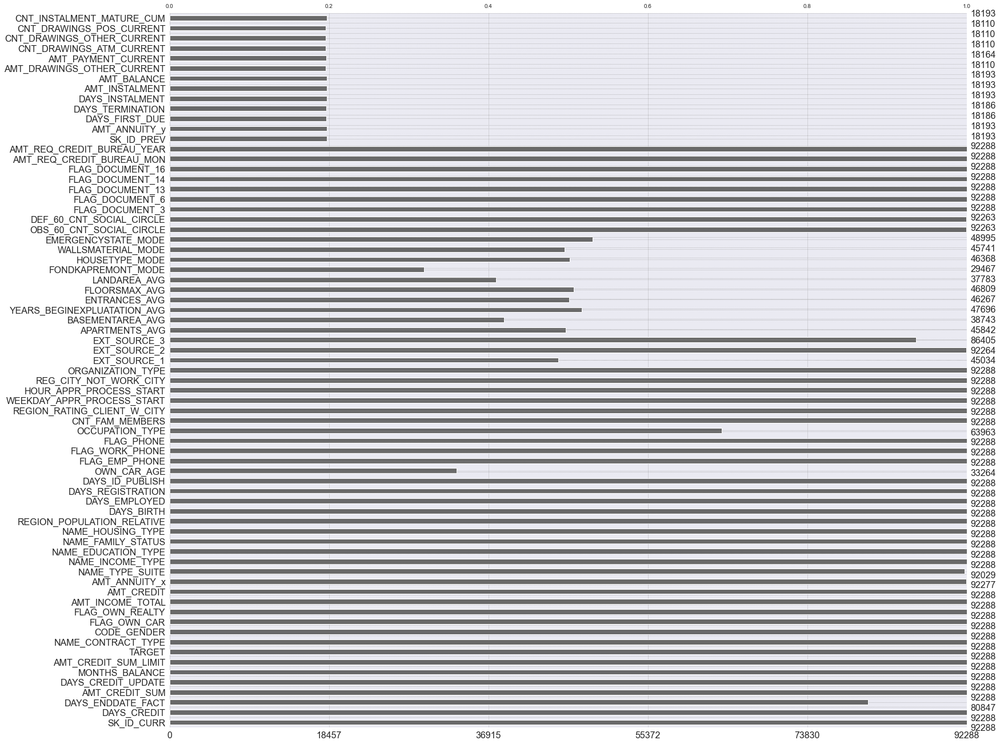

In [219]:
msno.bar(train_prev_ccbalinstal)

In [220]:
train_prev_ccbalinstal.to_csv('final_dataframe.csv',index= False)

In [221]:
final_merged = train_prev_ccbalinstal

In [222]:
final_merged.head()

,SK_ID_CURR,DAYS_CREDIT,DAYS_ENDDATE_FACT,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,MONTHS_BALANCE,AMT_CREDIT_SUM_LIMIT,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,...,DAYS_TERMINATION,DAYS_INSTALMENT,AMT_INSTALMENT,AMT_BALANCE,AMT_DRAWINGS_OTHER_CURRENT,AMT_PAYMENT_CURRENT,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM
0,100002,-1043.0,-967.0,40761.0,-758.0,-26.0,0.0,1,Cash loans,M,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100010,-1939.5,-1138.0,495000.0,-578.0,-46.0,0.0,0,Cash loans,M,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100019,-495.0,NaN,360000.0,-26.5,-8.0,135000.0,0,Cash loans,M,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100032,-1169.5,-662.0,331875.0,-520.5,-28.0,0.0,0,Cash loans,M,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100033,-195.0,NaN,675000.0,-169.0,-3.0,0.0,0,Cash loans,M,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [223]:
train_prev_ccbalinstal.head()

,SK_ID_CURR,DAYS_CREDIT,DAYS_ENDDATE_FACT,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,MONTHS_BALANCE,AMT_CREDIT_SUM_LIMIT,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,...,DAYS_TERMINATION,DAYS_INSTALMENT,AMT_INSTALMENT,AMT_BALANCE,AMT_DRAWINGS_OTHER_CURRENT,AMT_PAYMENT_CURRENT,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM
0,100002,-1043.0,-967.0,40761.0,-758.0,-26.0,0.0,1,Cash loans,M,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100010,-1939.5,-1138.0,495000.0,-578.0,-46.0,0.0,0,Cash loans,M,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100019,-495.0,NaN,360000.0,-26.5,-8.0,135000.0,0,Cash loans,M,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100032,-1169.5,-662.0,331875.0,-520.5,-28.0,0.0,0,Cash loans,M,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100033,-195.0,NaN,675000.0,-169.0,-3.0,0.0,0,Cash loans,M,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<h1 style = "font-family: Times New Roman;background-color:#CbC3E3"> Feature Engineering </h1>

As we strive to modify/create (i.e., engineer) new features from our existing dataset that can be useful in forecasting the TARGET, feature engineering is an essential aspect of machine learning.Correlation of attributes with the target variable in order to develop new features

In [224]:
final_merged.corrwith(final_merged["TARGET"]).sort_values(ascending = True)

EXT_SOURCE_3                  -0.175782
EXT_SOURCE_1                  -0.148456
EXT_SOURCE_2                  -0.136431
CNT_INSTALMENT_MATURE_CUM     -0.063045
DAYS_EMPLOYED                 -0.048916
FLOORSMAX_AVG                 -0.041341
REGION_POPULATION_RELATIVE    -0.034377
FLAG_DOCUMENT_6               -0.032099
APARTMENTS_AVG                -0.029746
BASEMENTAREA_AVG              -0.027292
FLAG_PHONE                    -0.027116
AMT_CREDIT                    -0.026572
AMT_CREDIT_SUM                -0.021473
HOUR_APPR_PROCESS_START       -0.020789
AMT_ANNUITY_y                 -0.016477
AMT_INCOME_TOTAL              -0.015043
ENTRANCES_AVG                 -0.013182
FLAG_DOCUMENT_16              -0.011845
YEARS_BEGINEXPLUATATION_AVG   -0.010040
DAYS_FIRST_DUE                -0.008960
SK_ID_PREV                    -0.008585
FLAG_DOCUMENT_14              -0.008331
FLAG_DOCUMENT_13              -0.008082
LANDAREA_AVG                  -0.005879
AMT_REQ_CREDIT_BUREAU_MON     -0.005491


<AxesSubplot:>

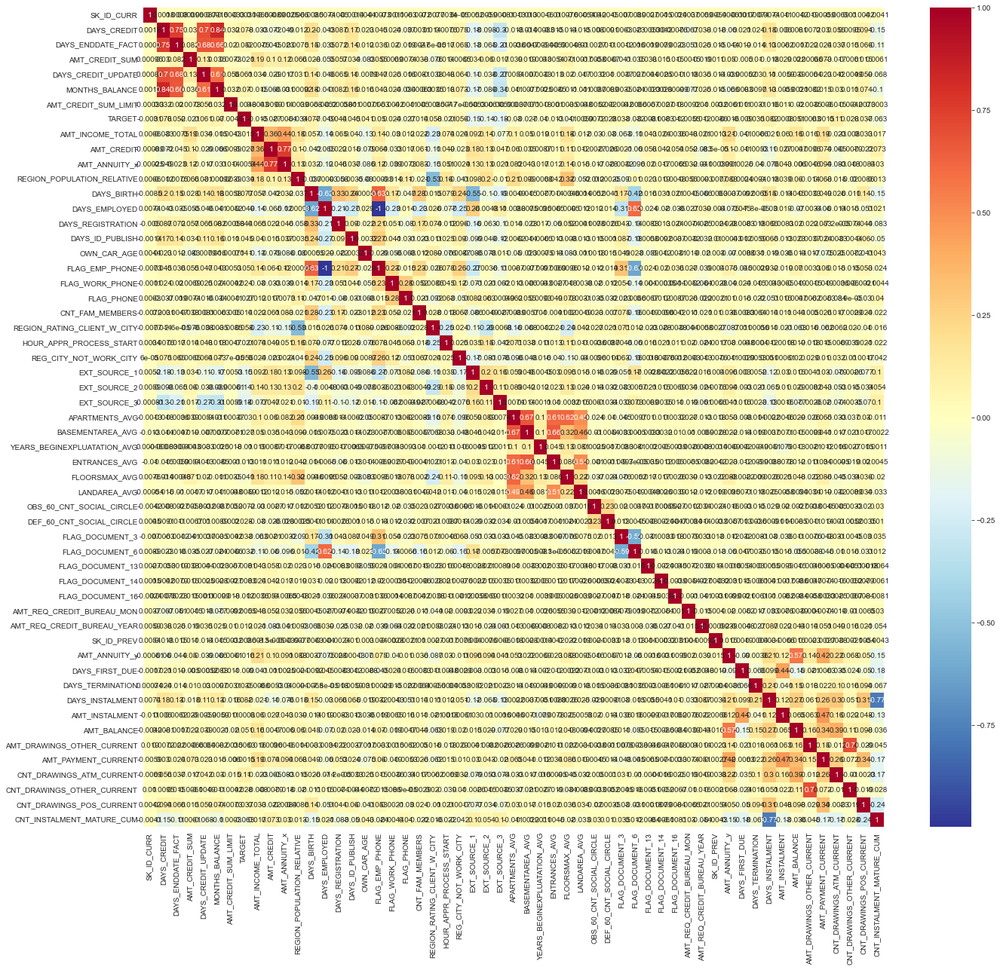

In [225]:

sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (22,20))

sns.heatmap(final_merged.corr(),annot=True, cmap='RdYlBu_r')

## KPI 1

In [226]:
## Feature 1
final_merged['DAYS_EMPLOYED_PCT'] = final_merged['DAYS_EMPLOYED'] / final_merged['DAYS_BIRTH']


- Proportion of days worked - How long a person has worked as a percentage of his life is a better indicator of his capacity to continue repaying his loans.

- We chose this parameter because the total number of days a person has worked in his lifetime has an influence on his credit-paying abilities, and because this is significantly connected with the goal variable, we chose it to develop a new feature out of it.

## KPI 2

In [227]:
final_merged['CREDIT_INCOME_PCT'] = final_merged['AMT_CREDIT'] / final_merged['AMT_INCOME_TOTAL']

- Accessible credit as a proportion of income - If a person has a lot of credit available as a percentage of his income, it might affect his capacity to pay off the debts.
- If a person has a very high credit limit in relation to his or her wages, this will have a significant impact on his or her loan repayment abilities, and he or she will be unable to pay back most of the time.

## KPI 3


In [228]:
final_merged['ANNUITY_INCOME_PCT'] = final_merged['AMT_ANNUITY_x'] / final_merged['AMT_INCOME_TOTAL']


- Annuity as a share of income - An annuity is a more dependable source of income, thus the larger the percentage, the less likely you are to default.

- We chose this characteristic for the reasons stated in the preceding paragraph, as well as because it is substantially linked with the target variable.

## KPI 4

In [229]:
final_merged['CREDIT_TERM_PCT'] = final_merged['AMT_ANNUITY_x'] / final_merged['AMT_CREDIT']


- Annuity as a percentage of accessible credit - An annuity is a more consistent source of income, thus if it is a high percentage compared to his/her credit availability, the individual is more likely to be able to pay off his obligations.

## KPI 5

In [230]:
final_merged['AMOUNT_BALANCE_PTG'] = final_merged['AMT_BALANCE'] / final_merged['DAYS_CREDIT']

- Amount Balance as a percentage - The remaining balance in the account is an essential aspect since it reveals a lot about a person's capacity to repay debt. This is why we took this feature into account, as well as its correlation with the targeted feature.

## KPI 6

In [233]:
final_merged['AVG_TOTL_INCOME_PTG'] = final_merged['AMT_INCOME_TOTAL']/final_merged['AVG_INCOME_EXT_PCT']


- Average Total Income as a Percentage - This is the greatest feature we came up with out of the seven new ones. This graph depicts overall income as a percentage of people's earnings in relation to their external income. We designed this using the Feature 6 that we built earlier, and it is about 22% negatively linked with the get variable.

# KPI 7

In [232]:
final_merged['AVG_INCOME_EXT_PCT'] = (final_merged['EXT_SOURCE_1']+final_merged['EXT_SOURCE_2']
                                            +final_merged['EXT_SOURCE_3'])/3

- Average of three external sources of income - Because these three factors are the most linked with the target variable, we took the average of all three incomes and produced a new feature that informs us how they impact the forecast of the target variable.

In [234]:
final_merged.columns

Index(['SK_ID_CURR', 'DAYS_CREDIT', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_SUM',
       'DAYS_CREDIT_UPDATE', 'MONTHS_BALANCE', 'AMT_CREDIT_SUM_LIMIT',
       'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY_x',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE',
       'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'OWN_CAR_AGE', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_PHONE',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG',
       'LANDAREA_AVG', 'FONDKAPREMONT_MODE', 'HO

In [235]:
final_merged.corrwith(final_merged["TARGET"]).sort_values(ascending = True)

AVG_INCOME_EXT_PCT         -0.225926
EXT_SOURCE_3               -0.175782
EXT_SOURCE_1               -0.148456
EXT_SOURCE_2               -0.136431
AMOUNT_BALANCE_PTG         -0.066617
                              ...   
DAYS_CREDIT                 0.077823
DAYS_INSTALMENT             0.082245
CNT_DRAWINGS_ATM_CURRENT    0.108122
AVG_TOTL_INCOME_PTG         0.123221
TARGET                      1.000000
Length: 62, dtype: float64

<AxesSubplot:>

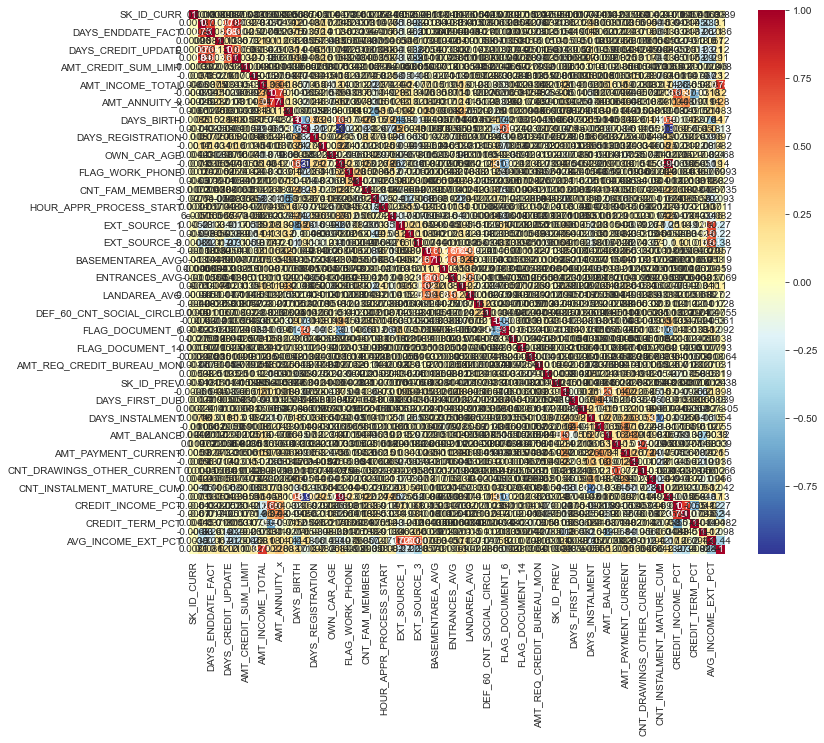

In [236]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
sns.heatmap(final_merged.corr(),annot=True, cmap='RdYlBu_r')

In [237]:
kpi_df = final_merged[['DAYS_EMPLOYED_PCT', 'CREDIT_INCOME_PCT', 'ANNUITY_INCOME_PCT','CREDIT_TERM_PCT', 'AMOUNT_BALANCE_PTG', 'AVG_INCOME_EXT_PCT','AVG_TOTL_INCOME_PTG','TARGET']]
kpi_df.head()

,DAYS_EMPLOYED_PCT,CREDIT_INCOME_PCT,ANNUITY_INCOME_PCT,CREDIT_TERM_PCT,AMOUNT_BALANCE_PTG,AVG_INCOME_EXT_PCT,AVG_TOTL_INCOME_PTG,TARGET
0,0.067329,2.007889,0.121978,0.060749,NaN,0.161787,1.251645e+06,1
1,0.023820,4.250000,0.116875,0.027500,NaN,NaN,NaN,0
2,0.132562,1.903314,0.128000,0.067251,NaN,0.380279,4.141700e+05,0
3,0.077376,2.906880,0.211800,0.072862,NaN,NaN,NaN,0
4,0.179708,2.929000,0.213617,0.072932,NaN,0.603301,4.475377e+05,0


In [238]:
kpi_plot_corr = pd.DataFrame(kpi_df.corrwith(kpi_df["TARGET"]).sort_values(ascending = True)).reset_index()

In [239]:
kpi_plot_corr = kpi_plot_corr.rename(columns={'index':'Column_name',0:'corr_with_target'})

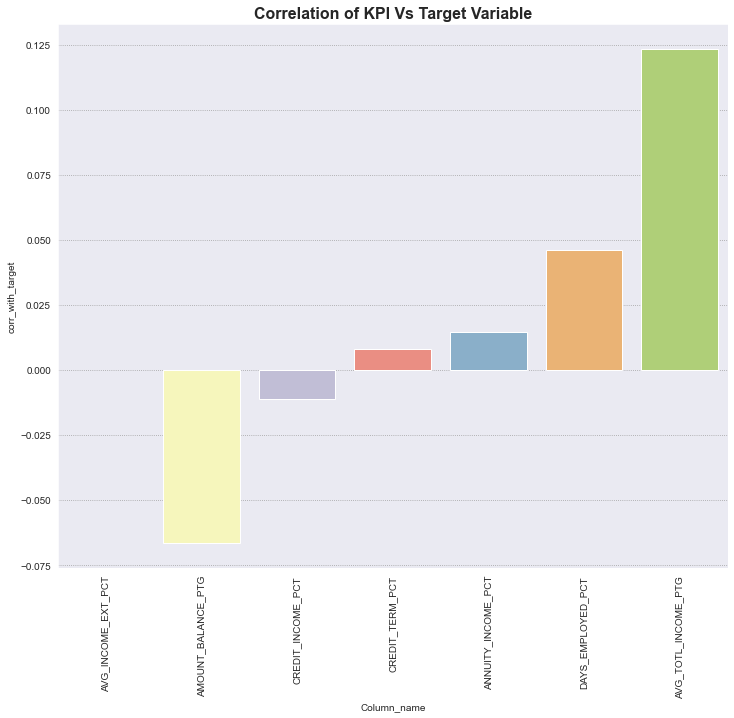

In [240]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
sns.barplot(data=kpi_plot_corr,x=kpi_plot_corr['Column_name'][:-1], y= kpi_plot_corr['corr_with_target'][1:], palette = 'Set3')
plt.xticks(rotation=90)
plt.title('Correlation of KPI Vs Target Variable', fontweight = 'bold', fontsize = 16)
plt.show()

In [241]:
nan = pd.DataFrame(final_merged.isna().sum())

In [242]:
nan = nan.rename(columns={'index':'Column_name',0:'missing cnt'})

In [243]:
nan[nan['missing cnt']>0]

,missing cnt
DAYS_ENDDATE_FACT,11441
AMT_ANNUITY_x,11
NAME_TYPE_SUITE,259
OWN_CAR_AGE,59024
OCCUPATION_TYPE,28325
EXT_SOURCE_1,47254
EXT_SOURCE_2,24
EXT_SOURCE_3,5883
APARTMENTS_AVG,46446
BASEMENTAREA_AVG,53545


In [244]:
final_merged['NAME_TYPE_SUITE'].fillna('Other_C', inplace=True) 
final_merged.head()
#Filling null values in NAME_TYPE_SUITE column with "Other_C"

,SK_ID_CURR,DAYS_CREDIT,DAYS_ENDDATE_FACT,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,MONTHS_BALANCE,AMT_CREDIT_SUM_LIMIT,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,...,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,DAYS_EMPLOYED_PCT,CREDIT_INCOME_PCT,ANNUITY_INCOME_PCT,CREDIT_TERM_PCT,AMOUNT_BALANCE_PTG,AVG_INCOME_EXT_PCT,AVG_TOTL_INCOME_PTG
0,100002,-1043.0,-967.0,40761.0,-758.0,-26.0,0.0,1,Cash loans,M,...,NaN,NaN,NaN,0.067329,2.007889,0.121978,0.060749,NaN,0.161787,1.251645e+06
1,100010,-1939.5,-1138.0,495000.0,-578.0,-46.0,0.0,0,Cash loans,M,...,NaN,NaN,NaN,0.023820,4.250000,0.116875,0.027500,NaN,NaN,NaN
2,100019,-495.0,NaN,360000.0,-26.5,-8.0,135000.0,0,Cash loans,M,...,NaN,NaN,NaN,0.132562,1.903314,0.128000,0.067251,NaN,0.380279,4.141700e+05
3,100032,-1169.5,-662.0,331875.0,-520.5,-28.0,0.0,0,Cash loans,M,...,NaN,NaN,NaN,0.077376,2.906880,0.211800,0.072862,NaN,NaN,NaN
4,100033,-195.0,NaN,675000.0,-169.0,-3.0,0.0,0,Cash loans,M,...,NaN,NaN,NaN,0.179708,2.929000,0.213617,0.072932,NaN,0.603301,4.475377e+05


In [245]:
final_merged.shape

(92288, 78)

In [246]:
temp_col = nan[nan['missing cnt'] != 0].index.values.tolist()


In [247]:
for col in temp_col:
    if 'CNT_SOCIAL_CIRCLE' in col:
        print("columns to be filled with 0 is: {}".format(col))
        final_merged[col].fillna(0,inplace=True)  

columns to be filled with 0 is: OBS_60_CNT_SOCIAL_CIRCLE
columns to be filled with 0 is: DEF_60_CNT_SOCIAL_CIRCLE


In [248]:
nan['count_%'] = nan['missing cnt']/len(final_merged)*100

In [249]:
nan

,missing cnt,count_%
SK_ID_CURR,0,0.000000
DAYS_CREDIT,0,0.000000
DAYS_ENDDATE_FACT,11441,12.397061
AMT_CREDIT_SUM,0,0.000000
DAYS_CREDIT_UPDATE,0,0.000000
...,...,...
ANNUITY_INCOME_PCT,11,0.011919
CREDIT_TERM_PCT,11,0.011919
AMOUNT_BALANCE_PTG,74095,80.286711
AVG_INCOME_EXT_PCT,49895,54.064450


In [250]:
nan = nan[nan['count_%'] <= 30]


In [251]:
nan

,missing cnt,count_%
SK_ID_CURR,0,0.000000
DAYS_CREDIT,0,0.000000
DAYS_ENDDATE_FACT,11441,12.397061
AMT_CREDIT_SUM,0,0.000000
DAYS_CREDIT_UPDATE,0,0.000000
MONTHS_BALANCE,0,0.000000
AMT_CREDIT_SUM_LIMIT,0,0.000000
TARGET,0,0.000000
NAME_CONTRACT_TYPE,0,0.000000
CODE_GENDER,0,0.000000


In [252]:
selected_columns = nan.index.values.tolist()
selected_columns

['SK_ID_CURR',
 'DAYS_CREDIT',
 'DAYS_ENDDATE_FACT',
 'AMT_CREDIT_SUM',
 'DAYS_CREDIT_UPDATE',
 'MONTHS_BALANCE',
 'AMT_CREDIT_SUM_LIMIT',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY_x',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_PHONE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_16',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'DAYS_EMPLOYED_PCT',
 'CREDIT_INC

In [253]:
selected_columns

['SK_ID_CURR',
 'DAYS_CREDIT',
 'DAYS_ENDDATE_FACT',
 'AMT_CREDIT_SUM',
 'DAYS_CREDIT_UPDATE',
 'MONTHS_BALANCE',
 'AMT_CREDIT_SUM_LIMIT',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY_x',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_PHONE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_16',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'DAYS_EMPLOYED_PCT',
 'CREDIT_INC

In [254]:
nan

,missing cnt,count_%
SK_ID_CURR,0,0.000000
DAYS_CREDIT,0,0.000000
DAYS_ENDDATE_FACT,11441,12.397061
AMT_CREDIT_SUM,0,0.000000
DAYS_CREDIT_UPDATE,0,0.000000
MONTHS_BALANCE,0,0.000000
AMT_CREDIT_SUM_LIMIT,0,0.000000
TARGET,0,0.000000
NAME_CONTRACT_TYPE,0,0.000000
CODE_GENDER,0,0.000000


In [255]:
X_feature = final_merged[selected_columns]
X_feature['NAME_TYPE_SUITE'].fillna('Other_C', inplace=True) 
X_feature.head() 

,SK_ID_CURR,DAYS_CREDIT,DAYS_ENDDATE_FACT,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,MONTHS_BALANCE,AMT_CREDIT_SUM_LIMIT,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,...,FLAG_DOCUMENT_6,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_PCT,CREDIT_INCOME_PCT,ANNUITY_INCOME_PCT,CREDIT_TERM_PCT
0,100002,-1043.0,-967.0,40761.0,-758.0,-26.0,0.0,1,Cash loans,M,...,0,0,0,0,0.0,1.0,0.067329,2.007889,0.121978,0.060749
1,100010,-1939.5,-1138.0,495000.0,-578.0,-46.0,0.0,0,Cash loans,M,...,0,0,0,0,0.0,0.0,0.023820,4.250000,0.116875,0.027500
2,100019,-495.0,NaN,360000.0,-26.5,-8.0,135000.0,0,Cash loans,M,...,0,0,0,0,0.0,1.0,0.132562,1.903314,0.128000,0.067251
3,100032,-1169.5,-662.0,331875.0,-520.5,-28.0,0.0,0,Cash loans,M,...,0,0,0,0,0.0,0.0,0.077376,2.906880,0.211800,0.072862
4,100033,-195.0,NaN,675000.0,-169.0,-3.0,0.0,0,Cash loans,M,...,0,0,0,0,1.0,1.0,0.179708,2.929000,0.213617,0.072932


## Removing nan values for EXT_SOURCE_3

In [256]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

temp_corr_with_ext3 = pd.DataFrame()

for col in selected_columns:
    print(X_feature[col])
    if X_feature[col].dtype == 'int':
        l = [col, X_feature['EXT_SOURCE_3'].corr(X_feature[col])]
    else:
        l = [col, X_feature['EXT_SOURCE_3'].corr(pd.DataFrame(LabelEncoder().fit_transform(X_feature[[col]]))[0])]
    temp_corr_with_ext3 = temp_corr_with_ext3.append(pd.Series(l),ignore_index=True)
temp_corr_with_ext3 = temp_corr_with_ext3.rename(columns={0:'col_name',1:'correlation_with_EXT_3'})
temp_corr_with_ext3['correlation_with_EXT_3'] = abs(temp_corr_with_ext3['correlation_with_EXT_3'])
temp_corr_with_ext3 = temp_corr_with_ext3.sort_values(by='correlation_with_EXT_3',ascending=True)
temp_corr_with_ext3

0        100002
1        100010
2        100019
3        100032
4        100033
          ...  
92283    456244
92284    456247
92285    456253
92286    456254
92287    456255
Name: SK_ID_CURR, Length: 92288, dtype: int64
0       -1043.0
1       -1939.5
2        -495.0
3       -1169.5
4        -195.0
          ...  
92283   -2138.0
92284   -1757.0
92285    -919.0
92286   -1104.0
92287   -1021.0
Name: DAYS_CREDIT, Length: 92288, dtype: float64
0        -967.0
1       -1138.0
2           NaN
3        -662.0
4           NaN
          ...  
92283   -1438.0
92284   -1402.0
92285    -794.0
92286    -859.0
92287    -958.0
Name: DAYS_ENDDATE_FACT, Length: 92288, dtype: float64
0         40761.0
1        495000.0
2        360000.0
3        331875.0
4        675000.0
           ...   
92283    315000.0
92284    143667.0
92285    675000.0
92286     45000.0
92287    436032.0
Name: AMT_CREDIT_SUM, Length: 92288, dtype: float64
0        -758.0
1        -578.0
2         -26.5
3        -520.5
4       

,col_name,correlation_with_EXT_3
27,FLAG_PHONE,0.000487
8,NAME_CONTRACT_TYPE,0.000693
18,NAME_FAMILY_STATUS,0.000783
0,SK_ID_CURR,0.000789
30,WEEKDAY_APPR_PROCESS_START,0.001119
45,DAYS_EMPLOYED_PCT,0.003052
41,FLAG_DOCUMENT_14,0.003543
36,OBS_60_CNT_SOCIAL_CIRCLE,0.005924
29,REGION_RATING_CLIENT_W_CITY,0.006832
40,FLAG_DOCUMENT_13,0.008859


In [257]:
ext3_source_data = X_feature[temp_corr_with_ext3['col_name'].tolist()]

for col in ext3_source_data.columns.tolist():
    if col != 'EXT_SOURCE_3':
        ext3_source_data[col] = LabelEncoder().fit_transform(X_feature[[col]])

ext_source3_train = ext3_source_data[ext3_source_data['EXT_SOURCE_3'].notnull()]
ext_source3_test = ext3_source_data[ext3_source_data['EXT_SOURCE_3'].isnull()]
ext_source3_train.shape, ext_source3_test.shape

((86405, 49), (5883, 49))

In [258]:
exs3_y_train = ext_source3_train[['EXT_SOURCE_3']]
exs3_X_train = ext_source3_train.drop(columns=['EXT_SOURCE_3'])

exs3_X_test = ext_source3_test.drop(columns=['EXT_SOURCE_3'])

In [259]:
from sklearn.linear_model import LinearRegression

model = LinearRegression().fit(exs3_X_train, exs3_y_train) 
y_pred_exs3 = model.predict(exs3_X_test)

In [260]:
y_pred_exs3

array([[0.32636158],
       [0.48551255],
       [0.58024321],
       ...,
       [0.40784721],
       [0.52454786],
       [0.37902652]])

In [261]:
exs3_output = exs3_X_test
exs3_output['exs3_y'] = y_pred_exs3
exs3_output

,FLAG_PHONE,NAME_CONTRACT_TYPE,NAME_FAMILY_STATUS,SK_ID_CURR,WEEKDAY_APPR_PROCESS_START,DAYS_EMPLOYED_PCT,FLAG_DOCUMENT_14,OBS_60_CNT_SOCIAL_CIRCLE,REGION_RATING_CLIENT_W_CITY,FLAG_DOCUMENT_13,...,FLAG_EMP_PHONE,EXT_SOURCE_2,DAYS_ID_PUBLISH,TARGET,DAYS_BIRTH,DAYS_ENDDATE_FACT,DAYS_CREDIT_UPDATE,MONTHS_BALANCE,DAYS_CREDIT,exs3_y
7,1,0,1,7,1,14449,0,4,1,0,...,1,1096,5494,0,7556,4181,3630,182,4246,0.326362
67,0,0,1,67,6,28594,0,3,1,0,...,1,48736,4769,0,6814,3106,3094,149,3031,0.485513
74,0,0,1,74,2,48380,0,2,1,0,...,1,7431,1109,0,12271,2341,1821,128,539,0.580243
81,0,0,1,81,4,56965,0,0,0,0,...,1,26396,512,0,8295,4035,3442,176,3790,0.413847
89,0,0,3,89,6,11360,0,0,2,0,...,1,30633,3706,0,14881,4265,3447,171,3695,0.385567
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92158,1,0,1,92101,4,2979,0,2,1,0,...,0,4823,1077,0,3019,2851,2302,153,2760,0.533488
92160,0,0,1,92103,0,79632,0,3,1,0,...,1,52518,1707,0,8298,420,2280,116,410,0.634606
92171,0,0,1,92114,4,32291,0,0,1,0,...,1,61642,1742,1,11730,4265,3712,160,3111,0.407847
92180,0,0,1,92123,2,302,0,0,1,0,...,0,59912,1572,0,8445,2320,2387,143,2216,0.524548


In [262]:
X_feature.shape

(92288, 49)

In [263]:
exs3_output = exs3_output.reset_index().rename(columns={'index':'index_to_be_updated'})
for i in exs3_output['index_to_be_updated'].tolist():
    X_feature['EXT_SOURCE_3'].iloc[i] = exs3_output[exs3_output['index_to_be_updated']==i]['exs3_y'].values[0]

## Removing nan values for DAYS_ENDDATE_FACT

In [264]:
X_feature.shape

(92288, 49)

In [265]:
X_feature.corr()['DAYS_ENDDATE_FACT']

SK_ID_CURR                     0.000804
DAYS_CREDIT                    0.751074
DAYS_ENDDATE_FACT              1.000000
AMT_CREDIT_SUM                 0.082186
DAYS_CREDIT_UPDATE             0.677387
MONTHS_BALANCE                 0.664599
AMT_CREDIT_SUM_LIMIT           0.020271
TARGET                         0.052098
AMT_INCOME_TOTAL              -0.007543
AMT_CREDIT                    -0.045494
AMT_ANNUITY_x                 -0.022702
REGION_POPULATION_RELATIVE     0.007457
DAYS_BIRTH                     0.145874
DAYS_EMPLOYED                 -0.035030
DAYS_REGISTRATION              0.072038
DAYS_ID_PUBLISH                0.141827
FLAG_EMP_PHONE                 0.036444
FLAG_WORK_PHONE                0.020332
FLAG_PHONE                    -0.019190
CNT_FAM_MEMBERS                0.004729
REGION_RATING_CLIENT_W_CITY   -0.000026
HOUR_APPR_PROCESS_START        0.016558
REG_CITY_NOT_WORK_CITY         0.064551
EXT_SOURCE_2                  -0.064991
EXT_SOURCE_3                  -0.226490


In [266]:
#since DAYS_CREDIT and DAYS_ENDDATE_FACT are heavy co-related ,so we need removed this attribute

In [267]:
X_feature = X_feature.drop(['DAYS_CREDIT'],axis=1)

In [268]:
X_feature

,SK_ID_CURR,DAYS_ENDDATE_FACT,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,MONTHS_BALANCE,AMT_CREDIT_SUM_LIMIT,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,...,FLAG_DOCUMENT_6,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_PCT,CREDIT_INCOME_PCT,ANNUITY_INCOME_PCT,CREDIT_TERM_PCT
0,100002,-967.0,40761.0,-758.0,-26.0,0.0,1,Cash loans,M,N,...,0,0,0,0,0.0,1.0,0.067329,2.007889,0.121978,0.060749
1,100010,-1138.0,495000.0,-578.0,-46.0,0.0,0,Cash loans,M,Y,...,0,0,0,0,0.0,0.0,0.023820,4.250000,0.116875,0.027500
2,100019,NaN,360000.0,-26.5,-8.0,135000.0,0,Cash loans,M,Y,...,0,0,0,0,0.0,1.0,0.132562,1.903314,0.128000,0.067251
3,100032,-662.0,331875.0,-520.5,-28.0,0.0,0,Cash loans,M,N,...,0,0,0,0,0.0,0.0,0.077376,2.906880,0.211800,0.072862
4,100033,NaN,675000.0,-169.0,-3.0,0.0,0,Cash loans,M,Y,...,0,0,0,0,1.0,1.0,0.179708,2.929000,0.213617,0.072932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92283,456244,-1438.0,315000.0,-1381.0,-33.5,0.0,0,Cash loans,F,N,...,0,0,0,0,1.0,5.0,0.261206,4.995448,0.137862,0.027598
92284,456247,-1402.0,143667.0,-1402.0,-22.0,0.0,0,Cash loans,F,N,...,0,0,0,0,1.0,2.0,0.033614,3.071200,0.157960,0.051433
92285,456253,-794.0,675000.0,-179.0,-14.0,0.0,0,Cash loans,F,N,...,0,0,0,0,1.0,1.0,0.529266,4.429176,0.195941,0.044239
92286,456254,-859.0,45000.0,-401.0,-18.0,0.0,1,Cash loans,F,N,...,0,0,0,0,0.0,0.0,0.400134,2.164368,0.118158,0.054592


In [269]:
X_feature = X_feature.dropna()


# Hyperparameter tuning(Grid Search)

In [270]:
from sklearn.pipeline import Pipeline, FeatureUnion, make_pipeline
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

In [271]:
op_features= X_feature['TARGET']
in_features = X_feature.drop(['TARGET'],axis=1)
op_features = pd.DataFrame(op_features, columns = ["TARGET"])
op_features

,TARGET
0,1
1,0
3,0
5,0
6,0
...,...
92283,0
92284,0
92285,0
92286,1


In [272]:
X_train,X_test,y_train,y_test = train_test_split(in_features,op_features, test_size=0.2,random_state=69)
X_train,X_valid,y_train,y_valid = train_test_split(in_features,op_features, test_size=0.2,random_state=69)

In [273]:
int_x= in_features.select_dtypes(include='int64')
float_x = in_features.select_dtypes(include='float64')
num_x = list(pd.concat([int_x,float_x], axis=1))
cat_x = list(in_features.select_dtypes(include='object'))


In [274]:
print(cat_x)


['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE']


In [275]:
print(num_x)

['SK_ID_CURR', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_CITY_NOT_WORK_CITY', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_16', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_SUM', 'DAYS_CREDIT_UPDATE', 'MONTHS_BALANCE', 'AMT_CREDIT_SUM_LIMIT', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY_x', 'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'DAYS_EMPLOYED_PCT', 'CREDIT_INCOME_PCT', 'ANNUITY_INCOME_PCT', 'CREDIT_TERM_PCT']


<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Build processing pipelines </h2>
The pipeline is being built at this stage of the project. Because the data contains both numerical and categorical characteristics, two pipelines (one for each type of data) are necessary because the transformations are different. After that, the two pipelines should be merged to create a single complete pipeline that transforms the whole dataset.

In [276]:
numrical_pipeline = Pipeline([
    ('scaler', StandardScaler()), 
    ('imputer', SimpleImputer(strategy = 'median')) 
])
categorical_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

In [277]:
final_pipeline = ColumnTransformer([
    ("num_pipeline", numrical_pipeline, num_x),
    ("cat_pipeline", categorical_pipeline, cat_x)], remainder = 'drop')

# X_trn_coverted = final_pipeline.fit_transform(X_train)


In [278]:
# col_names = num_x  + \
#                list(final_pipeline.transformers_[1][1].named_steps["ohe"].get_feature_names(cat_x)) 

# pd.DataFrame(X_trn_coverted, columns=col_names).head()

In [279]:
model = Pipeline(steps = [('data_pipeline_merge',final_pipeline),
                         ('classifier', LogisticRegression(solver='lbfgs',penalty='l2'))])


<h1 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Modelling, Fitting and Storing Results </h1>


<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Logistic Regression with GridSearchCV</h2>


In [280]:
from IPython.display import Image
Image(url= "https://miro.medium.com/max/1400/1*UgYbimgPXf6XXxMy2yqRLw.png", width=900, height=900)

In the same way that linear regression finds an equation that predicts an outcome for a binary variable, Y, from one or more response variables, X, logistic regression (LR) finds an equation that predicts an outcome for a binary variable, Y, from one or more response variables, X. The response variables, unlike linear regression, can be categorical or continuous, as the model does not need continuous data. LR employs the log odds ratio rather than probabilities to predict the classification, and an iterative maximum likelihood technique rather than least squares to build the final model. This means that while employing LR, the researcher has greater flexibility, and the approach may be better suited to nonnormally distributed data or samples with mismatched covariance matrices. The assumption of independence among variables in logistic regression is not always satisfied in morphotropic datasets.

In [281]:
from IPython.display import Image

Image(url= "https://cdn-images-1.medium.com/max/1024/1*NE3IIbNeK9XOirWiQ9fPqw.png", width=900, height=900)

In [292]:
param_grid = {
    'classifier__C': [0.1,1,10,100]
}
grids = GridSearchCV(model, param_grid, cv=5, n_jobs = -1, verbose = 2, refit = True)
start = time()

grids.fit(X_train, y_train)

trainAcc  = grids.score(X_train, y_train)
validAcc  = grids.score(X_valid, y_valid)

start = time()
testAcc  = grids.score(X_test, y_test)
test_time = np.round(time() - start, 4)
auc_logreg = roc_auc_score(y_test, grids.predict_proba(X_test)[:, 1])
#del experimentLog
try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["Pipeline", "Dataset", "TrainAcc", "ValidAcc", "TestAcc","Train Time(s)",  "Test Time(s)", "Description"])
experimentLog.loc[len(experimentLog)] =[f"GridSearchCV LogReg without weights balanced", "HCDR", f"{trainAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", f"{testAcc*100:8.2f}%",train_time, test_time,"GridSearchCV LogReg pipeline with Cat+Num features"]

experimentLog

Fitting 5 folds for each of 4 candidates, totalling 20 fits


,Pipeline,Dataset,TrainAcc,ValidAcc,TestAcc,Train Time(s),Test Time(s),Description
0,Baseline 1 LogReg,HCDR,91.964%,91.791%,91.851%,6.3786,0.2196,Baseline 1 LogReg pipeline with Cat+Num features
1,Baseline 1 LogReg,HCDR,91.964%,91.865%,91.865%,9.8333,0.3966,Baseline 1 LogReg pipeline with Cat+Num features
2,GridSearchCV LogReg without weights balanced,HCDR,92.34%,92.15%,92.15%,9.8333,0.0464,GridSearchCV LogReg pipeline with Cat+Num feat...


In [ ]:
grids.best_params_

In [293]:
clf_pipe = make_pipeline(final_pipeline, LogisticRegression(solver='lbfgs',penalty='l2',C=0.1))

start = time()
clf_pipe.fit(X_train, y_train)
train_time = np.round(time() - start, 4)

trainAcc  = clf_pipe.score(X_train, y_train)
validAcc  = clf_pipe.score(X_test, y_test)
start = time()
testAcc  = clf_pipe.score(X_test, y_test)
test_time = np.round(time() - start, 4)
try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["Pipeline", "Dataset", "TrainAcc", "ValidAcc", "TestAcc",
                                               "Train Time(s)",  "Test Time(s)", "Description",])
experimentLog.loc[len(experimentLog)] =[f"best params LogReg", "HCDR", 
                                        f"{trainAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", f"{testAcc*100:8.2f}%",
                                        train_time, test_time,
                                        "Baseline 1 LogReg pipeline with Cat+Num features"]

experimentLog

,Pipeline,Dataset,TrainAcc,ValidAcc,TestAcc,Train Time(s),Test Time(s),Description
0,Baseline 1 LogReg,HCDR,91.964%,91.791%,91.851%,6.3786,0.2196,Baseline 1 LogReg pipeline with Cat+Num features
1,Baseline 1 LogReg,HCDR,91.964%,91.865%,91.865%,9.8333,0.3966,Baseline 1 LogReg pipeline with Cat+Num features
2,GridSearchCV LogReg without weights balanced,HCDR,92.34%,92.15%,92.15%,9.8333,0.0464,GridSearchCV LogReg pipeline with Cat+Num feat...
3,best params LogReg,HCDR,92.34%,92.15%,92.15%,1.7742,0.0442,Baseline 1 LogReg pipeline with Cat+Num features


In [294]:
y_pred_merged = grids.predict(X_test)

In [295]:
res_merged = grids.predict_proba(X_train)
res_merged

array([[0.92880841, 0.07119159],
       [0.9663747 , 0.0336253 ],
       [0.95866017, 0.04133983],
       ...,
       [0.93190297, 0.06809703],
       [0.90320285, 0.09679715],
       [0.95213088, 0.04786912]])

## Validation Accuracy

In [296]:
print('Validation set accuracy score: ' + str(accuracy_score(y_test,y_pred_merged)))

Validation set accuracy score: 0.9214922048997772


### Loss function used (data loss and regularization parts) in latex


source: https://tex.stackexchange.com/questions/517834/how-to-define-loss-function-in-latex

In [297]:
from IPython.display import display, Math, Latex

In [298]:
display(Math(r'[L_\varepsilon(y,f(x,w))=\max\{0, |y-f(x,w)|-\varepsilon\}]'))

<IPython.core.display.Math object>

In [299]:
from sklearn.metrics import log_loss

log_loss(y_test,y_pred_merged)

2.7115634275630303

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> ROC-AUC Score</h3>


In [300]:
from sklearn.metrics import roc_auc_score

roc_auc_score(y_test, grids.predict_proba(X_test)[:, 1])

0.7346718977812339

Text(88.0, 0.5, 'Actual')

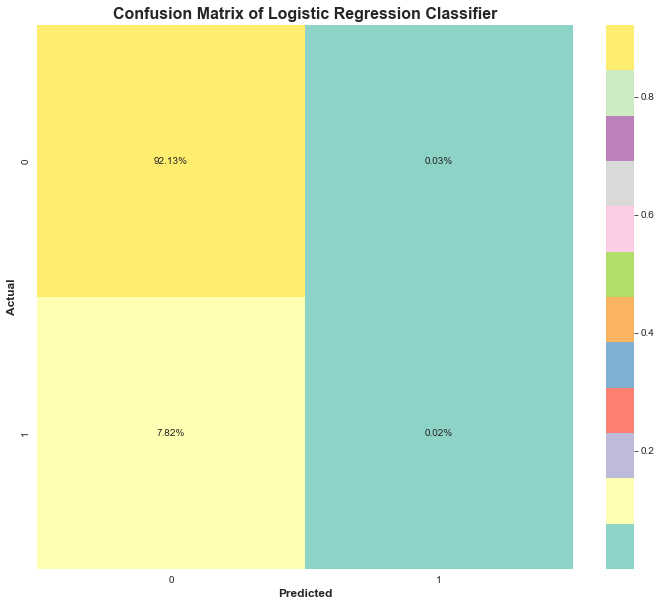

In [301]:
from sklearn.metrics import accuracy_score, recall_score, plot_roc_curve, confusion_matrix, classification_report, precision_recall_curve, auc
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
cf_matrix = confusion_matrix(y_test, y_pred_merged)
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='Set3')
plt.title('Confusion Matrix of Logistic Regression Classifier', fontweight='bold', fontsize=16)
plt.xlabel('Predicted', fontweight='bold', fontsize=12)
plt.ylabel('Actual', fontweight='bold', fontsize=12)

# XGboost

In [302]:
d = 'https://www.researchgate.net/profile/Li-Mingtao-2/publication/335483097/figure/fig3/AS:934217085100032@1599746118459/A-general-architecture-of-XGBoost.ppm'

from IPython.display import Image
Image(url= d, width=900, height=900)



In [303]:
import xgboost as xgb


In [ ]:

model = Pipeline(steps = [('data_pipeline_merge',final_pipeline),
                         ('clf',xgb.XGBClassifier())])

param_grid = {
    'clf__max_depth': [2, 3, 5, 7, 10],
    'clf__n_estimators': [10, 100, 500]
}

xgboost_search = GridSearchCV(model, param_grid, scoring="roc_auc",cv=5)

# Time and score test predictions
start = time()
xgboost_search.fit(X_train, y_train)
train_time = np.round(time() - start, 4)

trainAcc  = xgboost_search.score(X_train, y_train)
validAcc  = xgboost_search.score(X_valid, y_valid)
start = time()
testAcc  = xgboost_search.score(X_test, y_test)
test_time = np.round(time() - start, 4)

number_of_inputs = X_train.shape[1]
auc = roc_auc_score(y_test, xgboost_search.predict_proba(X_test)[:, 1])



In [305]:

try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["Pipeline", "Dataset", "TrainAcc", "ValidAcc", "TestAcc",
                                               "Train Time(s)",  "Test Time(s)", "Description",])
experimentLog.loc[len(experimentLog)] =[f"Gridsearch Xgboost with {number_of_inputs} inputs", "HCDR", 
                                        f"{trainAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", f"{testAcc*100:8.2f}%", 
                                        train_time, test_time,
                                        "Xgboost GridSearch with selected features"]
experimentLog

,Pipeline,Dataset,TrainAcc,ValidAcc,TestAcc,Train Time(s),Test Time(s),Description
0,Baseline 1 LogReg,HCDR,91.964%,91.791%,91.851%,6.3786,0.2196,Baseline 1 LogReg pipeline with Cat+Num features
1,Baseline 1 LogReg,HCDR,91.964%,91.865%,91.865%,9.8333,0.3966,Baseline 1 LogReg pipeline with Cat+Num features
2,GridSearchCV LogReg without weights balanced,HCDR,92.34%,92.15%,92.15%,9.8333,0.0464,GridSearchCV LogReg pipeline with Cat+Num feat...
3,best params LogReg,HCDR,92.34%,92.15%,92.15%,1.7742,0.0442,Baseline 1 LogReg pipeline with Cat+Num features
4,Gridsearch Xgboost with 47 inputs,HCDR,77.45%,75.18%,75.18%,425.8991,0.0824,Xgboost GridSearch with selected features


In [306]:
auc_xg = roc_auc_score(y_test, xgboost_search.predict_proba(X_test)[:, 1])


In [307]:
xgboost_search.best_params_

{'clf__max_depth': 2, 'clf__n_estimators': 100}

In [310]:



clf_pipe = make_pipeline(final_pipeline,xgb.XGBClassifier(max_depth=2,n_estimators=100))


start = time()
clf_pipe.fit(X_train, y_train)
train_time = np.round(time() - start, 4)

trainAcc  = clf_pipe.score(X_train, y_train)
validAcc  = clf_pipe.score(X_valid, y_valid)
start = time()
testAcc  = clf_pipe.score(X_test, y_test)
test_time = np.round(time() - start, 4)

number_of_inputs = X_train.shape[1]

try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["Pipeline", "Dataset", "TrainAcc", "ValidAcc", "TestAcc",
                                               "Train Time(s)",  "Test Time(s)", "Description",])
experimentLog.loc[len(experimentLog)] =[f"Gridsearch Xgboost with {number_of_inputs} inputs", "HCDR", 
                                        f"{trainAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", f"{testAcc*100:8.2f}%", 
                                        train_time, test_time,
                                        "Xgboost GridSearch with selected features"]
experimentLog




,Pipeline,Dataset,TrainAcc,ValidAcc,TestAcc,Train Time(s),Test Time(s),Description
0,Baseline 1 LogReg,HCDR,91.964%,91.791%,91.851%,6.3786,0.2196,Baseline 1 LogReg pipeline with Cat+Num features
1,Baseline 1 LogReg,HCDR,91.964%,91.865%,91.865%,9.8333,0.3966,Baseline 1 LogReg pipeline with Cat+Num features
2,GridSearchCV LogReg without weights balanced,HCDR,92.34%,92.15%,92.15%,9.8333,0.0464,GridSearchCV LogReg pipeline with Cat+Num feat...
3,best params LogReg,HCDR,92.34%,92.15%,92.15%,1.7742,0.0442,Baseline 1 LogReg pipeline with Cat+Num features
4,Gridsearch Xgboost with 47 inputs,HCDR,77.45%,75.18%,75.18%,425.8991,0.0824,Xgboost GridSearch with selected features
5,Gridsearch Xgboost with 47 inputs,HCDR,92.41%,92.15%,92.15%,1.8215,0.0792,Xgboost GridSearch with selected features


In [311]:
y_pred_merged = xgboost_search.predict(X_test)


In [312]:
res_merged = xgboost_search.predict_proba(X_train)
res_merged

array([[0.9624712 , 0.03752881],
       [0.96592104, 0.03407893],
       [0.96610796, 0.03389201],
       ...,
       [0.925688  , 0.07431196],
       [0.95343536, 0.04656465],
       [0.9516305 , 0.04836954]], dtype=float32)

## Validation Accuracy


In [313]:
print('Validation set accuracy score: ' + str(accuracy_score(y_test,y_pred_merged)))

Validation set accuracy score: 0.9214922048997772


### Loss function used (data loss and regularization parts) in latex


source: https://tex.stackexchange.com/questions/517834/how-to-define-loss-function-in-latex

In [314]:
from IPython.display import display, Math, Latex

In [315]:
display(Math(r'[L_\varepsilon(y,f(x,w))=\max\{0, |y-f(x,w)|-\varepsilon\}]'))

<IPython.core.display.Math object>

In [316]:
from sklearn.metrics import log_loss

log_loss(y_test,y_pred_merged)

2.711563724369797

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> ROC-AUC Score</h3>


In [317]:
from sklearn.metrics import roc_auc_score

roc_auc_score(y_test, xgboost_search.predict_proba(X_test)[:, 1])

0.751766470728574

Text(88.0, 0.5, 'Actual')

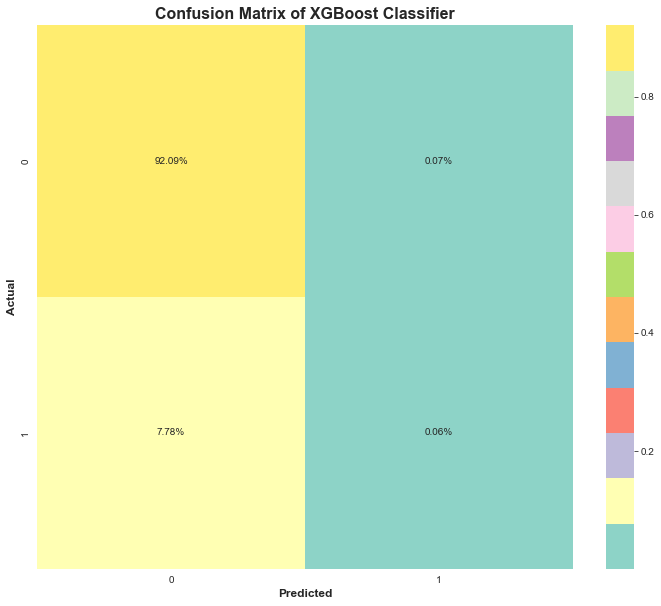

In [318]:
from sklearn.metrics import accuracy_score, recall_score, plot_roc_curve, confusion_matrix, classification_report, precision_recall_curve, auc
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
cf_matrix = confusion_matrix(y_test, y_pred_merged)
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='Set3')
plt.title('Confusion Matrix of XGBoost Classifier', fontweight='bold', fontsize=16)
plt.xlabel('Predicted', fontweight='bold', fontsize=12)
plt.ylabel('Actual', fontweight='bold', fontsize=12)

<h2 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Random Forest Classifier with GridSearchCV</h2>


The random forest is formed in two phases: the first is to combine N decision trees to build the random forest, and the second is to make predictions for each tree created in the first phase.



The following stages and graphic can be used to demonstrate the working process:



Step 1: Pick K data points at random from the training set.



Step 2: Create decision trees for the data points you've chosen (Subsets).



Step 3: Decide on the number N for the decision trees you wish to create.



Step 4: Repetition of Steps 1 and 2.

In [319]:

Image(url="https://cdn.analyticsvidhya.com/wp-content/uploads/2020/02/rfc_vs_dt1.png", width=900, height=900)


In [320]:
Image(url= "https://miro.medium.com/max/1400/1*cBaV_bLVW-gT6PkG5ve26A.png", width=900, height=900)

In [321]:
data_pipeline_merged = ColumnTransformer([
    ("num_pipeline", numrical_pipeline, num_x),
    ("cat_pipeline", categorical_pipeline, cat_x)], remainder = 'drop')

model_rf = Pipeline(steps=[('data_pipeline_merged',data_pipeline_merged),
                         ('classifier', RandomForestClassifier())])

In [323]:
param_grid = { 
   'classifier__n_estimators': [100,200],
    'classifier__criterion':['gini','entropy']
}
gs_rf = GridSearchCV(model_rf,param_grid, cv=5, n_jobs = -1, verbose = 2, refit = True)
start = time()

gs_rf.fit(X_train, y_train)

trainAcc  = gs_rf.score(X_train, y_train)
validAcc  = gs_rf.score(X_valid, y_valid)

start = time()
testAcc  = gs_rf.score(X_test, y_test)
test_time = np.round(time() - start, 4)

AUC_rf = roc_auc_score(y_test, grids.predict_proba(X_test)[:, 1])


#del experimentLog
try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["Pipeline", "Dataset", "TrainAcc", "ValidAcc", "TestAcc",
                                               "Train Time(s)",  "Test Time(s)", "Description",])
experimentLog.loc[len(experimentLog)] =[f"GridSearchCV RandomForestClassifier", "HCDR", 
                                        f"{trainAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", f"{testAcc*100:8.2f}%",
                                        train_time, test_time,
                                        "GridSearchCV RandomForestClassifier pipeline with Cat+Num features"]

experimentLog

Fitting 5 folds for each of 4 candidates, totalling 20 fits


,Pipeline,Dataset,TrainAcc,ValidAcc,TestAcc,Train Time(s),Test Time(s),Description
0,Baseline 1 LogReg,HCDR,91.964%,91.791%,91.851%,6.3786,0.2196,Baseline 1 LogReg pipeline with Cat+Num features
1,Baseline 1 LogReg,HCDR,91.964%,91.865%,91.865%,9.8333,0.3966,Baseline 1 LogReg pipeline with Cat+Num features
2,GridSearchCV LogReg without weights balanced,HCDR,92.34%,92.15%,92.15%,9.8333,0.0464,GridSearchCV LogReg pipeline with Cat+Num feat...
3,best params LogReg,HCDR,92.34%,92.15%,92.15%,1.7742,0.0442,Baseline 1 LogReg pipeline with Cat+Num features
4,Gridsearch Xgboost with 47 inputs,HCDR,77.45%,75.18%,75.18%,425.8991,0.0824,Xgboost GridSearch with selected features
5,Gridsearch Xgboost with 47 inputs,HCDR,92.41%,92.15%,92.15%,1.8215,0.0792,Xgboost GridSearch with selected features
6,GridSearchCV RandomForestClassifier,HCDR,100.00%,92.17%,92.17%,1.8215,0.2704,GridSearchCV RandomForestClassifier pipeline w...


In [324]:
gs_rf.best_params_

{'classifier__criterion': 'gini', 'classifier__n_estimators': 100}

In [325]:
clf_pipe_merged_rf = make_pipeline(data_pipeline_merged, RandomForestClassifier(n_estimators = 100, random_state = 50, verbose = 1, n_jobs = -1))

start = time()
clf_pipe_merged_rf.fit(X_train, y_train)
trainAcc  = clf_pipe_merged_rf.score(X_train, y_train)
validAcc  = clf_pipe_merged_rf.score(X_valid, y_valid)

start = time()
testAcc  = clf_pipe_merged_rf.score(X_test, y_test)
test_time = np.round(time() - start, 4)
AUC = roc_auc_score(y_test,clf_pipe_merged_rf.predict_proba(X_test)[:,1])


#del experimentLog
try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["Pipeline", "Dataset", "TrainAcc", "ValidAcc", "TestAcc",
                                               "Train Time(s)",  "Test Time(s)",'AUC',"Description",])
experimentLog.loc[len(experimentLog)] =[f"GridSearchCV RandomForestClassifier", "HCDR", 
                                        f"{trainAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", f"{testAcc*100:8.2f}%",
                                        train_time, test_time,
                                        "bestparams RandomForestClassifier pipeline with Cat+Num features"]

experimentLog

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0

,Pipeline,Dataset,TrainAcc,ValidAcc,TestAcc,Train Time(s),Test Time(s),Description
0,Baseline 1 LogReg,HCDR,91.964%,91.791%,91.851%,6.3786,0.2196,Baseline 1 LogReg pipeline with Cat+Num features
1,Baseline 1 LogReg,HCDR,91.964%,91.865%,91.865%,9.8333,0.3966,Baseline 1 LogReg pipeline with Cat+Num features
2,GridSearchCV LogReg without weights balanced,HCDR,92.34%,92.15%,92.15%,9.8333,0.0464,GridSearchCV LogReg pipeline with Cat+Num feat...
3,best params LogReg,HCDR,92.34%,92.15%,92.15%,1.7742,0.0442,Baseline 1 LogReg pipeline with Cat+Num features
4,Gridsearch Xgboost with 47 inputs,HCDR,77.45%,75.18%,75.18%,425.8991,0.0824,Xgboost GridSearch with selected features
5,Gridsearch Xgboost with 47 inputs,HCDR,92.41%,92.15%,92.15%,1.8215,0.0792,Xgboost GridSearch with selected features
6,GridSearchCV RandomForestClassifier,HCDR,100.00%,92.17%,92.17%,1.8215,0.2704,GridSearchCV RandomForestClassifier pipeline w...
7,GridSearchCV RandomForestClassifier,HCDR,100.00%,92.17%,92.17%,1.8215,0.0922,bestparams RandomForestClassifier pipeline wit...


In [326]:
y_pred_merged = gs_rf.predict(X_test)

In [327]:
res_merged = gs_rf.predict_proba(X_train)
res_merged

array([[0.37, 0.63],
       [0.97, 0.03],
       [0.97, 0.03],
       ...,
       [0.43, 0.57],
       [0.99, 0.01],
       [0.97, 0.03]])

# Validation Accuracy


In [328]:
print('Validation set accuracy score: ' + str(accuracy_score(y_test,y_pred_merged)))

Validation set accuracy score: 0.9217396683989112


### Loss function used (data loss and regularization parts) in latex


source: https://tex.stackexchange.com/questions/517834/how-to-define-loss-function-in-latex

In [329]:
from IPython.display import display, Math, Latex

In [330]:
display(Math(r'[L_\varepsilon(y,f(x,w))=\max\{0, |y-f(x,w)|-\varepsilon\}]'))

<IPython.core.display.Math object>

In [331]:
from sklearn.metrics import log_loss

log_loss(y_test,y_pred_merged)

2.7030160937615704

<h3 style = "font-family: Times New Roman;background-color:#CbC3E3  "> ROC-AUC Score</h3>


In [332]:
from sklearn.metrics import roc_auc_score

roc_auc_score(y_test, gs_rf.predict_proba(X_test)[:, 1])

0.6982275132177017

Text(88.0, 0.5, 'Actual')

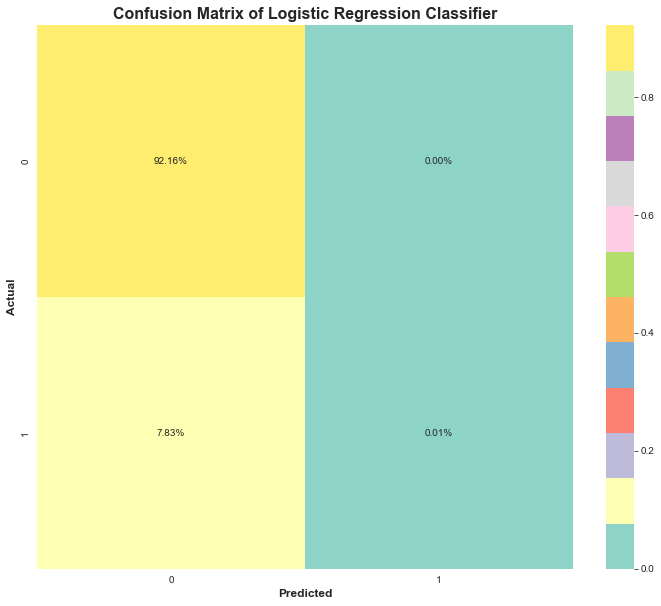

In [333]:
from sklearn.metrics import accuracy_score, recall_score, plot_roc_curve, confusion_matrix, classification_report, precision_recall_curve, auc
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
plt.figure(figsize = (12,10))
cf_matrix = confusion_matrix(y_test, y_pred_merged)
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='Set3')
plt.title('Confusion Matrix of Logistic Regression Classifier', fontweight='bold', fontsize=16)
plt.xlabel('Predicted', fontweight='bold', fontsize=12)
plt.ylabel('Actual', fontweight='bold', fontsize=12)

In [380]:
AUC = pd.DataFrame(d)


In [379]:
d = {'Model ':['Logistic regression','Random forest','XGBoost'],
    'AUC Score':[auc_logreg,AUC_rf,auc_xg
]}

In [381]:
AUC

,Model,AUC Score
0,Logistic regression,0.734672
1,Random forest,0.734672
2,XGBoost,0.751766


<div id='phase_3'><h1> Phase 3 </h1></div>

In [2]:
import warnings
warnings.simplefilter('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import re
from time import time
from scipy import stats
import json

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.metrics import make_scorer, roc_auc_score, log_loss, accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelEncoder,MinMaxScaler

from sklearn.metrics import confusion_matrix
from IPython.display import display, Math, Latex
from sklearn.linear_model import Lasso,Ridge,LogisticRegression
from sklearn.svm import SVC

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier

In [2]:
app_train= pd.read_csv('final_2.csv')
app_train.head()

,Unnamed: 0,SK_ID_CURR,DAYS_CREDIT,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,MONTHS_BALANCE,AMT_CREDIT_SUM_LIMIT,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,...,FLAG_DOCUMENT_6,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_PCT,CREDIT_INCOME_PCT,ANNUITY_INCOME_PCT,CREDIT_TERM_PCT
0,0,100002,-1043.0,40761.0,-758.0,-26.0,0.0,1,Cash loans,M,...,0,0,0,0,0.0,1.0,0.067329,2.007889,0.121978,0.060749
1,1,100010,-1939.5,495000.0,-578.0,-46.0,0.0,0,Cash loans,M,...,0,0,0,0,0.0,0.0,0.023820,4.250000,0.116875,0.027500
2,2,100019,-495.0,360000.0,-26.5,-8.0,135000.0,0,Cash loans,M,...,0,0,0,0,0.0,1.0,0.132562,1.903314,0.128000,0.067251
3,3,100032,-1169.5,331875.0,-520.5,-28.0,0.0,0,Cash loans,M,...,0,0,0,0,0.0,0.0,0.077376,2.906880,0.211800,0.072862
4,4,100033,-195.0,675000.0,-169.0,-3.0,0.0,0,Cash loans,M,...,0,0,0,0,1.0,1.0,0.179708,2.929000,0.213617,0.072932


In [3]:
list(app_train.columns)

['Unnamed: 0',
 'SK_ID_CURR',
 'DAYS_CREDIT',
 'AMT_CREDIT_SUM',
 'DAYS_CREDIT_UPDATE',
 'MONTHS_BALANCE',
 'AMT_CREDIT_SUM_LIMIT',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY_x',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_PHONE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_16',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'DAYS_EMPLOYED_PCT',
 'CREDIT_INCOME_PCT

In [4]:
y = app_train['TARGET']
X = app_train.drop(['SK_ID_CURR','TARGET'], axis = 1)

In [5]:
app_train_null = X.isna().sum().reset_index().rename(columns={'index':'col_name',0:'null_count'})
app_train_null['count_%'] = app_train_null['null_count']/len(X)*100
app_train_null = app_train_null[app_train_null['count_%'] <= 30]
app_train_null

,col_name,null_count,count_%
0,Unnamed: 0,0,0.0
1,DAYS_CREDIT,0,0.0
2,AMT_CREDIT_SUM,0,0.0
3,DAYS_CREDIT_UPDATE,0,0.0
4,MONTHS_BALANCE,0,0.0
5,AMT_CREDIT_SUM_LIMIT,0,0.0
6,NAME_CONTRACT_TYPE,0,0.0
7,CODE_GENDER,0,0.0
8,FLAG_OWN_CAR,0,0.0
9,FLAG_OWN_REALTY,0,0.0


In [6]:
app_train_null['col_type'] = app_train_null['col_name'].apply(lambda x: X[x].dtype)
app_train_null[app_train_null['count_%'] > 0]

,col_name,null_count,count_%,col_type


In [7]:
X_feature = app_train[app_train_null['col_name'].tolist() + ['TARGET']]
X_feature['NAME_TYPE_SUITE'].fillna('Other_C', inplace=True) 
X_feature.head()

,Unnamed: 0,DAYS_CREDIT,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,MONTHS_BALANCE,AMT_CREDIT_SUM_LIMIT,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,...,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_PCT,CREDIT_INCOME_PCT,ANNUITY_INCOME_PCT,CREDIT_TERM_PCT,TARGET
0,0,-1043.0,40761.0,-758.0,-26.0,0.0,Cash loans,M,N,Y,...,0,0,0,0.0,1.0,0.067329,2.007889,0.121978,0.060749,1
1,1,-1939.5,495000.0,-578.0,-46.0,0.0,Cash loans,M,Y,Y,...,0,0,0,0.0,0.0,0.023820,4.250000,0.116875,0.027500,0
2,2,-495.0,360000.0,-26.5,-8.0,135000.0,Cash loans,M,Y,Y,...,0,0,0,0.0,1.0,0.132562,1.903314,0.128000,0.067251,0
3,3,-1169.5,331875.0,-520.5,-28.0,0.0,Cash loans,M,N,Y,...,0,0,0,0.0,0.0,0.077376,2.906880,0.211800,0.072862,0
4,4,-195.0,675000.0,-169.0,-3.0,0.0,Cash loans,M,Y,Y,...,0,0,0,1.0,1.0,0.179708,2.929000,0.213617,0.072932,0


In [8]:
temp_col_reqd =app_train_null[app_train_null['null_count'] != 0].reset_index(drop=True)['col_name'].tolist()
for col in temp_col_reqd:
    if 'AMT_REQ_CREDIT' in col:
        print("columns to be filled with 0 is: {}".format(col))
        X_feature[col].fillna(0,inplace=True)   
for col in temp_col_reqd:
    if 'CNT_SOCIAL_CIRCLE' in col:
        print("columns to be filled with 0 is: {}".format(col))
        X_feature[col].fillna(0,inplace=True) 
for col in temp_col_reqd:
    if 'CNT_FAM_MEMBERS' in col:
        print("columns to be filled with median is: {}".format(col))
        X_feature[col].fillna(X_feature[col].median(),inplace=True)  

In [9]:
def fill_category_value(a):
    if a['AMT_GOODS_PRICE'] == np.inf:
        return plt_app_train[plt_app_train['NAME_FAMILY_STATUS']==a['NAME_FAMILY_STATUS']]['AMT_GOODS_PRICE'].values[0]
    else:
        return a['AMT_GOODS_PRICE']

for col in temp_col_reqd:
    X_feature['AMT_GOODS_PRICE'] = X_feature['AMT_GOODS_PRICE'].fillna(np.inf)
    if 'AMT_GOODS_PRICE' in col:
        print("filled with category median is: {}".format(col))
        X_feature['AMT_GOODS_PRICE'] = X_feature.apply(lambda a: fill_category_value(a),axis=1)


In [10]:
le = LabelEncoder()
temp_corr_df = pd.DataFrame()
for col in X_feature.columns.tolist():
    if X_feature[col].dtype == 'int':
        l = [col, X_feature['EXT_SOURCE_2'].corr(X_feature[col])]
    else:
        l = [col, X_feature['EXT_SOURCE_2'].corr(pd.DataFrame(LabelEncoder().fit_transform(X_feature[[col]]))[0])]
    temp_corr_df = temp_corr_df.append(pd.Series(l),ignore_index=True)
temp_corr_df = temp_corr_df.rename(columns={0:'col_name',1:'correlation_with_EXT_2'})
temp_corr_df['correlation_with_EXT_2'] = abs(temp_corr_df['correlation_with_EXT_2'])
temp_corr_df.sort_values(by='correlation_with_EXT_2',ascending=False).head(6).tail(5)

,col_name,correlation_with_EXT_2
27,REGION_RATING_CLIENT_W_CITY,0.294285
10,AMT_INCOME_TOTAL,0.162634
29,HOUR_APPR_PROCESS_START,0.148863
47,TARGET,0.136423
11,AMT_CREDIT,0.126170


In [11]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

temp_corr_df = pd.DataFrame()

for col in X_feature.columns.tolist():
    if X_feature[col].dtype == 'int':
        l = [col, X_feature['EXT_SOURCE_3'].corr(X_feature[col])]
    else:
        l = [col, X_feature['EXT_SOURCE_3'].corr(pd.DataFrame(LabelEncoder().fit_transform(X_feature[[col]]))[0])]
    temp_corr_df = temp_corr_df.append(pd.Series(l),ignore_index=True)
temp_corr_df = temp_corr_df.rename(columns={0:'col_name',1:'correlation_with_EXT_3'})
temp_corr_df['correlation_with_EXT_3'] = abs(temp_corr_df['correlation_with_EXT_3'])
temp_corr_df = temp_corr_df.sort_values(by='correlation_with_EXT_3',ascending=False).head(10).tail(9)
temp_corr_df

,col_name,correlation_with_EXT_3
1,DAYS_CREDIT,0.326126
4,MONTHS_BALANCE,0.324244
3,DAYS_CREDIT_UPDATE,0.300539
19,DAYS_BIRTH,0.195805
47,TARGET,0.179495
22,DAYS_ID_PUBLISH,0.125425
23,FLAG_EMP_PHONE,0.112351
32,EXT_SOURCE_2,0.111785
21,DAYS_REGISTRATION,0.106798


In [12]:
ext_data = X_feature[temp_corr_df['col_name'].tolist()+['EXT_SOURCE_3']]
for col in ext_data.columns.tolist():
    if col != 'EXT_SOURCE_3':
        ext_data[col] = LabelEncoder().fit_transform(X_feature[[col]])

ext3_train = ext_data[ext_data['EXT_SOURCE_3'].notnull()]
ext3_test = ext_data[ext_data['EXT_SOURCE_3'].isnull()]
ext3_train.shape, ext3_test.shape

((92253, 10), (0, 10))

train dataset

In [13]:
Xnull_data = X_feature.isna().sum().reset_index().rename(columns={'index':'col_name',0:'null_count'})
Xnull_data['count_%'] = Xnull_data['null_count']/len(X_feature)*100
Xnull_data = Xnull_data[Xnull_data['count_%']<= 30]
Xnull_data['col_type'] = Xnull_data['col_name'].apply(lambda x: X_feature[x].dtype)
Xnull_data[Xnull_data['count_%'] > 0]

,col_name,null_count,count_%,col_type


In [14]:
X_feature.isna().sum()

Unnamed: 0                     0
DAYS_CREDIT                    0
AMT_CREDIT_SUM                 0
DAYS_CREDIT_UPDATE             0
MONTHS_BALANCE                 0
AMT_CREDIT_SUM_LIMIT           0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
AMT_INCOME_TOTAL               0
AMT_CREDIT                     0
AMT_ANNUITY_x                  0
NAME_TYPE_SUITE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
REGION_POPULATION_RELATIVE     0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
DAYS_REGISTRATION              0
DAYS_ID_PUBLISH                0
FLAG_EMP_PHONE                 0
FLAG_WORK_PHONE                0
FLAG_PHONE                     0
CNT_FAM_MEMBERS                0
REGION_RATING_CLIENT_W_CITY    0
WEEKDAY_APPR_PROCESS_START     0
HOUR_APPR_PROCESS_START        0
REG_CITY_N

In [15]:
X_dump=X_feature

In [16]:
X_feature.shape

(92253, 48)

In [17]:
X_dump.to_csv('training_data_new.csv',index=False)

In [18]:
pd.read_csv('training_data_new.csv').isna().sum()

Unnamed: 0                     0
DAYS_CREDIT                    0
AMT_CREDIT_SUM                 0
DAYS_CREDIT_UPDATE             0
MONTHS_BALANCE                 0
AMT_CREDIT_SUM_LIMIT           0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
AMT_INCOME_TOTAL               0
AMT_CREDIT                     0
AMT_ANNUITY_x                  0
NAME_TYPE_SUITE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
REGION_POPULATION_RELATIVE     0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
DAYS_REGISTRATION              0
DAYS_ID_PUBLISH                0
FLAG_EMP_PHONE                 0
FLAG_WORK_PHONE                0
FLAG_PHONE                     0
CNT_FAM_MEMBERS                0
REGION_RATING_CLIENT_W_CITY    0
WEEKDAY_APPR_PROCESS_START     0
HOUR_APPR_PROCESS_START        0
REG_CITY_N

# Deep Learning on HCDR

In [19]:
from numpy import vstack
from pandas import read_csv
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data import random_split
from torch import Tensor
import torch
import torch.nn as nn
from torch.nn import Linear
from torch.nn import ReLU
from torch.nn import Sigmoid
from torch.nn import Module
from torch.optim import SGD
from torch.nn import MSELoss
from torch.nn import BCELoss
from torch.nn.init import kaiming_uniform_
from torch.nn.init import xavier_uniform_
from sklearn.metrics import make_scorer, roc_auc_score
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()
from sklearn.metrics import mean_squared_error
import math
scaler1 = StandardScaler()


In [20]:
int_x= X_dump.select_dtypes(include='int64')
float_x = X_dump.select_dtypes(include='float64')
num_x = list(pd.concat([int_x,float_x], axis=1))
cat_x = list(X_dump.select_dtypes(include='object'))


In [21]:
application_train_target = pd.DataFrame({'TARGET':X_feature['TARGET']})


In [22]:
X_feature.shape

(92253, 48)

In [23]:
cat_df = X_feature[cat_x]

In [24]:
cat_df = pd.get_dummies(cat_df,drop_first=True)
num_df = X_feature[num_x]
inp_features = pd.merge(num_df, cat_df, left_index=True, right_index=True)
inp_colums = inp_features.columns
application_train = pd.DataFrame(inp_features.loc[:, inp_features.columns != 'TARGET'],columns=inp_colums)


In [29]:
application_train['TARGET'] = application_train_target


In [30]:
application_train=application_train.head(15000)
application_train

,Unnamed: 0,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_PHONE,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_CITY_NOT_WORK_CITY,...,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA
0,0,-9461,-637,-2120,1,0,1,2,10,0,...,0,0,0,0,0,0,0,0,0,0
1,1,-18850,-449,-2379,1,1,0,3,16,1,...,0,0,0,0,0,0,0,0,0,0
2,2,-8728,-1157,-1368,1,0,0,3,6,1,...,0,0,0,0,0,0,0,0,0,0
3,3,-15948,-1234,-3153,1,0,0,2,10,1,...,0,0,0,0,0,0,0,0,0,0
4,4,-9994,-1796,-2661,1,0,0,1,11,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,15006,-13392,-2412,-4906,1,0,0,2,11,0,...,0,0,0,0,0,0,0,0,0,0
14996,15007,-9716,-3167,-800,1,1,0,2,7,1,...,0,0,0,0,0,0,0,0,0,0
14997,15008,-21145,-1366,-4649,1,0,1,2,12,0,...,0,0,0,0,0,0,0,1,0,0
14998,15009,-19871,-4225,-2992,1,0,0,3,12,0,...,0,0,0,0,0,0,0,0,0,0


In [31]:
X = application_train[inp_colums]
len(X.columns.tolist())

128

In [32]:
y = application_train['TARGET']

In [33]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.33, random_state=42)

In [34]:
class MultiLayrProcessing(Module):
    def __init__(self, n_inputs):
        super(MultiLayrProcessing, self).__init__()
        self.hidden1 = Linear(n_inputs, 35)
        kaiming_uniform_(self.hidden1.weight, nonlinearity='relu')
        self.act1 = ReLU()
        self.hidden2 = Linear(35, 15)
        kaiming_uniform_(self.hidden2.weight, nonlinearity='relu')
        self.act2 = ReLU()
        self.hidden3 = Linear(15, 5)
        kaiming_uniform_(self.hidden3.weight, nonlinearity='relu')
        self.act3 = ReLU()
        self.hidden4 = Linear(5, 1)
        xavier_uniform_(self.hidden4.weight)
        self.act4 = Sigmoid()
    def forward(self, X):
        X = self.act1(self.hidden1(X))
        X = self.act2(self.hidden2(X))
        X = self.act3(self.hidden3(X))
        X = self.act4(self.hidden4(X))
        return X

In [35]:
model=MultiLayrProcessing(128)

In [36]:
class t_Data(Dataset):
    
    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data
        
    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]
        
    def __len__ (self):
        return len(self.X_data)

train_data = t_Data(torch.Tensor(X_train.values), 
                       torch.Tensor(y_train.values))


    
test_data = t_Data(torch.Tensor(X_test.values),torch.Tensor(y_test.values))

    
batch_size = 100
n_epochs = 300
batch_no = len(X_train) // batch_size

train_loader = DataLoader(dataset=train_data, batch_size=100, shuffle=True)
test_loader = DataLoader(dataset=test_data, batch_size=100)


In [37]:
criteria = BCELoss()
optim = SGD(model.parameters(), lr=0.01, momentum=0.9)
# enumerate epochs
for epoch in range(200):
    for i, (inputs, targets) in enumerate(train_loader):
        optim.zero_grad()
        yhat = model(inputs)
        targets = targets.unsqueeze(1)
        # calculate loss
        loss = criteria(yhat, targets)
        # plotting on tensorboard
        writer.add_scalar("Loss/train", loss, epoch)
        loss.backward()
        optim.step()

In [38]:
predictions, actuals = list(), list()
for i, (inputs, targets) in enumerate(test_loader):
    yhat = model(inputs)
    yhat = yhat.detach().numpy()
    actual = targets.numpy()
    actual = actual.reshape((len(actual), 1))
    yhat = yhat.round()
    predictions.append(yhat)
    actuals.append(actual)
predictions, actuals = vstack(predictions), vstack(actuals)
acc = accuracy_score(actuals, predictions)
print(acc)

0.9210101010101011


In [39]:
auc = roc_auc_score(actuals, predictions)

In [40]:
auc

0.5

Attempting the same classification job with different epoch iterations, hidden layers, and number of neurons per layer

In [41]:
class MultiLayrProcessing(Module):
    def __init__(self, n_inputs):
        super(MultiLayrProcessing, self).__init__()
        self.hidden1 = Linear(n_inputs, 32)
        kaiming_uniform_(self.hidden1.weight, nonlinearity='relu')
        self.act1 = ReLU()
        self.hidden2 = Linear(32, 14)
        kaiming_uniform_(self.hidden2.weight, nonlinearity='relu')
        self.act2 = ReLU()
        
        self.hidden3 = Linear(14, 1)
        xavier_uniform_(self.hidden3.weight)
        self.act3 = Sigmoid()
    def forward(self, X):
        X = self.act1(self.hidden1(X))
        X = self.act2(self.hidden2(X))
        X = self.act3(self.hidden3(X))
        return X
model=MultiLayrProcessing(128)
class t_Data(Dataset):
    
    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data
        
    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]
        
    def __len__ (self):
        return len(self.X_data)

train_data = t_Data(torch.Tensor(X_train.values), 
                       torch.Tensor(y_train.values))


    
test_data = t_Data(torch.Tensor(X_test.values),torch.Tensor(y_test.values))

    
batch_size = 100
n_epochs = 300
batch_no = len(X_train) // batch_size

train_loader = DataLoader(dataset=train_data, batch_size=32, shuffle=True)
test_loader = DataLoader(dataset=test_data, batch_size=512)
criteria = BCELoss()
optim = SGD(model.parameters(), lr=0.01, momentum=0.9)
for epoch in range(250):
    for i, (inputs, targets) in enumerate(train_loader):
        optim.zero_grad()
        yhat = model(inputs)
        targets = targets.unsqueeze(1)
        loss = criteria(yhat, targets)
        # plotting on tensorboard
        writer.add_scalar("Loss/train", loss, epoch)
        loss.backward()
        optim.step()
predictions, actuals = list(), list()
for i, (inputs, targets) in enumerate(test_loader):
    yhat = model(inputs)
    yhat = yhat.detach().numpy()
    actual = targets.numpy()
    actual = actual.reshape((len(actual), 1))
    yhat = yhat.round()
    predictions.append(yhat)
    actuals.append(actual)
predictions, actuals = vstack(predictions), vstack(actuals)
# calculate accuracy
acc = accuracy_score(actuals, predictions)
auc = roc_auc_score(actuals, predictions)
print(acc,auc)

0.9153535353535354 0.49926734953878366


ML reg

In [43]:
class MultiLayrProcessing(Module):
    def __init__(self, n_inputs):
        super(MultiLayrProcessing, self).__init__()
        self.hidden1 = Linear(n_inputs, 140)
        kaiming_uniform_(self.hidden1.weight, nonlinearity='relu')
        self.act1 = ReLU()
        self.hidden2 = Linear(140, 20)
        kaiming_uniform_(self.hidden2.weight, nonlinearity='relu')
        self.act2 = ReLU()
        
        self.hidden3 = Linear(20, 1)
        xavier_uniform_(self.hidden3.weight)
        self.act3 = Sigmoid()
    def forward(self, X):
        X = self.act1(self.hidden1(X))
        X = self.act2(self.hidden2(X))
        X = self.act3(self.hidden3(X))
        return X
model=MultiLayrProcessing(128)
class t_Data(Dataset):
    
    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data
        
    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]
        
    def __len__ (self):
        return len(self.X_data)

train_data = t_Data(torch.Tensor(X_train.values), 
                       torch.Tensor(y_train.values))


    
test_data = t_Data(torch.Tensor(X_test.values),torch.Tensor(y_test.values))

    
batch_size = 100
n_epochs = 300
batch_no = len(X_train) // batch_size

train_loader = DataLoader(dataset=train_data, batch_size=32, shuffle=True)
test_loader = DataLoader(dataset=test_data, batch_size=512)
criteria = MSELoss()
optim = SGD(model.parameters(), lr=0.01, momentum=0.9)
for epoch in range(100):
    for i, (inputs, targets) in enumerate(train_loader):
        optim.zero_grad()
        yhat = model(inputs)
        targets = targets.unsqueeze(1)
        loss = criteria(yhat, targets)

        loss.backward()
        optim.step()
predictions, actuals = list(), list()
for i, (inputs, targets) in enumerate(test_loader):
    yhat = model(inputs)
    yhat = yhat.detach().numpy()
    actual = targets.numpy()
    actual = actual.reshape((len(actual), 1))
    yhat = yhat.round()
    predictions.append(yhat)
    actuals.append(actual)
predictions, actuals = vstack(predictions), vstack(actuals)
# calculate accuracy
acc = accuracy_score(actuals, predictions)
auc = roc_auc_score(actuals, predictions)
print(acc,auc)

0.9210101010101011 0.5


# Tensorboard


In [2]:
%load_ext tensorboard
%tensorboard --logdir runs

###### <h1 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Preparing Test Data</h1>




In [3]:
application_test = pd.read_csv('application_test.csv')

In [4]:
application_test

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,3.0,1.0
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0


In [5]:
l = ['REG_REGION_NOT_WORK_REGION','REG_REGION_NOT_LIVE_REGION',  
'FLAG_DOCUMENT_2',               
'FLAG_DOCUMENT_21',               
'AMT_REQ_CREDIT_BUREAU_DAY',      
'FLAG_EMAIL',                    
'AMT_REQ_CREDIT_BUREAU_QRT',                    
'FLAG_DOCUMENT_4',              
'FLAG_DOCUMENT_17',             
'FLAG_DOCUMENT_11',              
'FLAG_DOCUMENT_9',              
'FLAG_DOCUMENT_15',            
'FLAG_DOCUMENT_18',             
'FLAG_DOCUMENT_8','TOTALAREA_MODE','ELEVATORS_AVG','LIVINGAPARTMENTS_AVG',
                                                                    'LIVINGAREA_AVG','APARTMENTS_MODE','ELEVATORS_MODE',
                                                                    'LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE'
                                             ,'APARTMENTS_MEDI','ELEVATORS_MEDI','LIVINGAPARTMENTS_MEDI','LIVINGAREA_MEDI',
'NONLIVINGAREA_MEDI','NONLIVINGAPARTMENTS_MEDI','FLOORSMIN_MEDI',
                                                                    'FLOORSMAX_MEDI','ENTRANCES_MEDI','FLOORSMAX_MODE','FLOORSMIN_MODE','BASEMENTAREA_MEDI',
                                                                    'BASEMENTAREA_MODE','YEARS_BUILD_MEDI','NONLIVINGAPARTMENTS_MODE','NONLIVINGAREA_MODE','YEARS_BUILD_MEDI',
                                            'YEARS_BUILD_MODE','YEARS_BEGINEXPLUATATION_MEDI','YEARS_BEGINEXPLUATATION_MODE','COMMONAREA_MEDI','COMMONAREA_MODE',
                                                                    'ENTRANCES_MODE','LANDAREA_MODE','LANDAREA_MEDI','DEF_30_CNT_SOCIAL_CIRCLE','OBS_30_CNT_SOCIAL_CIRCLE',
                                                                    'REG_CITY_NOT_LIVE_CITY','REGION_RATING_CLIENT',
                                                                   'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'FLOORSMIN_AVG','DAYS_LAST_PHONE_CHANGE',
                                                                       'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG',
                                                                    'LIVE_CITY_NOT_WORK_CITY','LIVE_REGION_NOT_WORK_REGION','AMT_GOODS_PRICE',
                                                                   'CNT_CHILDREN',
'AMT_REQ_CREDIT_BUREAU_HOUR',
'AMT_REQ_CREDIT_BUREAU_WEEK', 
'FLAG_MOBIL',                    
'FLAG_CONT_MOBILE',              
'FLAG_DOCUMENT_20',              
'FLAG_DOCUMENT_5',               
'FLAG_DOCUMENT_12',              
'FLAG_DOCUMENT_19',
'FLAG_DOCUMENT_10',
'FLAG_DOCUMENT_7']

In [6]:
for i in l:
    if i in application_test.columns:
        application_test = application_test.drop(i,axis=1)

In [7]:
application_test['AMT_CREDIT_TO_ANNUITY_RATIO'] = application_test['AMT_CREDIT'] / application_test['AMT_ANNUITY']


In [8]:
application_test['Tot_EXTERNAL_SOURCE'] = application_test['EXT_SOURCE_2'] + application_test['EXT_SOURCE_3']
application_test['Salary_to_credit'] = application_test['AMT_INCOME_TOTAL']/application_test['AMT_CREDIT']
application_test['Annuity_to_salary_ratio'] = application_test['AMT_ANNUITY']/application_test['AMT_INCOME_TOTAL']

In [10]:
int_x= application_test.select_dtypes(include='int64')
float_x = application_test.select_dtypes(include='float64')
num_attribs = list(pd.concat([int_x,float_x], axis=1))
cat_attribs = list(application_test.select_dtypes(include='object'))


In [65]:

        
le_dict = {}
for col in application_test.columns.tolist():
    if application_test[col].dtype == 'object':
        le = LabelEncoder()
        application_test[col] = application_test[col].fillna("NULL")
        application_test[col] = le.fit_transform(application_test[col])
        le_dict['le_{}'.format(col)] = le


In [68]:
application_test.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,...,FLAG_DOCUMENT_6,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_CREDIT_TO_ANNUITY_RATIO,Tot_EXTERNAL_SOURCE,Salary_to_credit,Annuity_to_salary_ratio
0,100001,0,0,0,1,135000.0,568800.0,20560.5,7,6,...,0,0,0,0,0.0,0.0,27.664697,0.949174,0.237342,0.152300
1,100005,0,1,0,1,99000.0,222768.0,17370.0,7,6,...,0,0,0,0,0.0,3.0,12.824870,0.724617,0.444409,0.175455
2,100013,0,1,1,1,202500.0,663264.0,69777.0,3,6,...,0,0,0,0,0.0,4.0,9.505482,1.310778,0.305308,0.344578
3,100028,0,0,0,1,315000.0,1575000.0,49018.5,7,6,...,0,0,0,0,0.0,3.0,32.130726,1.122381,0.200000,0.155614
4,100038,0,1,1,0,180000.0,625500.0,32067.0,7,6,...,0,0,0,0,NaN,NaN,19.506034,NaN,0.287770,0.178150


In [ ]:
scaler = MinMaxScaler()

application_test = application_test.values


In [75]:
application_test = scaler.fit_transform(application_test)
application_test_dl = DataLoader(application_test, batch_size=32, shuffle=False)
application_test_dl

In [79]:
for i, (inputs, targets) in enumerate(test_loader):
    yhat = model(inputs)
    yhat = yhat.detach().numpy()
    actual = targets.numpy()
    actual = actual.reshape((len(actual), 1))
    yhat = yhat.round()
    predictions.append(yhat)
    actuals.append(actual)
predictions, actuals = vstack(predictions), vstack(actuals)

# calculate accuracy
acc = accuracy_score(actuals, predictions)
auc = roc_auc_score(actuals, predictions)
print(acc,auc)

0.921238101101 0.5


In [3]:
import pandas as pd
  
# dictionary with list object in values
details = {
    'Model' : ['MLP', 'MLP with different params', 'MLP regression'],
    'Accuracy' : [0.921, 0.9153,0.92191101],
    'AUC' : [0.5,0.49,0.51]
}
  
# creating a Dataframe object 
df = pd.DataFrame(details)
  
df

,Model,Accuracy,AUC
0,MLP,0.921000,0.50
1,MLP with different params,0.915300,0.49
2,MLP regression,0.921911,0.51


<div id='kaggle_1'><h1 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Kaggle Submission Phase1</h1></div>


In [ ]:
11-a

In [ ]:
pred= clf_pipe.predict(datasets["application_test"])
pred_df = pd.DataFrame(pred)
pred_df.shape

In [ ]:
pred_df.value_counts()

In [ ]:
pred_proba = clf_pipe.predict_proba(datasets["application_test"])
pred_proba_df = pd.DataFrame(pred_proba)

In [ ]:
pred_proba_df

In [ ]:
class_1_proba = pred_proba_df[[1]]

In [ ]:
datasets['application_test'].head()

In [ ]:
final = pd.DataFrame()

In [ ]:
final['SK_ID_CURR'] = datasets['application_test']['SK_ID_CURR']
final['TARGET'] = class_1_proba[1]

In [ ]:
final

In [ ]:
final = final.set_index('SK_ID_CURR')

In [ ]:
final.to_csv('submission.csv')

Kaggle Submission Screenshot

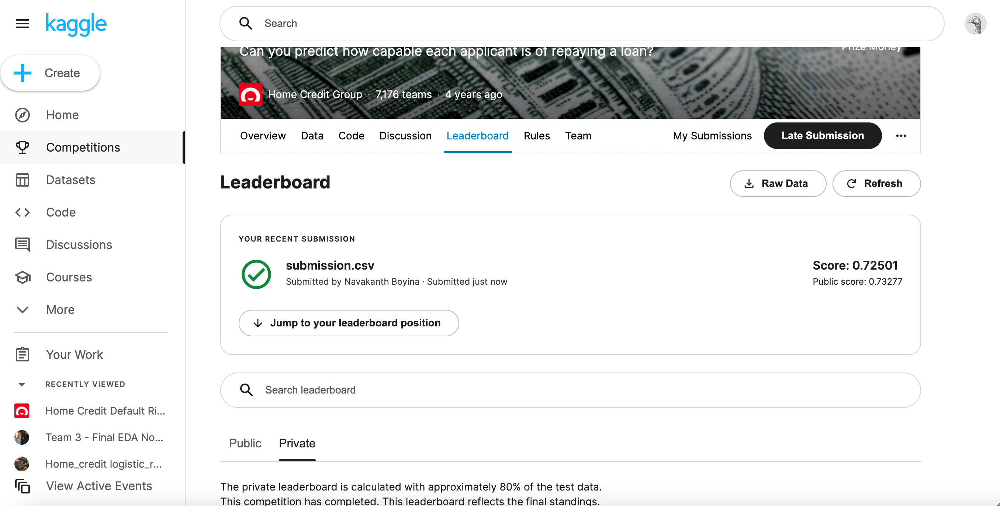


<div id='kaggle_2'><h1 style = "font-family: Times New Roman;background-color:#CbC3E3  "> Kaggle Submission Phase 2</h1></div>


In [350]:
pred2= grids.predict(final_test)
pred_kg2 = pd.DataFrame(pred2)
pred_kg2.shape

(48797, 1)

In [351]:
pred_kg2.value_counts()


0    48776
1       21
dtype: int64

In [352]:
pred_proba_2 = grids.predict_proba(final_test)
pred_proa_df = pd.DataFrame(pred_proba_2)

In [353]:
pred_proba_3 = gs_rf.predict_proba(final_test)
pred_proa_df_log = pd.DataFrame(pred_proba_3)

In [354]:
pred_proa_df


,0,1
0,0.923578,0.076422
1,0.816112,0.183888
2,0.970933,0.029067
3,0.955158,0.044842
4,0.876238,0.123762
...,...,...
48792,0.974293,0.025707
48793,0.944021,0.055979
48794,0.942027,0.057973
48795,0.939041,0.060959


In [355]:
pred_proa_df_log

,0,1
0,0.95,0.05
1,0.84,0.16
2,0.98,0.02
3,0.99,0.01
4,0.88,0.12
...,...,...
48792,0.93,0.07
48793,0.85,0.15
48794,0.85,0.15
48795,0.85,0.15


In [356]:
class_1 = pred_proa_df[[1]]
class_1_log = pred_proa_df_log[[1]]


In [357]:
final_test.head()


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY_x,NAME_TYPE_SUITE,NAME_INCOME_TYPE,...,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,DAYS_EMPLOYED_PCT,CREDIT_INCOME_PCT,ANNUITY_INCOME_PCT,CREDIT_TERM_PCT,AMT_BALANCE_PCT,AVG_INCOME_EXT_PCT,AVG_TOTALINCOME_PCT
0,100001,Cash loans,F,N,Y,135000.0,568800.0,20560.5,Unaccompanied,Working,...,NaN,NaN,NaN,0.121044,4.213333,0.152300,0.036147,NaN,0.567263,237984.936457
1,100005,Cash loans,M,N,Y,99000.0,222768.0,17370.0,Unaccompanied,Working,...,NaN,NaN,NaN,0.247398,2.250182,0.175455,0.077973,NaN,0.429869,230302.648536
2,100013,Cash loans,M,Y,Y,202500.0,663264.0,69777.0,NaN,Working,...,NaN,NaN,NaN,0.222477,3.275378,0.344578,0.105202,NaN,NaN,NaN
3,100028,Cash loans,F,N,Y,315000.0,1575000.0,49018.5,Unaccompanied,Working,...,0.0,2.613636,19.547619,0.133515,5.000000,0.155614,0.031123,-4.4399,0.549372,573382.213537
4,100038,Cash loans,M,Y,N,180000.0,625500.0,32067.0,Unaccompanied,Working,...,NaN,NaN,NaN,0.168021,3.475000,0.178150,0.051266,NaN,NaN,NaN


In [358]:
fp2 = pd.DataFrame()
fp3 = pd.DataFrame()


In [359]:
fp2['SK_ID_CURR'] = final_test['SK_ID_CURR']
fp2['TARGET'] = class_1[1]

In [360]:
fp3['SK_ID_CURR'] = final_test['SK_ID_CURR']
fp3['TARGET'] = class_1_log[1]

In [361]:
fp2

,SK_ID_CURR,TARGET
0,100001,0.076422
1,100005,0.183888
2,100013,0.029067
3,100028,0.044842
4,100038,0.123762
...,...,...
48792,456221,0.025707
48793,456222,0.055979
48794,456223,0.057973
48795,456224,0.060959


In [362]:
fp3

,SK_ID_CURR,TARGET
0,100001,0.05
1,100005,0.16
2,100013,0.02
3,100028,0.01
4,100038,0.12
...,...,...
48792,456221,0.07
48793,456222,0.15
48794,456223,0.15
48795,456224,0.15


In [363]:
fp3 = fp3.drop_duplicates(['SK_ID_CURR'])

In [364]:
sub = pd.read_csv('submission.csv')

In [365]:
l = []
for i in sub['SK_ID_CURR'].tolist():
    if i not in fp2['SK_ID_CURR'].tolist():
        print(i)
        l.append(i)

In [366]:
id_s = sub['SK_ID_CURR'].tolist()
target = sub['TARGET'].tolist()
target_missing = []
for i in l:
    if i in id_s:
        target_missing.append(target[id_s.index(i)])


In [367]:
data = {'SK_ID_CURR': l,
        'TARGET': target_missing} 

In [368]:
new = pd.DataFrame.from_dict(data)

In [369]:
combined_2 = pd.concat([fp2, new], ignore_index=True)

In [370]:
combined_2 = combined_2.set_index('SK_ID_CURR')


In [371]:
fp3 = fp3.set_index('SK_ID_CURR')


In [372]:
combined_2.to_csv('submission_2.csv')


In [373]:
combined_2

,TARGET
SK_ID_CURR,
100001.0,0.076422
100005.0,0.183888
100013.0,0.029067
100028.0,0.044842
100038.0,0.123762
...,...
456221.0,0.025707
456222.0,0.055979
456223.0,0.057973


In [374]:
fp3.to_csv('submission_log.csv')


In [375]:
combined_2.to_csv('submission_2.csv')


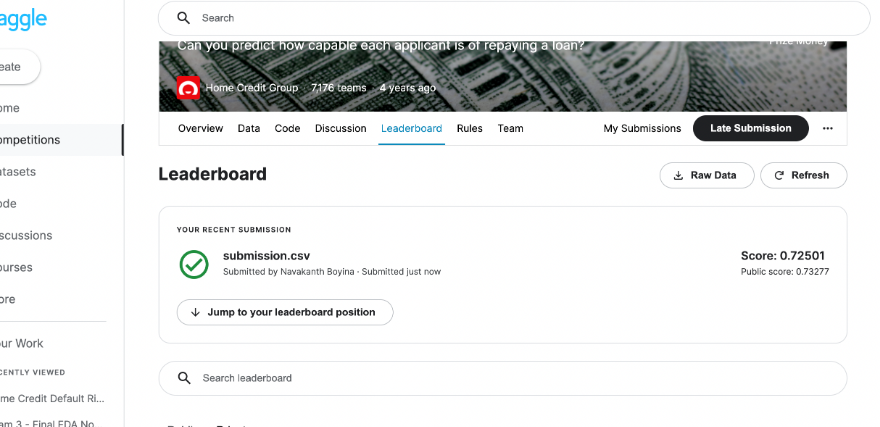

# Results:
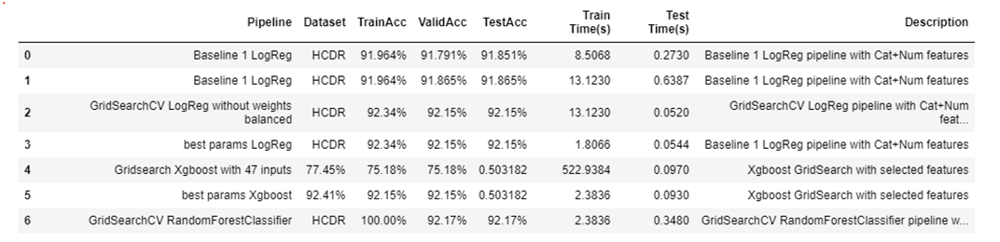

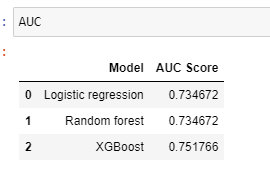

### Conclusion and Future Scope
Initially, we tried merging all the different datasets and created several new columns to understand the relation with target column and gain fruitful insights from the dataset. On analysis, we found out that out of the new columns, a few of them were highly correlated with the target variable, thus helping us improve the model predictions.

Finally, we created a pipeline to perform Logistic Regression, XG Boost and Random Forest Classifier, using Hyperparameter Tuning to gather the best features Successively, we ran our model on the best parameters and found out an increase in the model accuracy and submitted the file on Kaggle.

For the Phase II of this Project, we built Logistic Regression and Random Forest Model, performed Hyperparameter Tuning using GridSearchCV and achieved an accuracy of over 92.17% with Random Forest and 92.15% with Logistic Regression and 50% with XG Boost. Initially, we tried merging all the different datasets and created several new columns to understand the relation with target column and gain fruitful insights from the dataset. On analysis, we found out that out of the new columns, a few of them were highly correlated with the target variable, thus helping us improve the model predictions. Finally, we created a pipeline to perform Logistic Regression and Random Forest Classifier, using Hyperparameter Tuning to gather the best features Successively, we ran our model on the best parameters and found out an increase in the model accuracy and submitted the file on Kaggle. The model which preformed best are logistic Regression and Random Forest on testing data based on the testing accuracy. Xg boost model has achieved 50% but good ROC-AUC score of 0.75 states that model is good but didn’t performed good on testing data.

The next steps in our project would be to improve our model performance through implementation of Neural Networks.

# Multi-Layer Perception Model (MLP) And Pipeline

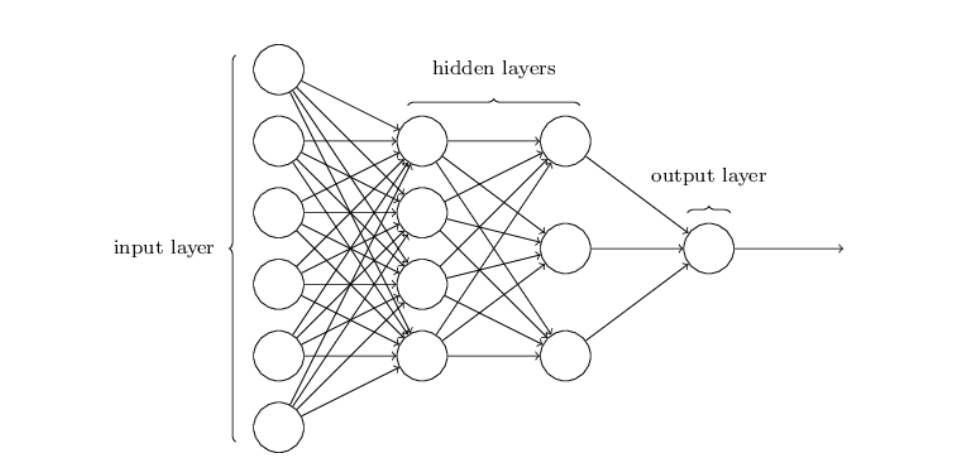

In defining a model, we define the layers of the model. Specifically, we use the forward() function to override the layers and propagate input. While there are many available layers, we exhaustively use Linear, Conv2d, MaxPool2d, RELU and Sigmoid. 
-  Specifically, linear layer connects layers. Conv2d convoluted them, and Maxpool2d pools them. 
-  RELU and Sigmoid layers are activation functions. 
-  Codes for these can be found in our ipynb. 


Train the Model
We use stochastic gradient descent as an optimization algorithm. 
-  We enumerate a loop for training epochs. Then, we code an inner loop for 
mini-batches and stochastic gradient descent. 
Evaluate the Model
We retrieved numpy array, and rounded it to class values. Then, we stored it. 
The last is calculating accuracy. 
 So, we collected the predictions for the test dataset, and compared it to the predictions 
of the expected values of the test set and lastly, calculated the performance metric. 


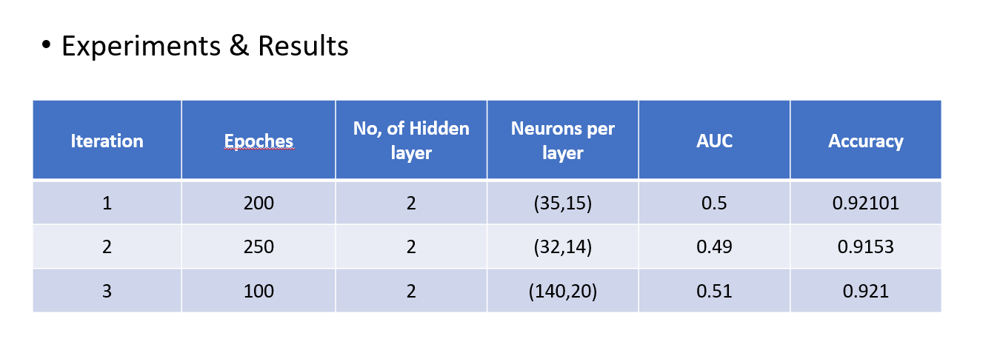

### Conclusion and Future Scope


The goal of the HCDR project is to forecast the repayment capability of the underserved population. This project is significant since both the lender and borrower require well-established projections. HomeCredit will require the highest level of precision to ensure that the data is forecasted accurately because it includes people's lives. Our goal for the future phases is to enhance the AUC score and model accuracy to more than 95 percent, all while doing it in milliseconds.

Many people have difficulty obtaining loans since their credit records are weak or non-existent. Unfortunately, this group is frequently exploited by dishonest lenders. Home credit aims to increase financial access for the unbanked population by delivering a good and secure borrowing experience. To ensure that this underserved demographic has a favorable loan experience, Home Credit uses a range of alternative data, such as telecom and transactional information, to estimate their clients' repayment possibilities.

In phase 1, we did Exploratory Data Analysis, where we discovered several insights into the data and learned a great deal of knowledge about how to extract significant information from it. Following that, we developed a baseline model using pipelines and Logistic Regression, where we learned how to build models, train them, and test them using various metrics. We completed feature engineering in Phase 2 and learned how to design significant features to improve the model. Then we used GridSearchCV to undertake Hyperparameter tweaking, where we learned how to improve accuracy by combining numerous models. In Phase 3, we built an MLP model and then tested it using an AUC score. Finally, while we did not get the anticipated results, we can confidently state that we learned a great deal of confidence and expertise in order to construct a Machine Learning Application,but during phase 2 random forest performed better with approximately same accuracy but the difference of AUC which was huge.

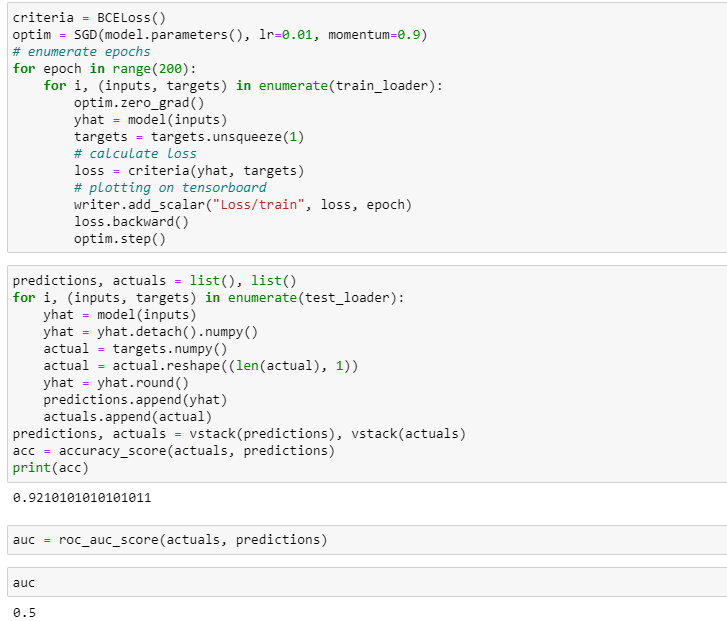


MLP Regression 


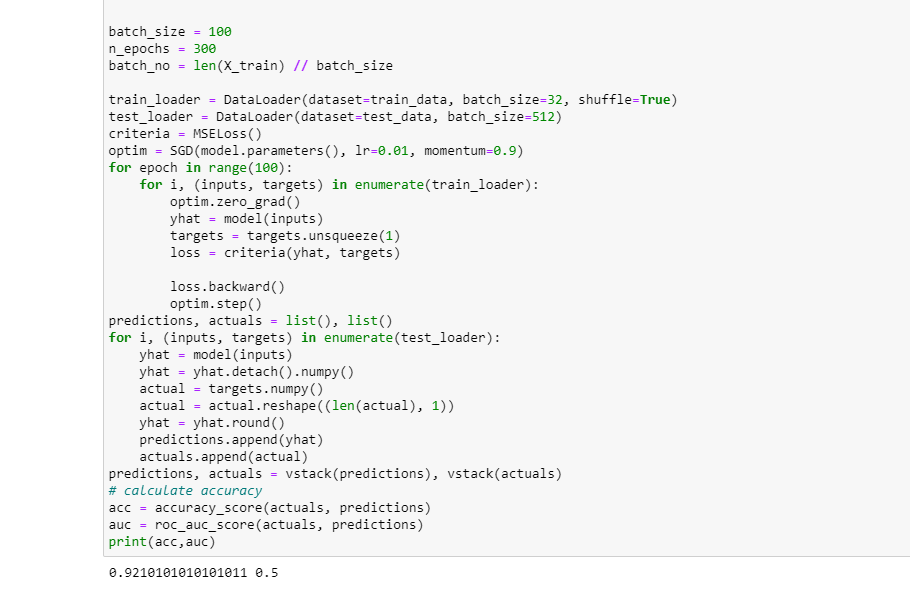

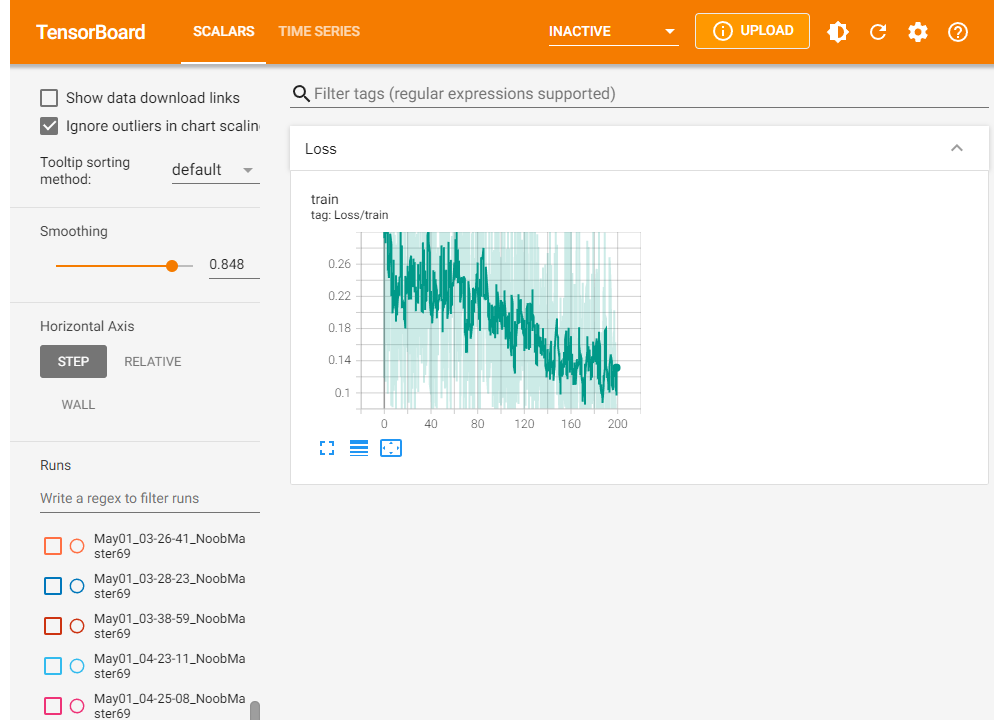

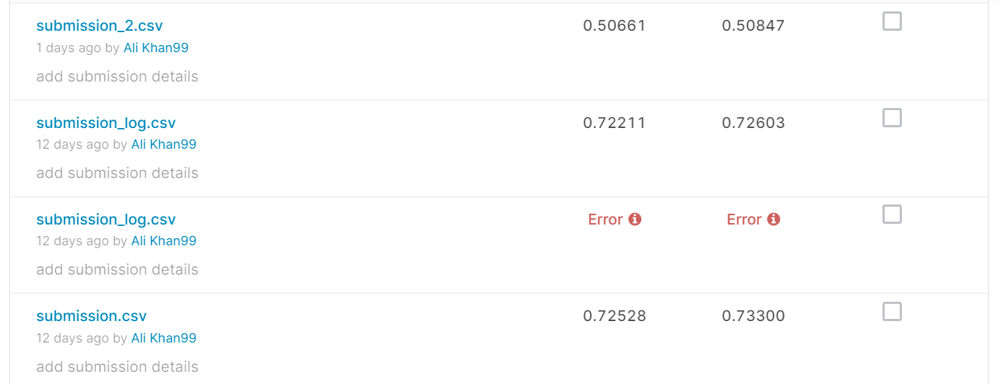

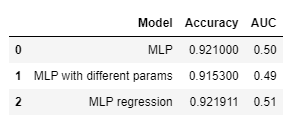

# References

https://github.iu.edu/jshanah/I526_AML_Student/tree/master/Labs/Labs-09-Pipelines-Column_Transformer_2020_10

https://medium.com/machine-learning-researcher/logistic-regression-in-machine-learning-ad4d5fef88bb

https://towardsdatascience.com/optimization-loss-function-under-the-hood-part-ii-d20a239cde11

https://github.com/rakshithvasudev/Home-Credit-Default-Risk

https://machinelearningmastery.com/pytorch-tutorial-develop-deep-learning-models/